In [48]:
import sys
import utils.dataset as dataset
import utils.result_organization as rog
import matplotlib.pyplot as plt 
import numpy as np
from pathlib import Path
import pandas as pd
from utils.evaluation import *
from utils.BEL.results_org import *
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [47]:
def plot_initial(datasets,result_reorg,graph_param={}):
#     graph_param={}
#     graph_param={"xscale":"log"}

    graph_param["title"]="discounted_sum_test_ndcg"
    plot_metrics(result_reorg,plots_y_partition="discounted_sum_test_ndcg",graph_param=graph_param)
    plt.ylabel("NDCG@5")
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
#     plt.savefig("NDCG@5.pdf")
    plt.show()
    graph_param["title"]="shown_item_ratio"
    plot_metrics(result_reorg,plots_y_partition="shown_test_item_ratio",graph_param=graph_param)
    plt.ylabel("shown_test_item_ratio")
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
#     plt.savefig("NDCG@5.pdf")
    plt.show()

    graph_param["title"]="test warm ndcg"
    plot_metrics(result_reorg,plots_y_partition="test_warm_ndcg",graph_param=graph_param)
    plt.ylabel("NDCG@5")
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
#     plt.savefig("NDCG@5.pdf")
    plt.show()
    
    graph_param["title"]="test_cold_ndcg"+datasets
    plot_metrics(result_reorg,plots_y_partition="test_cold_ndcg",graph_param=graph_param)
    plt.ylabel("NDCG@5")
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.show()

    graph_param["title"]="num_shown_test_ids_uniq_"+datasets
    plot_metrics(result_reorg,plots_y_partition="num_shown_test_ids_uniq",graph_param=graph_param)
    plt.ylabel("#of items")
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.show()
    graph_param["title"]="num_existing_vali_ids_uniq_"+datasets
    plot_metrics(result_reorg,plots_y_partition="num_existing_test_item",graph_param=graph_param)
    plt.ylabel("#of items")
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.show()   
    
#     graph_param["title"]="vali_dcg_"+datasets
#     plot_metrics(result_reorg,plots_y_partition="vali_dcg",graph_param=graph_param)
#     plt.ylabel("NDCG@5")
#     plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
#     plt.show()
    
#     graph_param["title"]="ips_vali_ndcg_"+datasets
#     plot_metrics(result_reorg,plots_y_partition="ips_vali_ndcg",graph_param=graph_param)
#     plt.ylabel("NDCG@5")
#     plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
#     plt.show()
#     graph_param["title"]="num_shown_vali_ids_uniq_"+datasets
#     plot_metrics(result_reorg,plots_y_partition="num_shown_vali_ids_uniq",graph_param=graph_param)
#     plt.ylabel("NDCG@5")
#     plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
#     plt.show()
    
    
    graph_param["title"]="Online performance"
    plot_metrics(result_reorg,plots_y_partition="cdcg",graph_param=graph_param)
    plt.ylabel("cdcg@5")
    plt.xlabel("num. of sessions ")
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.show()
    graph_param["title"]="dcg_"+datasets
    plot_metrics(result_reorg,plots_y_partition="dcg",graph_param=graph_param)
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.show()
    graph_param["title"]="ndcg_"+datasets
    plot_metrics(result_reorg,plots_y_partition="ndcg",graph_param=graph_param)
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.show()
    graph_param["title"]="discounted_sum_cdcg_"+datasets
    plot_metrics(result_reorg,plots_y_partition="discounted_sum_cdcg",graph_param=graph_param)
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.show()
    graph_param["title"]="discounted_sum_dcg"+datasets
    plot_metrics(result_reorg,plots_y_partition="discounted_sum_dcg",graph_param=graph_param)
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.show()
    graph_param["title"]="Online performance"
    plot_metrics(result_reorg,plots_y_partition="discounted_sum_ndcg",graph_param=graph_param)
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.ylabel("Cumulative NDCG@5")
#     plt.savefig("Cumulative NDCG@5.pdf")
    plt.show()
    graph_param["title"]="mean_std_corr_"+datasets
    plot_metrics(result_reorg,plots_y_partition="mean_std_corr",graph_param=graph_param)
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.show()
    graph_param["title"]="shown_result_std_"+datasets
    plot_metrics(result_reorg,plots_y_partition="shown_result_std",graph_param=graph_param)
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.show()

#     graph_param["title"]="shown_num_docis_"+datasets
#     plot_metrics(result_reorg,plots_y_partition="shown_num_docis",graph_param=graph_param)
#     plt.show()
    graph_param["title"]="label_mean_corr"+datasets
    plot_metrics(result_reorg,plots_y_partition="label_mean_corr",graph_param=graph_param)
    plt.show()    
    graph_param["title"]="label_std_corr"+datasets
    plot_metrics(result_reorg,plots_y_partition="label_std_corr",graph_param=graph_param)
    plt.show()
def get_validation(result:dict,vali_name,step):
    result_vali={}
    for key, value in result.items():
        print(key,"key validation")
        tradeoff_param=get_best_tradeoff_param(value,vali_name,step)
        if tradeoff_param:
            result_vali[key]=value[tradeoff_param]
        else:
            result_vali[key]=None
    return result_vali

In [7]:
def extract_step_metric(result:dict,metric_name,step,data_name):
    result_return=[]
    for key, value in result.items():
        try:
            result_return.append([key,data_name,value[metric_name][step].tolist()])
        except ValueError: 
            print(value[metric_name][step])
            print(dir(value[metric_name][step]))
#         if "tolist" in dir(value[metric_name][step]):
#             result_return.append([key,data_name,value[metric_name][step].tolist()])
#         else:
#             result_return.append([key,data_name,[]])
    return result_return

In [1]:
import pickle
from  utils.BEL.results_org import *
def dd():
    results_path="/raid/datasets/shared/tao_tem/results.pickle"
    print("found saved results",results_path)
    with open("/raid/datasets/shared/tao_tem/results.pickle", 'rb') as handle:
        result,result_mean = pickle.load(handle)
        result,result_mean =[],[]

In [1]:
import sys
sys.path.insert(3,"/home/taoyang/research/Tao_lib/BEL1/")
from results_org import *

In [2]:
dd()

found saved results /raid/datasets/shared/tao_tem/results.pickle


ModuleNotFoundError: No module named 'results_org'

In [12]:
import 
results_path="/raid/datasets/shared/tao_tem/results.pickle"
with open(results_path, 'rb') as handle:
            result,result_mean = pickle.load(handle)

ModuleNotFoundError: No module named 'results_org'

In [8]:
def return_table(paths_data_result,paths_data_dict,vali_name,step,metric_name,update):
    result_table=None
    for path in paths_data_dict:
        datasets=paths_data_dict[path]
        result=paths_data_result[path]
        feature_settings=["no_behav",'add_click',"add_ips",'add_ctr']
        feature_settings_rename={"no_behav":"w/o-behav.",'add_ips':"w-ips",'add_click':"w-click",'add_ctr':"add_ctr"}
        data_rename={"MSLR-WEB30k_beh_rm1%":"MSLR-toy",\
                     "MSLR-WEB30k_beh_rm":"MSLR-WEB30k",\
                     "MSLR-WEB10k_beh_rm":"MSLR-WEB10k",\
                    "istella-s":"istella-s",\
                    "Webscope_C14_Set1":"Yahoo!",
                    "NP2003":"NP2003",\
                    "NP2004":"NP2004",\
                    "MQ2007":"MQ2007",\
                    "MQ2008":"MQ2008"}
        setting_dict={"feature_settings":feature_settings,\
                      "feature_settings_rename":feature_settings_rename,\
                     "datasets":datasets,\
                     "data_rename":data_rename,\
                     "vali_name":vali_name,\
                     "step":step,\
                     "result":result,\
                     "metric_name":metric_name,\
                     "update":update}
        result_cur=get_performance(**setting_dict)
        print(type(result_cur),"type")
        if result_table is not None:
            result_table=result_table.join(result_cur)
        else:
            result_table=result_cur
    return result_table

In [182]:
def get_performance(vali_name,metric_name,step,result,feature_settings,feature_settings_rename,datasets,data_rename,update):
    result_final=[]
    for feature_setting in feature_settings:
        
        for dataset in  datasets:
#             if feature_setting=="add_ctr" and "NP" in dataset:
#                 continue
            print(feature_setting,dataset,"feature_setting,dataset,")
            result_validated={}
            result_validated[feature_settings_rename[feature_setting]+"Top-k"]= result[feature_setting][dataset]["random_tradeoff"][update]["tradeoff_0.0"]
            result_validated[feature_settings_rename[feature_setting]+"Random-k"]= result[feature_setting][dataset]["random_tradeoff"][update]["tradeoff_100.0"]

            result_cur={
#                 feature_settings_rename[feature_setting]+"_ucb":result[feature_setting][dataset]["std_proposional"][update],\
                       feature_settings_rename[feature_setting]+"_epsilo":result[feature_setting][dataset]["random_tradeoff"][update],\
                       }
            if "std_proposional" in result[feature_setting][dataset]:
                result_cur[feature_settings_rename[feature_setting]+"_ucb"]=result[feature_setting][dataset]["std_proposional"][update]
            print(dataset,feature_setting)
            result_validated.update(get_validation(result_cur,vali_name,step))
#             print(result_validated,"fdas")
#             print("begin pdgd")
            if "PDGD" in result[feature_setting][dataset]:
                result_validated[feature_settings_rename[feature_setting]+"pdgd"]= result[feature_setting][dataset]["PDGD"][update]["tradeoff_1.0"]
            result_validated=extract_step_metric(result_validated,metric_name,step,data_rename[dataset])
            print(result_validated,"result_validated")
            result_final=result_final+result_validated
    #         print(result_validated)
    for dataset in  datasets:
        print(dataset,"merge_ucb")
        result_cur={"merge_ucb":result["no_behav"][dataset]["merge_ucb"][update],\
                    "merge_epsilo":result["no_behav"][dataset]["merge_random_tradeoff"][update],\
                           }
        result_validated=get_validation(result_cur,vali_name,step)
        result_validated["merge_Top-k"]= result["no_behav"][dataset]["merge_random_tradeoff"][update]["tradeoff_0.0"]
        result_validated["merge_Random-k"]= result["no_behav"][dataset]["merge_random_tradeoff"][update]["tradeoff_1000.0"]
        result_validated=extract_step_metric(result_validated,metric_name,step,data_rename[dataset])
        result_final=result_final+result_validated
    for dataset in  datasets:
        print(dataset,"ips_ucb")
        result_cur={"ips_ucb":result["no_behav"][dataset]["ips_ucb"][update],\
                    "ips_random_tradeoff":result["no_behav"][dataset]["ips_random_tradeoff"][update],
                           }
        result_validated=get_validation(result_cur,vali_name,step)
        result_validated["ips_Top-k"]= result["no_behav"][dataset]["ips_random_tradeoff"][update]["tradeoff_0.0"]
        result_validated["ips_Random-k"]= result["no_behav"][dataset]["ips_random_tradeoff"][update]["tradeoff_100.0"]
        result_validated=extract_step_metric(result_validated,metric_name,step,data_rename[dataset])
        result_final=result_final+result_validated
         
        
    result_dfram=pd.DataFrame(result_final, columns=["method","datasets","metrics"])
    print(result_dfram)
    result_dfram=result_dfram.pivot(index='method', columns='datasets', values='metrics')
#     print(result_dfram)
    return result_dfram
def latex_two_f(x, y):                      # this is a demo function that takes in two ints and 
    if x>1:
        x="{:#.4G}".format(x)
    else:
        x="{:.3f}".format(x)
    if y>1:
        y="{:#.4G}".format(y)
    else:
        y="{:.3f}".format(y)
    return "&"+str(x) + "\$_{("+str(y)+")}\$"        # concatenate them as str
vec_latex_two_f = np.vectorize(latex_two_f) 
def latex_single_f(x):                      # this is a demo function that takes in two ints and 
    if x>1:
        x="{:#.3G}".format(x)
    else:
        x="{:.3f}".format(x)
    return "&"+str(x)        # concatenate them as str
vec_latex_single_f = np.vectorize(latex_single_f) 
def to_latex(result_dataframe):
    std=result_dataframe.applymap(func=np.std)
    mean=result_dataframe.applymap(func=np.mean)
    result=pd.DataFrame(vec_latex_single_f(mean),index=mean.index,columns=mean.columns)
    result_std=pd.DataFrame(vec_latex_two_f(mean, std),index=mean.index,columns=mean.columns) 
    return result,result_std
def get_freq_singe(x):
    if not isinstance(x, list):
        if pd.isnull(x):
            return 0
        else:
            return 1
    else:
        return len(x)
def get_round_value(x):
    if not isinstance(x, list):
        return 1
    else:
        return [round(i, 2) for i in x]
def to_round(result_dataframe):
    frequency=result_dataframe.applymap(func=get_round_value)
    return frequency
def to_freq(result_dataframe):
    frequency=result_dataframe.applymap(func=get_freq_singe)
    return frequency

In [120]:
# import pandas as pd
# path="addbehaviour_NP"
# # path="addbehaviour_cold_20k_0.2"
# # datasets="MSLR-WEB30k_beh_rm1%"
# # path="addbehaviour_full"
# result,result_mean=get_result_df(path,groupby="iterations")
# feature_settings=["no_behav",'add_ips','add_click']
# feature_settings_rename={"no_behav":"w/o-behav.",'add_ips':"w-ips",'add_click':"w-click"}
# datasets=["MSLR-WEB30k_beh_rm1%"]
# datasets=["NP2003","NP2004"]
# # datasets=["MQ2007","MQ2008"]
# # datasets=["MSLR-WEB30k_beh_rm","istella-s","Webscope_C14_Set1"]
# # datasets=["MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm","istella-s"]
# data_rename={"MSLR-WEB30k_beh_rm1%":"MSLR-toy",\
#              "MSLR-WEB30k_beh_rm":"MSLR-WEB30k",\
#              "MSLR-WEB10k_beh_rm":"MSLR-WEB10k",\
#             "istella-s":"istella-s",\
#             "Webscope_C14_Set1":"Yahoo!",
#             "NP2003":"NP2003",\
#             "NP2004":"NP2004",\
#             "MQ2007":"MQ2007",\
#             "MQ2008":"MQ2008"}
# vali_name="discounted_sum_dcg"
# step=21
# result=result
# metric_name="discounted_sum_dcg"
# update="n_updates_20"
# setting_dict={"feature_settings":feature_settings,\
#               "feature_settings_rename":feature_settings_rename,\
#              "datasets":datasets,\
#              "data_rename":data_rename,\
#              "vali_name":vali_name,\
#              "step":step,\
#              "result":result,\
#              "metric_name":metric_name,\
#              "update":update}
# rr=get_performance(**setting_dict)

0.01 from [1.e+02 0.e+00 1.e-01 1.e+00 1.e+03 1.e+01 1.e-02]
0.1 from [1.e+01 0.e+00 1.e-01 1.e-02 1.e+02 1.e+03 1.e+00]
1.0 from [1.e+02 1.e+00 0.e+00 1.e-01 1.e+04 1.e+01 1.e+03]


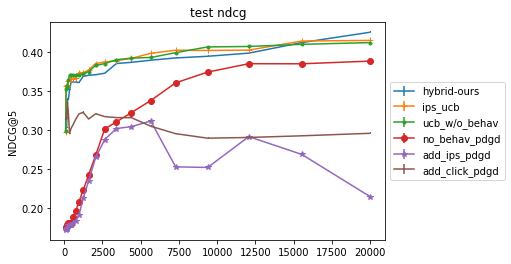

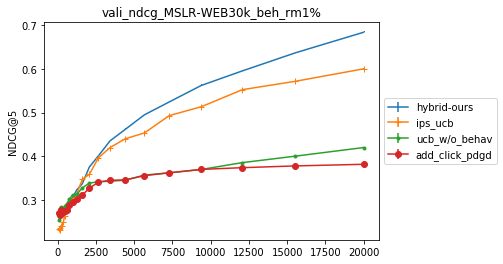

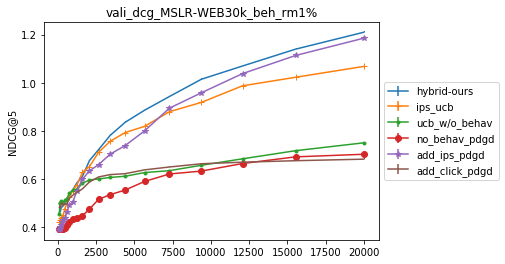

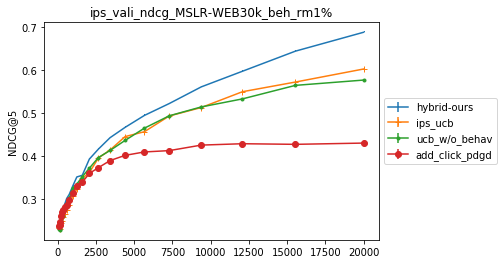

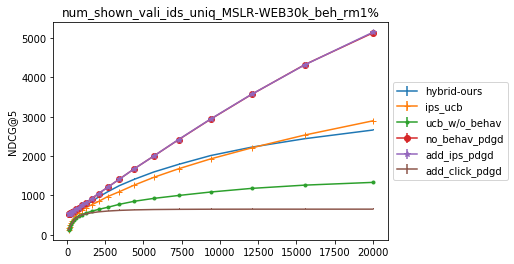

...

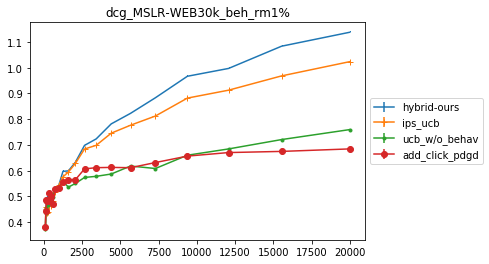

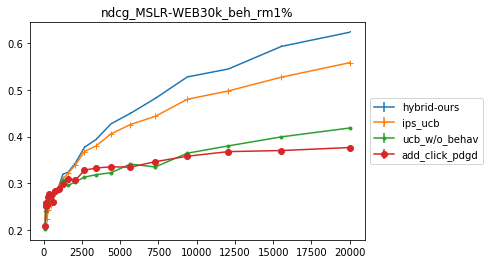

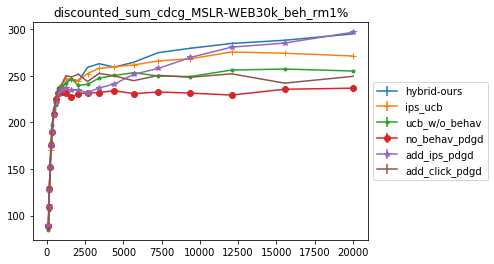

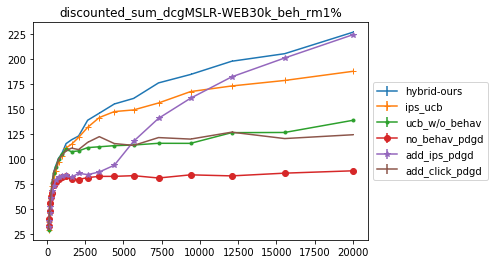

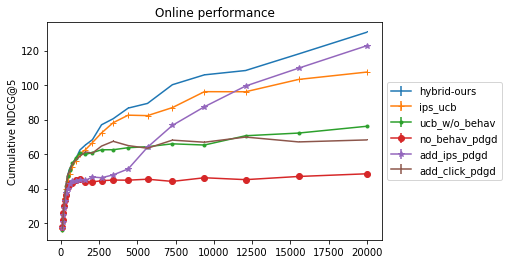

No handles with labels found to put in legend.
No handles with labels found to put in legend.


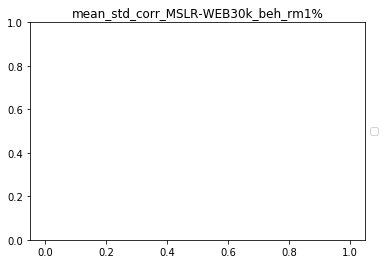

No handles with labels found to put in legend.
No handles with labels found to put in legend.


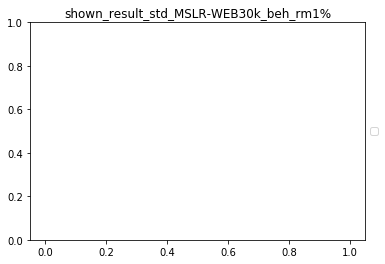

No handles with labels found to put in legend.


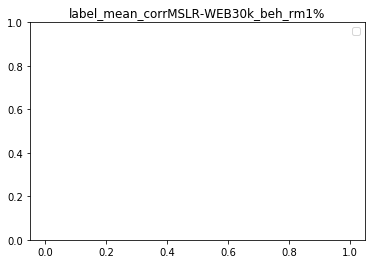

No handles with labels found to put in legend.


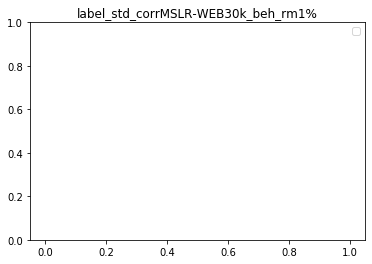

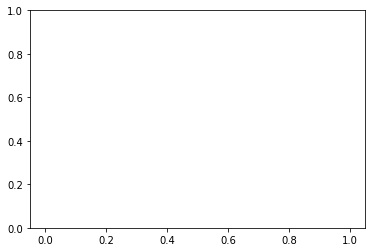

In [71]:
path="addbehaviour_cold_20k"
# datasets="MSLR-WEB30k_beh_rm"
# datasets="istella-s"
# datasets="Webscope_C14_Set1"
# path="addbehaviour_full"
# datasets="MSLR-WEB30k_beh_rm"
datasets="MSLR-WEB30k_beh_rm1%"
update="n_updates_20"
_,result=get_result_df(path,groupby="iterations")
result_reorg={
#             "decay_w_behav":result['add_ips'][datasets]["ucb"]['n_updates_10'],
#             "random_tradeoff_w_behav":result['add_ips'][datasets]["random_tradeoff"][update],
#             "ucb_w_behav":result['add_ips'][datasets]["std_proposional"][update],
#             "ucb_w_click":result['add_click'][datasets]["std_proposional"][update],
#             "random_tradeoff_w_click":result['add_click'][datasets]["random_tradeoff"][update],
            "hybrid-ours":result['no_behav'][datasets]["merge_ucb"][update],
            "ips_ucb":result['no_behav'][datasets]["ips_ucb"][update],
            "ucb_w/o_behav":result['no_behav'][datasets]["std_proposional"][update],
}
vali_name="discounted_sum_dcg"
step=21
result_validated=get_validation(result_reorg,vali_name,step)
# result_validated["ips_topk"]=result['no_behav'][datasets]["ips_ucb"][update]["tradeoff_0.0"]
# result_validated["ucb_w_behav_topk"]=result['add_ips'][datasets]["std_proposional"][update]["tradeoff_0.0"]
# result_validated["ucb_w_click_topk"]=result['add_click'][datasets]["std_proposional"][update]["tradeoff_0.0"]
result_validated["no_behav_pdgd"]=result['no_behav'][datasets]["pdgd"][update]["tradeoff_0.0"]
result_validated["add_ips_pdgd"]=result['add_ips'][datasets]["pdgd"][update]["tradeoff_0.0"]
result_validated["add_click_pdgd"]=result['add_click'][datasets]["std_proposional"][update]["tradeoff_0.0"]
#
# result_validated["hybrid-ours_topk"]=result['no_behav'][datasets]["merge_ucb"][update]["tradeoff_0.0"]
# result_validated["hybrid-ours-100"]=result['no_behav'][datasets]["merge_ucb"][update]["tradeoff_100.0"]
param_plot={"xscale":"linear"}
plot_initial(datasets,result_validated,param_plot)
plt.xscale("linear")

TypeError: expected str, bytes or os.PathLike object, not list

In [190]:
vali_name="discounted_sum_vali_ndcg"
step=19
paths=["addbehaviour_MQ","addbehaviour_NP","addbehaviour_full"]
paths_data_dict={"addbehaviour_NP":["NP2003","NP2004"],\
                 "addbehaviour_MQ":["MQ2007","MQ2008"],\
       "addbehaviour_full":["MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm","istella-s"]}
paths=["addbehaviour_cold_14oct_linear"]
paths_data_dict={"addbehaviour_cold_14oct_linear":["MQ2007","MQ2008","MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm","istella-s"]}
# paths_data_dict={"addbehaviour_cold_rerun":["MQ2007","MQ2008","MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm","istella-s"]}
metric_name="discounted_sum_test_ndcg"
update="n_updates_20"
setting_dict={"paths":paths,
              "paths_data_dict":paths_data_dict,
             "vali_name":vali_name,\
             "step":step,\
             "metric_name":metric_name,\
             "update":update}
result=return_table(**setting_dict)
r,rstd=to_latex(result)
columnsTitles = ['MQ2007', 'MQ2008', 'MSLR-WEB10k',"MSLR-WEB30k","istella-s"]
# columnsTitles = ['MQ2007', 'MQ2008']
r = r.reindex(columns=columnsTitles)
rstd = rstd.reindex(columns=columnsTitles)
display(rstd)
display(r)

TypeError: return_table() got an unexpected keyword argument 'paths'

In [11]:
from utils.BEL import *
path="addbehaviour_cold_29oct_fair/show_prob5"
dd,ddd=results_org.get_result_df(path)

found saved results /raid/datasets/shared/tao_tem/results.pickle


ModuleNotFoundError: No module named 'results_org'

In [2]:
# paths=["addbehaviour_cold_29oct_fair1/show_prob5"]
# paths_data_dict={"addbehaviour_cold_29oct_fair1/show_prob5":["MQ2007","MQ2008","NP2003","NP2004","MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm"]}
paths=["addbehaviour_cold_29oct_fair1/show_prob5"]
paths_data_dict={"addbehaviour_cold_29oct_fair1/show_prob5":["MQ2008"]}

paths_data_result={}
for path in paths_data_dict:
    result_all,result_mean=get_result_df(path,groupby="iterations")
    paths_data_result[path]=result_all
    
vali_name="discounted_sum_vali_cdcg"
step=99
metric_name="discounted_sum_test_ndcg"
update="n_updates_20"
setting_dict={"paths_data_result":paths_data_result,
              "paths_data_dict":paths_data_dict,
             "vali_name":vali_name,\
             "step":step,\
             "metric_name":metric_name,\
             "update":update}
result= rog.return_table(**setting_dict)
r,rstd=rog.to_latex(result)
columnsTitles = ['MQ2007', 'MQ2008',"NP2003","NP2004", 'MSLR-WEB10k',"MSLR-WEB30k","istella-s"]
# columnsTitles = [ 'MQ2008']
r = r.reindex(columns=columnsTitles)
rstd = rstd.reindex(columns=columnsTitles)
display(rstd)
display(r)
freq=rog.to_freq(result)
freq = freq.reindex(columns=columnsTitles)
display(freq)
display(rog.to_round(result))

found saved results
no_behav MQ2008 feature_setting,dataset,
MQ2008 no_behav
['tradeoff_0.0', 'tradeoff_100.0'] 99 dict_keys(['tradeoff_0.0', 'tradeoff_100.0']) tradeoff_params,cur_res_split.keys().index,step


AttributeError: 'AutoVivification' object has no attribute 'index'

In [164]:
# paths=["addbehaviour_cold_29oct_fair1/show_prob5"]
# paths_data_dict={"addbehaviour_cold_29oct_fair1/show_prob5":["MQ2007","MQ2008","NP2003","NP2004","MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm"]}
paths=["addbehaviour_cold_29oct_fair1/show_prob5"]
paths_data_dict={"addbehaviour_cold_29oct_fair1/show_prob5":["MQ2008"]}

paths_data_result={}
for path in paths_data_dict:
    result_all,result_mean=get_result_df(path,groupby="iterations")
    paths_data_result[path]=result_all
    
vali_name="discounted_sum_vali_cdcg"
step=99
metric_name="discounted_sum_test_ndcg"
update="n_updates_20"
setting_dict={"paths_data_result":paths_data_result,
              "paths_data_dict":paths_data_dict,
             "vali_name":vali_name,\
             "step":step,\
             "metric_name":metric_name,\
             "update":update}
result= rog.return_table(**setting_dict)
r,rstd=rog.to_latex(result)
columnsTitles = ['MQ2007', 'MQ2008',"NP2003","NP2004", 'MSLR-WEB10k',"MSLR-WEB30k","istella-s"]
# columnsTitles = [ 'MQ2008']
r = r.reindex(columns=columnsTitles)
rstd = rstd.reindex(columns=columnsTitles)
display(rstd)
display(r)
freq=rog.to_freq(result)
freq = freq.reindex(columns=columnsTitles)
display(freq)
display(rog.to_round(result))

found saved results
dict_keys(['no_behav']) keys
dict_keys(['no_behav']) keys
dict_keys(['no_behav']) keys
MQ2008 merge_ucb
['tradeoff_0.08', 'tradeoff_0.005', 'tradeoff_0.01', 'tradeoff_1000.0', 'tradeoff_10.0', 'tradeoff_0.001', 'tradeoff_0.8', 'tradeoff_1.0', 'tradeoff_100.0', 'tradeoff_0.2', 'tradeoff_0.0', 'tradeoff_0.02', 'tradeoff_0.05', 'tradeoff_0.5', 'tradeoff_0.1'] 99 dict_keys(['tradeoff_0.08', 'tradeoff_0.005', 'tradeoff_0.01', 'tradeoff_1000.0', 'tradeoff_10.0', 'tradeoff_0.001', 'tradeoff_0.8', 'tradeoff_1.0', 'tradeoff_100.0', 'tradeoff_0.2', 'tradeoff_0.0', 'tradeoff_0.02', 'tradeoff_0.05', 'tradeoff_0.5', 'tradeoff_0.1']) tradeoff_params,cur_res_split.keys().index,step
0.5 from [8.e-02 5.e-03 1.e-02 1.e+03 1.e+01 1.e-03 8.e-01 1.e+00 1.e+02 2.e-01
 0.e+00 2.e-02 5.e-02 5.e-01 1.e-01]
['tradeoff_0.001', 'tradeoff_1.0', 'tradeoff_0.0', 'tradeoff_0.005', 'tradeoff_0.5', 'tradeoff_0.2', 'tradeoff_0.01', 'tradeoff_0.1', 'tradeoff_100.0', 'tradeoff_0.8', 'tradeoff_0.05', 't

datasets,MQ2007,MQ2008,NP2003,NP2004,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,,,
Feature-IE_EpsilonRank,NaN,&163.8\$_{(7.314)}\$,NaN,NaN,NaN,NaN,NaN
Feature-IE_Random-k,NaN,&78.12\$_{(3.201)}\$,NaN,NaN,NaN,NaN,NaN
Feature-IE_Top-k,NaN,&152.6\$_{(3.067)}\$,NaN,NaN,NaN,NaN,NaN
Feature-IE_ucb,NaN,&174.8\$_{(3.614)}\$,NaN,NaN,NaN,NaN,NaN


datasets,MQ2007,MQ2008,NP2003,NP2004,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,,,
Feature-IE_EpsilonRank,NaN,&164.,NaN,NaN,NaN,NaN,NaN
Feature-IE_Random-k,NaN,&78.1,NaN,NaN,NaN,NaN,NaN
Feature-IE_Top-k,NaN,&153.,NaN,NaN,NaN,NaN,NaN
Feature-IE_ucb,NaN,&175.,NaN,NaN,NaN,NaN,NaN


datasets,MQ2007,MQ2008,NP2003,NP2004,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,,,
Feature-IE_EpsilonRank,NaN,5,NaN,NaN,NaN,NaN,NaN
Feature-IE_Random-k,NaN,5,NaN,NaN,NaN,NaN,NaN
Feature-IE_Top-k,NaN,5,NaN,NaN,NaN,NaN,NaN
Feature-IE_ucb,NaN,5,NaN,NaN,NaN,NaN,NaN


datasets,MQ2008
method,
Feature-IE_EpsilonRank,"[172.81, 168.06, 161.39, 165.45, 151.17]"
Feature-IE_Random-k,"[78.51, 84.16, 76.56, 76.07, 75.3]"
Feature-IE_Top-k,"[158.27, 151.83, 149.47, 150.48, 152.8]"
Feature-IE_ucb,"[178.34, 171.42, 175.38, 178.95, 169.93]"


In [238]:
datasets="MSLR-WEB30k_beh_rm"
# datasets="MQ2008"
# datasets="MSLR-WEB30k_beh_rm1%"
update="n_updates_20"
path="addbehaviour_cold_29oct_fair/show_prob5"
# result,result_mean=get_result_df(path,groupby="iterations",rerun=True)
result,result_mean=get_result_df(path,groupby="iterations")
# result=result_mean
result_reorg={
            "UCBRank+Feature-IE":result['no_behav'][datasets]["merge_ucb"][update],
            "EpsilonRank+Feature-IE":result['no_behav'][datasets]["merge_random_tradeoff"][update],
#             "ucb_w_corrected":result['add_ips'][datasets]["std_proposional"][update],
#             "ucb_w_clicks":result['add_click'][datasets]["std_proposional"][update],
            
#             "ips_ucb":result['no_behav'][datasets]["ips_ucb"][update],
#             "ucb_w/o_behav":result['no_behav'][datasets]["std_proposional"][update],
}
vali_name="discounted_sum_vali_cdcg"
step=99
result_validated=rog.get_validation(result_reorg,vali_name,step)
# result_validated={}

# result_validated["PDGD_w/o_behav"]=result['no_behav'][datasets]["PDGD"][update]["tradeoff_1.0"]
# result_validated["PDGD_w_clicks"]=result['add_click'][datasets]["PDGD"][update]["tradeoff_1.0"]
result_validated["Top-k+Feature-IE"]=result['no_behav'][datasets]["merge_random_tradeoff"][update]["tradeoff_0.0"]
result_validated["Random-k+Feature-IE"]=result['no_behav'][datasets]["merge_random_tradeoff"][update]["tradeoff_100.0"]
# result_validated["merge_random"]=result['no_behav'][datasets]["merge_ucb"][update]["tradeoff_1000.0"]
# result_validated["w_click_random"]=result['add_click'][datasets]["random_tradeoff"][update]["tradeoff_100.0"]
# result_validated["w_ips_random"]=result['add_ips'][datasets]["random_tradeoff"][update]["tradeoff_100.0"]
# result_validated["hybrid-ours_topk"]=result['no_behav'][datasets]["merge_ucb"][update]["tradeoff_0.0"]
# result_validated["hybrid-ours-100"]=result['no_behav'][datasets]["merge_ucb"][update]["tradeoff_100.0"]
# param_plot={"xscale":"linear"}
# plot_compare_pdgd(datasets,result_validated,param_plot)
# plt.xscale("linear")

found saved results
['tradeoff_0.8', 'tradeoff_1.0', 'tradeoff_0.02', 'tradeoff_1000.0', 'tradeoff_0.0', 'tradeoff_0.001', 'tradeoff_0.05', 'tradeoff_100.0', 'tradeoff_0.01', 'tradeoff_0.1', 'tradeoff_0.08', 'tradeoff_0.2', 'tradeoff_0.005', 'tradeoff_10.0', 'tradeoff_0.5'] 99 dict_keys(['tradeoff_0.8', 'tradeoff_1.0', 'tradeoff_0.02', 'tradeoff_1000.0', 'tradeoff_0.0', 'tradeoff_0.001', 'tradeoff_0.05', 'tradeoff_100.0', 'tradeoff_0.01', 'tradeoff_0.1', 'tradeoff_0.08', 'tradeoff_0.2', 'tradeoff_0.005', 'tradeoff_10.0', 'tradeoff_0.5']) tradeoff_params,cur_res_split.keys().index,step
0.2 from [8.e-01 1.e+00 2.e-02 1.e+03 0.e+00 1.e-03 5.e-02 1.e+02 1.e-02 1.e-01
 8.e-02 2.e-01 5.e-03 1.e+01 5.e-01]
['tradeoff_0.08', 'tradeoff_0.1', 'tradeoff_0.02', 'tradeoff_0.8', 'tradeoff_0.01', 'tradeoff_10.0', 'tradeoff_0.005', 'tradeoff_0.0', 'tradeoff_0.001', 'tradeoff_1000.0', 'tradeoff_1.0', 'tradeoff_0.05', 'tradeoff_100.0', 'tradeoff_0.2', 'tradeoff_0.5'] 99 dict_keys(['tradeoff_0.08', 'trad

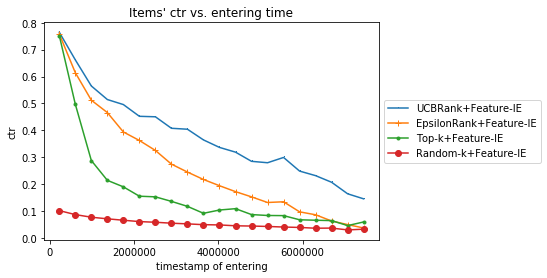

In [242]:
graph_param={}
graph_param["title"]="Items' ctr vs. entering time"
# graph_param["ylim"]=[0,0.3]
plot_metrics(result_validated,plots_y_partition="result_time_stamp_ctr_least_label4",graph_param=graph_param,smoooth_fn=smooth)
plt.ylabel("ctr")
plt.xlabel("timestamp of entering")
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.locator_params(axis="x", nbins=5)
#     plt.savefig("NDCG@5.pdf")
plt.show()

In [212]:
def smooth(y, box_pts=1):
    box = np.ones(box_pts)/box_pts
    y_smooth = np.convolve(y, box, mode='same')
    return y_smooth

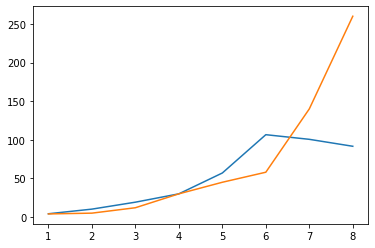

In [124]:
from scipy.interpolate import make_interp_spline, BSpline

#create data
x = np.array([1, 2, 3, 4, 5, 6, 7, 8])
y = np.array([4, 5, 12, 30, 45, 58, 140, 260])

#define x as 200 equally spaced values between the min and max of original x 
xnew = np.linspace(x.min(), x.max(), 200) 

#define spline
spl = make_interp_spline(x, y, k=3)
y_smooth = spl(xnew)
y_smooth = spl(xnew)
#create smooth line chart 
# plt.plot(xnew, y_smooth)
plt.plot(x,smooth(y,5))
plt.plot(x, y)
plt.show()

/home/taoyang/miniconda3/envs/ultra_p36/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """


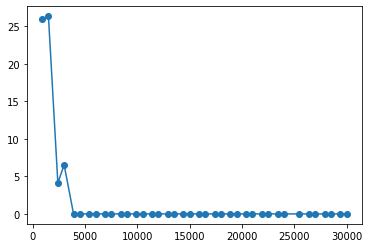

In [71]:
import matplotlib.pyplot as plt
import pandas as pd

def splitSerToArr(ser):
    return [ser.index, ser.as_matrix()]


xs = range(8)
xs=result_validated['$UCB_E$_Hybrid']["iterations"].tolist()
series1 = result_validated['$UCB_E$_Hybrid_topk']["result_time_stamp_clicks_least_label2"].tolist()
series2 = [2, None, 5, None, 4, None, 3, 2]

s1 = pd.Series(series1, index=xs)
# s1=result_validated['$UCB_E$_Hybrid']["result_time_stamp_clicks_least_label2"]
# s2 = pd.Series(series2, index=xs)

plt.plot( *splitSerToArr(s1.dropna()), linestyle='-', marker='o')
# plt.plot( *splitSerToArr(s2.dropna()), linestyle='-', marker='o')

plt.show()

In [34]:
result_validated['$UCB_E$_Hybrid_topk']["result_time_stamp_clicks_least_label2"].tolist()

[31.139474516865818,
 28.183333333333337,
 32.0,
 28.119999999999997,
 35.166666666666664,
 27.25,
 33.88888888888889,
 36.97222222222222,
 25.7,
 18.375,
 20.266666666666666,
 19.933333333333334,
 15.958333333333334,
 19.625,
 35.333333333333336,
 11.0,
 14.75,
 21.625,
 11.5,
 21.666666666666668,
 15.0,
 nan,
 15.3,
 17.666666666666668,
 31.0,
 0.0,
 5.75,
 13.875,
 3.2666666666666666,
 12.666666666666666,
 5.5,
 33.0,
 22.666666666666668,
 0.0,
 0.0,
 9.7,
 4.25,
 10.5,
 8.0,
 0.0,
 8.5,
 7.5,
 0.0,
 8.5,
 19.0,
 9.0,
 16.25,
 0.0,
 11.0,
 0.0,
 0.0,
 0.0,
 16.0,
 nan,
 21.0,
 7.5,
 0.0,
 nan,
 0.0,
 8.0,
 3.75,
 7.0,
 7.0,
 nan,
 2.1666666666666665,
 nan,
 0.0,
 0.0,
 2.0,
 0.0,
 0.0,
 3.8,
 0.0,
 nan,
 0.0,
 9.0,
 6.666666666666667,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.833333333333333,
 3.5,
 nan,
 nan,
 0.0,
 1.5,
 2.0,
 0.0,
 0.0,
 nan,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]

In [42]:
series1 = result_validated['$UCB_E$_Hybrid_topk']
df=series1

In [43]:
df = df[df['result_time_stamp_clicks_least_label2'].notna()]

In [44]:
df

,iterations,initial_test_ndcg,num_existing_item,num_existing_train_item,num_existing_vali_item,num_existing_test_item,train_ndcg,train_dcg,train_cdcg,vali_ndcg,...,discounted_sum_vali_cdcg,overall_vali_cdcg,discounted_sum_test_ndcg,overall_test_ndcg,discounted_sum_test_dcg,overall_test_dcg,discounted_sum_test_cdcg,overall_test_cdcg,result_time_stamp_clicks_least_label1,result_time_stamp_clicks_least_label2
0,300,0.261268,4831.0,3114.4,1028.2,688.4,0.198664,0.324121,1.101690,0.241865,...,62.490511,1.295699,11.916866,0.686844,19.756856,1.090849,50.087843,1.440325,20.967206,31.139475
1,600,0.261268,4975.4,3207.8,1059.2,708.4,0.236827,0.374114,1.114216,0.287874,...,109.506964,1.295699,21.641655,0.686844,37.537878,1.090849,86.865836,1.440325,19.711905,28.183333
2,900,0.261268,5109.6,3292.2,1087.0,730.4,0.256866,0.412827,1.162071,0.274717,...,142.886916,1.295699,32.043568,0.686844,55.350466,1.090849,118.428701,1.440325,21.395000,32.000000
3,1200,0.261268,5242.4,3377.8,1115.2,749.4,0.359156,0.590512,1.209403,0.388202,...,169.067192,1.295699,44.616305,0.686844,75.389539,1.090849,148.757622,1.440325,20.736429,28.120000
4,1500,0.261268,5370.2,3463.6,1139.4,767.2,0.367460,0.589740,1.202653,0.393076,...,191.491797,1.295699,54.192807,0.686844,90.726404,1.090849,169.353521,1.440325,17.017857,35.166667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,28800,0.261268,10270.4,6688.8,2129.6,1452.0,0.535955,0.878212,1.341666,0.596886,...,261.656388,1.295699,150.524977,0.686844,237.670660,1.090849,292.741496,1.440325,0.000000,0.000000
96,29100,0.261268,10302.8,6709.6,2135.6,1457.6,0.551527,0.894404,1.372351,0.567369,...,259.773080,1.295699,149.622491,0.686844,238.273242,1.090849,295.722738,1.440325,0.416667,0.000000
97,29400,0.261268,10328.2,6727.8,2140.2,1460.2,0.530870,0.882016,1.332523,0.598752,...,260.147657,1.295699,149.629577,0.686844,240.862248,1.090849,297.290580,1.440325,0.000000,0.000000
98,29700,0.261268,10357.8,6750.4,2144.0,1463.4,0.512722,0.817964,1.307725,0.549969,...,259.650910,1.295699,149.527407,0.686844,239.031646,1.090849,299.093229,1.440325,0.000000,0.000000


In [38]:
series1.dropna().index

Int64Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
            17, 18, 19, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
            35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
            52, 54, 55, 56, 58, 59, 60, 61, 62, 64, 66, 67, 68, 69, 70, 71, 72,
            74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 87, 88, 89, 90, 91, 93,
            94, 95, 96, 97, 98, 99],
           dtype='int64')

In [64]:
30000-result_validated['$UCB_E$_Hybrid']['iterations']

0       300
1       600
2       900
3      1200
4      1500
      ...  
95    28800
96    29100
97    29400
98    29700
99    30000
Name: iterations, Length: 100, dtype: int64

In [67]:
result_validated['$UCB_E$_Hybrid']["result_time_stamp_clicks_least_label1"]/(30150-result_validated['$UCB_E$_Hybrid']['iterations'])

0     0.000679
1     0.000645
2     0.000737
3     0.000651
4     0.000643
        ...   
95    0.000593
96    0.000794
97    0.002444
98    0.002963
99    0.006667
Length: 100, dtype: float64

In [204]:
paths=["addbehaviour_cold_29oct_fair/show_prob5"]
paths_data_dict={"addbehaviour_cold_29oct_fair/show_prob5":["MQ2007","MQ2008","NP2003","NP2004","MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm"]}
paths_data_result={}
for path in paths_data_dict:
#     result,result_mean=get_result_df(path,groupby="iterations")
    paths_data_result[path]=result
    
vali_name="discounted_sum_vali_cdcg"
step=99
metric_name="discounted_sum_test_ndcg"
update="n_updates_20"
setting_dict={"paths_data_result":paths_data_result,
              "paths_data_dict":paths_data_dict,
             "vali_name":vali_name,\
             "step":step,\
             "metric_name":metric_name,\
             "update":update}
result_table= rog.return_table(**setting_dict)
r,rstd=rog.to_latex(result_table)
columnsTitles = ['MQ2007', 'MQ2008',"NP2003","NP2004", 'MSLR-WEB10k',"MSLR-WEB30k","istella-s"]
# columnsTitles = ['MQ2007', 'MQ2008']
r = r.reindex(columns=columnsTitles)
rstd = rstd.reindex(columns=columnsTitles)
display(rstd)
display(r)
freq=rog.to_freq(result_table)
freq = freq.reindex(columns=columnsTitles)
display(freq)
display(rog.to_round(result_table))

dict_keys(['no_behav', 'add_click', 'add_ctr', 'add_ips']) keys
no_behav MQ2007 feature_setting,dataset,
MQ2007 no_behav
['tradeoff_0.8', 'tradeoff_0.08', 'tradeoff_0.2', 'tradeoff_1.0', 'tradeoff_0.001', 'tradeoff_0.005', 'tradeoff_10.0', 'tradeoff_0.0', 'tradeoff_0.5', 'tradeoff_0.01', 'tradeoff_0.05', 'tradeoff_100.0', 'tradeoff_0.02', 'tradeoff_0.1'] 99 dict_keys(['tradeoff_0.8', 'tradeoff_0.08', 'tradeoff_0.2', 'tradeoff_1.0', 'tradeoff_0.001', 'tradeoff_0.005', 'tradeoff_10.0', 'tradeoff_0.0', 'tradeoff_0.5', 'tradeoff_0.01', 'tradeoff_0.05', 'tradeoff_100.0', 'tradeoff_0.02', 'tradeoff_0.1']) tradeoff_params,cur_res_split.keys().index,step
0.05 from [8.e-01 8.e-02 2.e-01 1.e+00 1.e-03 5.e-03 1.e+01 0.e+00 5.e-01 1.e-02
 5.e-02 1.e+02 2.e-02 1.e-01]
['tradeoff_0.001', 'tradeoff_0.01', 'tradeoff_0.5', 'tradeoff_0.005', 'tradeoff_100.0', 'tradeoff_10000.0', 'tradeoff_0.8', 'tradeoff_0.1', 'tradeoff_10.0', 'tradeoff_0.2', 'tradeoff_0.0', 'tradeoff_0.02', 'tradeoff_0.08', 'tradeoff_1

0.2 from [1.e-03 1.e-02 1.e+00 1.e+02 5.e-03 0.e+00 2.e-02 5.e-01 1.e+01 8.e-02
 5.e-02 1.e-01 8.e-01 2.e-01]
['tradeoff_0.5', 'tradeoff_0.05', 'tradeoff_1000.0', 'tradeoff_100.0', 'tradeoff_10.0', 'tradeoff_10000.0', 'tradeoff_1.0', 'tradeoff_0.02', 'tradeoff_0.0', 'tradeoff_0.005', 'tradeoff_0.1', 'tradeoff_0.001', 'tradeoff_0.2', 'tradeoff_0.01', 'tradeoff_0.8', 'tradeoff_0.08'] 99 dict_keys(['tradeoff_0.5', 'tradeoff_0.05', 'tradeoff_1000.0', 'tradeoff_100.0', 'tradeoff_10.0', 'tradeoff_10000.0', 'tradeoff_1.0', 'tradeoff_0.02', 'tradeoff_0.0', 'tradeoff_0.005', 'tradeoff_0.1', 'tradeoff_0.001', 'tradeoff_0.2', 'tradeoff_0.01', 'tradeoff_0.8', 'tradeoff_0.08']) tradeoff_params,cur_res_split.keys().index,step
10.0 from [5.e-01 5.e-02 1.e+03 1.e+02 1.e+01 1.e+04 1.e+00 2.e-02 0.e+00 5.e-03
 1.e-01 1.e-03 2.e-01 1.e-02 8.e-01 8.e-02]
[['Feature-w-$\\Delta$Top-k', 'MSLR-WEB10k', [75.69488505647176, 87.10731353160634, 94.98145332433239, 75.66305151810562, 76.70551890472943]], ['Feature-

0.2 from [1.e-01 1.e+00 8.e-02 1.e+03 2.e-02 1.e-03 2.e-01 1.e-02 1.e+02 5.e-03
 1.e+01 0.e+00 5.e-01 8.e-01 5.e-02]
['tradeoff_0.8', 'tradeoff_0.005', 'tradeoff_0.05', 'tradeoff_0.2', 'tradeoff_0.0', 'tradeoff_1.0', 'tradeoff_1000.0', 'tradeoff_0.001', 'tradeoff_0.1', 'tradeoff_0.5', 'tradeoff_10.0', 'tradeoff_0.08', 'tradeoff_0.02', 'tradeoff_100.0', 'tradeoff_0.01'] 99 dict_keys(['tradeoff_0.8', 'tradeoff_0.005', 'tradeoff_0.05', 'tradeoff_0.2', 'tradeoff_0.0', 'tradeoff_1.0', 'tradeoff_1000.0', 'tradeoff_0.001', 'tradeoff_0.1', 'tradeoff_0.5', 'tradeoff_10.0', 'tradeoff_0.08', 'tradeoff_0.02', 'tradeoff_100.0', 'tradeoff_0.01']) tradeoff_params,cur_res_split.keys().index,step
0.8 from [8.e-01 5.e-03 5.e-02 2.e-01 0.e+00 1.e+00 1.e+03 1.e-03 1.e-01 5.e-01
 1.e+01 8.e-02 2.e-02 1.e+02 1.e-02]
MSLR-WEB30k_beh_rm merge_ucb
['tradeoff_0.8', 'tradeoff_1.0', 'tradeoff_0.02', 'tradeoff_1000.0', 'tradeoff_0.0', 'tradeoff_0.001', 'tradeoff_0.05', 'tradeoff_100.0', 'tradeoff_0.01', 'tradeoff_

datasets,MQ2007,MQ2008,NP2003,NP2004,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,,,
Feature-IE_EpsilonRank,&151.8\$_{(4.772)}\$,&170.5\$_{(4.069)}\$,&84.58\$_{(29.61)}\$,&90.85\$_{(22.28)}\$,&139.3\$_{(1.802)}\$,&147.5\$_{(2.484)}\$,NaN
Feature-IE_Random-k,&60.40\$_{(2.518)}\$,&76.31\$_{(2.735)}\$,&0.810\$_{(0.122)}\$,&0.602\$_{(0.367)}\$,&60.23\$_{(1.152)}\$,&72.09\$_{(2.025)}\$,NaN
Feature-IE_Top-k,&139.8\$_{(2.722)}\$,&150.5\$_{(5.775)}\$,&28.09\$_{(21.25)}\$,&60.64\$_{(57.38)}\$,&125.6\$_{(1.787)}\$,&135.0\$_{(3.167)}\$,NaN
Feature-IE_ucb,&172.7\$_{(1.354)}\$,&172.2\$_{(3.087)}\$,&142.5\$_{(72.19)}\$,&156.7\$_{(62.34)}\$,&165.4\$_{(2.360)}\$,&166.4\$_{(1.237)}\$,NaN
Feature-w-$\Delta$Random-k,&60.74\$_{(3.563)}\$,&78.42\$_{(3.365)}\$,&2.405\$_{(1.424)}\$,&2.091\$_{(0.926)}\$,&61.48\$_{(1.750)}\$,&74.38\$_{(2.475)}\$,NaN
Feature-w-$\Delta$Top-k,&77.94\$_{(7.139)}\$,&109.4\$_{(5.373)}\$,&43.56\$_{(24.80)}\$,&87.54\$_{(46.99)}\$,&82.03\$_{(7.779)}\$,&96.87\$_{(4.932)}\$,NaN
Feature-w-$\Delta$_EpsilonRank,&96.51\$_{(7.282)}\$,&118.4\$_{(3.096)}\$,&40.81\$_{(26.96)}\$,&87.54\$_{(46.99)}\$,&100.3\$_{(2.618)}\$,&112.4\$_{(3.086)}\$,NaN
Feature-w-$\Delta$_ucb,&167.3\$_{(1.078)}\$,&172.0\$_{(2.651)}\$,&75.81\$_{(19.96)}\$,&131.6\$_{(16.55)}\$,&166.0\$_{(2.684)}\$,&163.6\$_{(2.060)}\$,NaN
Feature-w-$\Delta$pdgd,&110.7\$_{(5.089)}\$,&161.0\$_{(4.570)}\$,&48.27\$_{(26.22)}\$,&54.64\$_{(28.09)}\$,&100.4\$_{(2.371)}\$,&113.0\$_{(4.590)}\$,NaN


datasets,MQ2007,MQ2008,NP2003,NP2004,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,,,
Feature-IE_EpsilonRank,&152.,&171.,&84.6,&90.9,&139.,&148.,NaN
Feature-IE_Random-k,&60.4,&76.3,&0.810,&0.602,&60.2,&72.1,NaN
Feature-IE_Top-k,&140.,&151.,&28.1,&60.6,&126.,&135.,NaN
Feature-IE_ucb,&173.,&172.,&143.,&157.,&165.,&166.,NaN
Feature-w-$\Delta$Random-k,&60.7,&78.4,&2.40,&2.09,&61.5,&74.4,NaN
Feature-w-$\Delta$Top-k,&77.9,&109.,&43.6,&87.5,&82.0,&96.9,NaN
Feature-w-$\Delta$_EpsilonRank,&96.5,&118.,&40.8,&87.5,&100.,&112.,NaN
Feature-w-$\Delta$_ucb,&167.,&172.,&75.8,&132.,&166.,&164.,NaN
Feature-w-$\Delta$pdgd,&111.,&161.,&48.3,&54.6,&100.,&113.,NaN


datasets,MQ2007,MQ2008,NP2003,NP2004,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,,,
Feature-IE_EpsilonRank,5,5,5,5,5,5,NaN
Feature-IE_Random-k,5,5,5,5,4,5,NaN
Feature-IE_Top-k,5,5,5,5,5,4,NaN
Feature-IE_ucb,5,5,5,5,5,4,NaN
Feature-w-$\Delta$Random-k,5,5,5,5,5,5,NaN
Feature-w-$\Delta$Top-k,5,5,5,5,5,5,NaN
Feature-w-$\Delta$_EpsilonRank,5,5,5,5,5,5,NaN
Feature-w-$\Delta$_ucb,5,5,5,5,5,5,NaN
Feature-w-$\Delta$pdgd,5,5,5,5,5,5,NaN


datasets,MQ2007,MQ2008,MSLR-WEB10k,MSLR-WEB30k,NP2003,NP2004
method,,,,,,
Feature-IE_EpsilonRank,"[153.08, 148.61, 156.86, 156.12, 144.2]","[170.28, 171.29, 175.25, 172.79, 163.13]","[139.78, 141.68, 136.88, 137.68, 140.66]","[144.1, 147.92, 146.99, 146.86, 151.8]","[99.43, 43.51, 81.6, 131.13, 67.24]","[108.4, 67.41, 119.13, 62.71, 96.59]"
Feature-IE_Random-k,"[63.91, 56.23, 61.61, 60.54, 59.69]","[77.73, 78.93, 78.82, 72.45, 73.61]","[61.43, 61.17, 59.75, 58.57]","[68.7, 72.26, 74.57, 71.32, 73.58]","[0.85, 0.71, 0.92, 0.63, 0.94]","[0.43, 0.3, 0.23, 0.88, 1.18]"
Feature-IE_Top-k,"[144.09, 139.99, 137.87, 136.07, 140.77]","[159.59, 146.82, 145.34, 145.74, 155.12]","[124.81, 128.56, 123.04, 125.86, 125.55]","[136.19, 138.81, 135.0, 130.09]","[38.57, 0.0, 20.66, 62.86, 18.36]","[21.16, 0.0, 75.86, 42.31, 163.87]"
Feature-IE_ucb,"[174.7, 170.87, 173.81, 172.28, 172.06]","[174.18, 174.31, 172.56, 173.91, 166.18]","[165.97, 165.54, 167.04, 160.83, 167.39]","[165.14, 165.1, 167.59, 167.6]","[200.0, 0.0, 167.19, 175.21, 170.21]","[191.28, 32.17, 185.72, 183.28, 191.05]"
Feature-w-$\Delta$Random-k,"[66.06, 54.83, 60.88, 61.22, 60.72]","[78.46, 82.45, 81.87, 75.02, 74.31]","[61.25, 60.92, 62.99, 58.63, 63.61]","[72.8, 70.59, 75.47, 75.26, 77.81]","[4.03, 2.48, 3.82, 1.4, 0.29]","[1.23, 3.72, 2.02, 1.18, 2.31]"
Feature-w-$\Delta$Top-k,"[80.77, 66.69, 88.75, 77.25, 76.24]","[105.21, 110.52, 111.39, 102.12, 117.68]","[75.69, 87.11, 94.98, 75.66, 76.71]","[94.2, 94.26, 105.93, 91.94, 98.03]","[63.16, 3.12, 72.2, 49.8, 29.52]","[80.31, 0.0, 106.73, 118.21, 132.44]"
Feature-w-$\Delta$_EpsilonRank,"[94.98, 84.27, 105.53, 102.08, 95.7]","[121.12, 116.41, 116.86, 114.8, 123.01]","[96.89, 103.41, 102.09, 97.51, 101.71]","[111.14, 108.44, 112.99, 111.52, 117.8]","[63.33, 0.0, 70.14, 51.72, 18.84]","[80.31, 0.0, 106.73, 118.21, 132.44]"
Feature-w-$\Delta$_ucb,"[165.89, 167.2, 169.18, 166.78, 167.38]","[172.02, 172.87, 169.09, 176.43, 169.5]","[163.01, 163.89, 167.29, 165.43, 170.54]","[160.62, 162.66, 163.38, 166.93, 164.16]","[92.85, 82.38, 51.52, 99.28, 53.04]","[144.44, 140.16, 135.31, 99.03, 139.22]"
Feature-w-$\Delta$pdgd,"[112.71, 101.85, 117.06, 112.81, 109.23]","[166.89, 164.05, 153.4, 159.37, 161.22]","[100.48, 104.46, 97.64, 98.45, 100.88]","[111.34, 112.67, 110.54, 108.81, 121.88]","[67.63, 74.2, 17.06, 66.9, 15.57]","[21.16, 101.63, 30.92, 60.33, 59.14]"


In [192]:

paths=["addbehaviour_cold_29oct_fair/show_prob5"]
paths_data_dict={"addbehaviour_cold_29oct_fair/show_prob5":["MQ2007","MQ2008","NP2003","NP2004","MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm"]}
paths_data_result={}
for path in paths_data_dict:
    result,result_mean=get_result_df(path,groupby="iterations")
    paths_data_result[path]=result

vali_name="discounted_sum_vali_cdcg"
step=99
metric_name="test_warm_ndcg_masked"
update="n_updates_20"
setting_dict={"paths_data_result":paths_data_result,
              "paths_data_dict":paths_data_dict,
             "vali_name":vali_name,\
             "step":step,\
             "metric_name":metric_name,\
             "update":update}
result=return_table(**setting_dict)
r,rstd=to_latex(result)
columnsTitles = ['MQ2007', 'MQ2008',"NP2003","NP2004", 'MSLR-WEB10k',"MSLR-WEB30k","istella-s"]
# columnsTitles = ['MQ2007', 'MQ2008']
r = r.reindex(columns=columnsTitles)
rstd = rstd.reindex(columns=columnsTitles)
display(rstd)
display(r)
freq=to_freq(result)
display(freq)

found saved results
no_behav MQ2007 feature_setting,dataset,
MQ2007 no_behav
w/o-behav._epsilo key validation
['tradeoff_0.2', 'tradeoff_0.5', 'tradeoff_0.8', 'tradeoff_0.05', 'tradeoff_0.08', 'tradeoff_0.001', 'tradeoff_0.02', 'tradeoff_0.0', 'tradeoff_0.005', 'tradeoff_0.1', 'tradeoff_100.0', 'tradeoff_0.01', 'tradeoff_1.0', 'tradeoff_10.0'] 99 dict_keys(['tradeoff_0.2', 'tradeoff_0.5', 'tradeoff_0.8', 'tradeoff_0.05', 'tradeoff_0.08', 'tradeoff_0.001', 'tradeoff_0.02', 'tradeoff_0.0', 'tradeoff_0.005', 'tradeoff_0.1', 'tradeoff_100.0', 'tradeoff_0.01', 'tradeoff_1.0', 'tradeoff_10.0']) tradeoff_params,cur_res_split.keys().index,step
tradeoff_0.2 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.5 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.8 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.05 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.08 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,

tradeoff_10000.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.8 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.02 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_1.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.005 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.08 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.001 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.01 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
10.0 from [1.e+02 2.e-01 5.e-01 5.e-02 1.e+01 1.e-01 0.e+00 1.e+03 1.e+04 8.e-01
 2.e-02 1.e+00 5.e-03 8.e-02 1.e-03 1.e-02]
[['w-clickTop-k', 'MQ2007', [0.5085642890682857, 0.4986853623746736, 0.5036486163304631, 0.46867268125400463, 0.48767827671986047]], ['w-clickRandom-k', 'MQ2007', [0.727512476358386, 0.6923481024418665, 0.7088259377518551, 0.6976599233596849, 0.7139477042102342]], ['w-click_epsilo', 'MQ2

tradeoff_0.02 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.001 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.8 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.1 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_100.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.08 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.2 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
10.0 from [1.e+00 1.e-02 1.e+01 1.e+03 5.e-03 1.e+04 5.e-02 5.e-01 2.e-02 1.e-03
 8.e-01 0.e+00 1.e-01 1.e+02 8.e-02 2.e-01]
[['w-ipsTop-k', 'MQ2008', [0.5327802359397147, 0.5299449359792263, 0.5605213811117278, 0.5124258338504105, 0.5676387219324777]], ['w-ipsRandom-k', 'MQ2008', [0.8712926973595262, 0.8897808974161568, 0.8547296688940128, 0.8764809248198429, 0.8641923547512604]], ['w-ips_epsilo', 'MQ2008', [0.638

tradeoff_0.8 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.2 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_1000.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.1 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.05 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_10000.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.08 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.02 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.5 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
10.0 from [1.e+00 1.e-02 1.e+01 1.e+02 5.e-03 1.e-03 8.e-01 2.e-01 1.e+03 1.e-01
 5.e-02 1.e+04 0.e+00 8.e-02 2.e-02 5.e-01]
[['add_ctrTop-k', 'NP2003', [0.41379310344827586, 0.5517241379310345, 0.4482758620689655, 0.5172413793103449, 0.27586206896551724]], ['add_ctrRan

tradeoff_0.1 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.5 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.08 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.05 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
0.8 from [8.e-01 1.e-03 1.e+02 2.e-01 1.e-02 1.e+03 2.e-02 5.e-03 1.e+01 1.e+00
 1.e-01 5.e-01 8.e-02 0.e+00 5.e-02]
MSLR-WEB10k_beh_rm merge_ucb
merge_ucb key validation
['tradeoff_10.0', 'tradeoff_0.1', 'tradeoff_0.5', 'tradeoff_0.01', 'tradeoff_1000.0', 'tradeoff_0.001', 'tradeoff_100.0', 'tradeoff_1.0', 'tradeoff_0.05', 'tradeoff_0.8', 'tradeoff_0.08', 'tradeoff_0.0', 'tradeoff_0.2', 'tradeoff_0.02', 'tradeoff_0.005'] 99 dict_keys(['tradeoff_10.0', 'tradeoff_0.1', 'tradeoff_0.5', 'tradeoff_0.01', 'tradeoff_1000.0', 'tradeoff_0.001', 'tradeoff_100.0', 'tradeoff_1.0', 'tradeoff_0.05', 'tradeoff_0.8', 'tradeoff_0.08', 'tradeoff_0

tradeoff_1000.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.1 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.001 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_1.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.01 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_100.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.2 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
0.02 from [5.e-01 0.e+00 1.e+01 8.e-02 5.e-02 8.e-01 2.e-02 5.e-03 1.e+03 1.e-01
 1.e-03 1.e+00 1.e-02 1.e+02 2.e-01]
MSLR-WEB30k_beh_rm ips_ucb
ips_ucb key validation
['tradeoff_0.1', 'tradeoff_0.2', 'tradeoff_1000.0', 'tradeoff_0.08', 'tradeoff_10.0', 'tradeoff_0.8', 'tradeoff_100.0', 'tradeoff_1.0', 'tradeoff_0.005', 'tradeoff_0.01', 'tradeoff_0.05', 'tradeoff_0.0', 'tradeoff_0.5', 'tradeoff_0.02', 'tradeoff_0.001'] 99 dict_keys(['tradeoff_0.1', 'tradeoff_0.2', 'tradeoff_1000.0', 

datasets,MQ2007,MQ2008,NP2003,NP2004,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,,,
add_ctrRandom-k,&0.804\$_{(0.012)}\$,&0.875\$_{(0.019)}\$,&0.581\$_{(0.066)}\$,&0.532\$_{(0.133)}\$,&0.676\$_{(0.004)}\$,&0.684\$_{(0.002)}\$,NaN
add_ctrTop-k,&0.578\$_{(0.021)}\$,&0.717\$_{(0.036)}\$,&0.441\$_{(0.096)}\$,&0.455\$_{(0.244)}\$,&0.490\$_{(0.056)}\$,&0.428\$_{(0.048)}\$,NaN
add_ctr_epsilo,&0.780\$_{(0.033)}\$,&0.839\$_{(0.024)}\$,&0.597\$_{(0.204)}\$,&0.522\$_{(0.289)}\$,&0.724\$_{(0.004)}\$,&0.698\$_{(0.004)}\$,NaN
add_ctr_ucb,&0.793\$_{(0.009)}\$,&0.747\$_{(0.028)}\$,&0.712\$_{(0.243)}\$,&0.636\$_{(0.135)}\$,&0.695\$_{(0.008)}\$,&0.712\$_{(0.003)}\$,NaN
add_ctrpdgd,&0.735\$_{(0.016)}\$,&0.830\$_{(0.016)}\$,&0.345\$_{(0.109)}\$,&0.557\$_{(0.053)}\$,&0.565\$_{(0.011)}\$,&0.537\$_{(0.012)}\$,NaN
ips_Random-k,&0.774\$_{(0.016)}\$,&0.871\$_{(0.017)}\$,&0.363\$_{(0.050)}\$,&0.370\$_{(0.124)}\$,&0.612\$_{(0.003)}\$,&0.620\$_{(0.001)}\$,NaN
ips_Top-k,&0.382\$_{(0.015)}\$,&0.518\$_{(0.027)}\$,&0.007\$_{(0.014)}\$,&0.000\$_{(0.000)}\$,&0.342\$_{(0.004)}\$,&0.346\$_{(0.002)}\$,NaN
ips_random_tradeoff,&0.409\$_{(0.014)}\$,&0.541\$_{(0.005)}\$,&0.034\$_{(0.022)}\$,&0.097\$_{(0.038)}\$,&0.359\$_{(0.002)}\$,&0.399\$_{(0.002)}\$,NaN
ips_ucb,&0.394\$_{(0.014)}\$,&0.536\$_{(0.019)}\$,&0.103\$_{(0.038)}\$,&0.129\$_{(0.053)}\$,&0.528\$_{(0.003)}\$,&0.531\$_{(0.002)}\$,NaN


datasets,MQ2007,MQ2008,NP2003,NP2004,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,,,
add_ctrRandom-k,&0.804,&0.875,&0.581,&0.532,&0.676,&0.684,NaN
add_ctrTop-k,&0.578,&0.717,&0.441,&0.455,&0.490,&0.428,NaN
add_ctr_epsilo,&0.780,&0.839,&0.597,&0.522,&0.724,&0.698,NaN
add_ctr_ucb,&0.793,&0.747,&0.712,&0.636,&0.695,&0.712,NaN
add_ctrpdgd,&0.735,&0.830,&0.345,&0.557,&0.565,&0.537,NaN
ips_Random-k,&0.774,&0.871,&0.363,&0.370,&0.612,&0.620,NaN
ips_Top-k,&0.382,&0.518,&0.007,&0.000,&0.342,&0.346,NaN
ips_random_tradeoff,&0.409,&0.541,&0.034,&0.097,&0.359,&0.399,NaN
ips_ucb,&0.394,&0.536,&0.103,&0.129,&0.528,&0.531,NaN


datasets,MQ2007,MQ2008,MSLR-WEB10k,MSLR-WEB30k,NP2003,NP2004
method,,,,,,
add_ctrRandom-k,5,5,5,5,5,5
add_ctrTop-k,5,5,5,5,5,5
add_ctr_epsilo,5,5,5,5,5,5
add_ctr_ucb,5,5,5,5,5,5
add_ctrpdgd,5,5,5,5,5,5
ips_Random-k,5,5,5,5,5,5
ips_Top-k,5,5,5,5,5,5
ips_random_tradeoff,5,5,5,5,5,5
ips_ucb,5,5,5,5,5,5


In [185]:
paths=["addbehaviour_cold_29oct_fair/show_prob5"]
paths_data_dict={"addbehaviour_cold_29oct_fair/show_prob5":["MQ2007","MQ2008","NP2003","NP2004"]}
paths_data_result={}
for path in paths_data_dict:
    result,result_mean=get_result_df(path,groupby="iterations")
    paths_data_result[path]=result


vali_name="discounted_sum_vali_cdcg"
step=99
metric_name="test_cold_ndcg_masked"
update="n_updates_20"
setting_dict={"paths_data_result":paths_data_result,
              "paths_data_dict":paths_data_dict,
             "vali_name":vali_name,\
             "step":step,\
             "metric_name":metric_name,\
             "update":update}
result=return_table(**setting_dict)
r,rstd=to_latex(result)
columnsTitles = ['MQ2007', 'MQ2008',"NP2003","NP2004", 'MSLR-WEB10k',"MSLR-WEB30k","istella-s"]
# columnsTitles = ['MQ2007', 'MQ2008']
r = r.reindex(columns=columnsTitles)
rstd = rstd.reindex(columns=columnsTitles)
display(rstd)
display(r)
freq=to_freq(result)
display(freq)

addbehaviour_cold_29oct_fair/show_prob5/results.pickle
found saved results
no_behav MQ2007 feature_setting,dataset,
MQ2007 no_behav
w/o-behav._epsilo key validation
['tradeoff_0.2', 'tradeoff_0.5', 'tradeoff_0.8', 'tradeoff_0.05', 'tradeoff_0.08', 'tradeoff_0.001', 'tradeoff_0.02', 'tradeoff_0.0', 'tradeoff_0.005', 'tradeoff_0.1', 'tradeoff_100.0', 'tradeoff_0.01', 'tradeoff_1.0', 'tradeoff_10.0'] 99 dict_keys(['tradeoff_0.2', 'tradeoff_0.5', 'tradeoff_0.8', 'tradeoff_0.05', 'tradeoff_0.08', 'tradeoff_0.001', 'tradeoff_0.02', 'tradeoff_0.0', 'tradeoff_0.005', 'tradeoff_0.1', 'tradeoff_100.0', 'tradeoff_0.01', 'tradeoff_1.0', 'tradeoff_10.0']) tradeoff_params,cur_res_split.keys().index,step
tradeoff_0.2 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.5 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.8 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.05 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.0

tradeoff_0.1 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.005 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.08 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.001 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.2 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.5 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.05 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_100.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.01 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_1.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
0.0 from [1.e+01 2.e-02 0.e+00 8.e-01 1.e-01 5.e-03 8.e-02 1.e-03 2.e-01 5.e-01
 5.e-02 1.e+02 1.e-02 1.e+00]
w-click_ucb key validation
['tradeoff_100.0', 'tradeoff_0.001', 'tradeoff_1.0', 'tradeoff_0.0', 'tradeoff_10000.0', 'tradeoff_0.01', 'tradeoff_0.8', 'tradeoff_0.

tradeoff_0.5 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_10.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.2 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.1 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
0.5 from [1.e-03 1.e+00 5.e-02 1.e-02 8.e-02 1.e+02 5.e-03 8.e-01 2.e-02 5.e-01
 1.e+01 2.e-01 0.e+00 1.e-01]
add_ctr_ucb key validation
['tradeoff_10000.0', 'tradeoff_10.0', 'tradeoff_0.5', 'tradeoff_0.1', 'tradeoff_0.08', 'tradeoff_0.0', 'tradeoff_100.0', 'tradeoff_0.05', 'tradeoff_0.005', 'tradeoff_0.02', 'tradeoff_1.0', 'tradeoff_1000.0', 'tradeoff_0.2', 'tradeoff_0.001', 'tradeoff_0.8', 'tradeoff_0.01'] 99 dict_keys(['tradeoff_10000.0', 'tradeoff_10.0', 'tradeoff_0.5', 'tradeoff_0.1', 'tradeoff_0.08', 'tradeoff_0.0', 'tradeoff_100.0', 'tradeoff_0.05', 'tradeoff_0.005', 'tradeoff_0.02', 'tradeoff_1.0', 'tradeoff_1000.0', 'trade

tradeoff_1.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.1 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_100.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.8 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.01 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.5 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.02 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.08 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.2 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
0.8 from [1.e+01 1.e-03 5.e-02 1.e+03 5.e-03 1.e+00 1.e-01 0.e+00 1.e+02 8.e-01
 1.e-02 5.e-01 2.e-02 8.e-02 2.e-01]
ips_random_tradeoff key validation
['tradeoff_0.2', 'tradeoff_0.0', 'tradeoff_0.02', 'tradeoff_0.5', 'tradeoff_1000.0', 'tradeoff_0.1', 'tradeoff_1.0', 'trade

datasets,MQ2007,MQ2008,NP2003,NP2004,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,,,
add_ctrRandom-k,&0.325\$_{(0.024)}\$,&0.445\$_{(0.067)}\$,&0.041\$_{(0.038)}\$,&0.105\$_{(0.176)}\$,NaN,NaN,NaN
add_ctrTop-k,&0.403\$_{(0.041)}\$,&0.505\$_{(0.061)}\$,&0.109\$_{(0.108)}\$,&0.264\$_{(0.233)}\$,NaN,NaN,NaN
add_ctr_epsilo,&0.364\$_{(0.105)}\$,&0.401\$_{(0.133)}\$,&0.332\$_{(0.195)}\$,&0.258\$_{(0.268)}\$,NaN,NaN,NaN
add_ctr_ucb,&0.370\$_{(0.023)}\$,&0.528\$_{(0.052)}\$,&0.067\$_{(0.082)}\$,&0.346\$_{(0.173)}\$,NaN,NaN,NaN
add_ctrpdgd,&0.366\$_{(0.031)}\$,&0.636\$_{(0.012)}\$,&0.072\$_{(0.069)}\$,&0.092\$_{(0.061)}\$,NaN,NaN,NaN
ips_Random-k,&0.202\$_{(0.048)}\$,&0.261\$_{(0.065)}\$,&0.000\$_{(0.000)}\$,&0.033\$_{(0.031)}\$,NaN,NaN,NaN
ips_Top-k,&0.202\$_{(0.048)}\$,&0.261\$_{(0.065)}\$,&0.000\$_{(0.000)}\$,&0.033\$_{(0.031)}\$,NaN,NaN,NaN
ips_random_tradeoff,&0.202\$_{(0.048)}\$,&0.261\$_{(0.065)}\$,&0.000\$_{(0.000)}\$,&0.033\$_{(0.031)}\$,NaN,NaN,NaN
ips_ucb,&0.202\$_{(0.048)}\$,&0.261\$_{(0.065)}\$,&0.000\$_{(0.000)}\$,&0.033\$_{(0.031)}\$,NaN,NaN,NaN


datasets,MQ2007,MQ2008,NP2003,NP2004,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,,,
add_ctrRandom-k,&0.325,&0.445,&0.041,&0.105,NaN,NaN,NaN
add_ctrTop-k,&0.403,&0.505,&0.109,&0.264,NaN,NaN,NaN
add_ctr_epsilo,&0.364,&0.401,&0.332,&0.258,NaN,NaN,NaN
add_ctr_ucb,&0.370,&0.528,&0.067,&0.346,NaN,NaN,NaN
add_ctrpdgd,&0.366,&0.636,&0.072,&0.092,NaN,NaN,NaN
ips_Random-k,&0.202,&0.261,&0.000,&0.033,NaN,NaN,NaN
ips_Top-k,&0.202,&0.261,&0.000,&0.033,NaN,NaN,NaN
ips_random_tradeoff,&0.202,&0.261,&0.000,&0.033,NaN,NaN,NaN
ips_ucb,&0.202,&0.261,&0.000,&0.033,NaN,NaN,NaN


datasets,MQ2007,MQ2008,NP2003,NP2004
method,,,,
add_ctrRandom-k,5,5,5,5
add_ctrTop-k,5,5,5,5
add_ctr_epsilo,5,5,5,5
add_ctr_ucb,5,5,5,5
add_ctrpdgd,5,5,5,5
ips_Random-k,5,5,5,5
ips_Top-k,5,5,5,5
ips_random_tradeoff,5,5,5,5
ips_ucb,5,5,5,5


In [68]:
# paths=["addbehaviour_cold_29oct_fair/show_prob5"]
# paths_data_dict={"addbehaviour_cold_29oct_fair/show_prob5":["MQ2007","MQ2008","NP2003","NP2004"]}
# paths_data_result={}
# for path in paths_data_dict:
#     result,result_mean=get_result_df(path,groupby="iterations")
#     paths_data_result[path]=result

# paths_data_dict={"addbehaviour_cold_rerun":["MQ2007","MQ2008","MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm","istella-s"]}

vali_name="discounted_sum_vali_cdcg"
step=99
# paths_data_dict={"addbehaviour_cold_rerun":["MQ2007","MQ2008","MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm","istella-s"]}
metric_name="test_unfairness"
update="n_updates_20"
setting_dict={"paths_data_result":paths_data_result,
              "paths_data_dict":paths_data_dict,
             "vali_name":vali_name,\
             "step":step,\
             "metric_name":metric_name,\
             "update":update}
result=return_table(**setting_dict)
r,rstd=to_latex(result)
columnsTitles = ['MQ2007', 'MQ2008',"NP2003","NP2004", 'MSLR-WEB10k',"MSLR-WEB30k","istella-s"]
# columnsTitles = ['MQ2007', 'MQ2008']
r = r.reindex(columns=columnsTitles)
rstd = rstd.reindex(columns=columnsTitles)
display(rstd)
display(r)
freq=to_freq(result)
display(freq)

no_behav MQ2007 feature_setting,dataset,
MQ2007 no_behav
w/o-behav._epsilo key validation
['tradeoff_0.2', 'tradeoff_0.5', 'tradeoff_0.8', 'tradeoff_0.05', 'tradeoff_0.08', 'tradeoff_0.001', 'tradeoff_0.02', 'tradeoff_0.0', 'tradeoff_0.005', 'tradeoff_0.1', 'tradeoff_100.0', 'tradeoff_0.01', 'tradeoff_1.0', 'tradeoff_10.0'] 99 dict_keys(['tradeoff_0.2', 'tradeoff_0.5', 'tradeoff_0.8', 'tradeoff_0.05', 'tradeoff_0.08', 'tradeoff_0.001', 'tradeoff_0.02', 'tradeoff_0.0', 'tradeoff_0.005', 'tradeoff_0.1', 'tradeoff_100.0', 'tradeoff_0.01', 'tradeoff_1.0', 'tradeoff_10.0']) tradeoff_params,cur_res_split.keys().index,step
tradeoff_0.2 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.5 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.8 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.05 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.08 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.001

tradeoff_10.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.001 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.1 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.05 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_1.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_100.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.01 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.8 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.005 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
0.2 from [2.e-01 2.e-02 1.e+03 5.e-01 8.e-02 1.e+04 1.e+01 0.e+00 1.e-03 1.e-01
 5.e-02 1.e+00 1.e+02 1.e-02 8.e-01 5.e-03]
[['w/o-behav._epsilo', 'NP2004', [0.8945499591159412, 1.0, 0.9171893066209199, 0.9503960227378754, 0.8878017310565516]], ['w/o-behav._ucb', 'NP2004

[['w-click_epsilo', 'MQ2008', [0.5848266604718855, 0.5778552770430602, 0.5868248162353804, 0.5905695706488865, 0.5849095089987055]], ['w-click_ucb', 'MQ2008', [0.6207605433444239, 0.6049080339608424, 0.6129366898246804, 0.6470813500683615, 0.6526233347375235]], ['w-clickTop-k', 'MQ2008', [0.6024460703595202, 0.610844198209765, 0.6300202127227336, 0.592149632541009, 0.615427671801004]], ['w-clickRandom-k', 'MQ2008', [0.6919871353827178, 0.6899315672697731, 0.6937966266794926, 0.685111452688791]], ['w-clickpdgd', 'MQ2008', [0.5956481947333743, 0.6160974646067943, 0.6082616255578888, 0.5995112154821977, 0.5983104381479198]]] result_validated
add_click NP2003 feature_setting,dataset,
NP2003 add_click
w-click_epsilo key validation
['tradeoff_0.0', 'tradeoff_0.8', 'tradeoff_1.0', 'tradeoff_0.01', 'tradeoff_0.5', 'tradeoff_0.05', 'tradeoff_0.02', 'tradeoff_0.005', 'tradeoff_100.0', 'tradeoff_0.2', 'tradeoff_10.0', 'tradeoff_0.1', 'tradeoff_0.001', 'tradeoff_0.08'] 99 dict_keys(['tradeoff_0.0'

tradeoff_100.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.05 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.1 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.005 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.02 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.001 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.08 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
0.8 from [2.e-01 5.e-01 8.e-01 1.e+00 1.e-02 1.e+01 0.e+00 1.e+02 5.e-02 1.e-01
 5.e-03 2.e-02 1.e-03 8.e-02]
w-ips_ucb key validation
['tradeoff_0.001', 'tradeoff_0.2', 'tradeoff_0.08', 'tradeoff_0.05', 'tradeoff_0.02', 'tradeoff_10000.0', 'tradeoff_0.5', 'tradeoff_0.005', 'tradeoff_1000.0', 'tradeoff_10.0', 'tradeoff_0.0', 'tradeoff_0.01', 'tradeoff_0.1', 'tradeoff_1.0', 'tradeoff_100.0', 'tradeoff_0.8'] 99 dict_keys(['tradeoff_0.001', 'tradeoff_0.2', 'tradeoff_0.08', 'tradeoff_0.

tradeoff_10000.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.001 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_1.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_1000.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.8 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.08 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.2 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.1 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.5 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.02 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
10.0 from [5.e-03 1.e-02 5.e-02 1.e+02 1.e+01 1.e+04 1.e-03 1.e+00 1.e+03 0.e+00
 8.e-01 8.e-02 2.e-01 1.e-01 5.e-01 2.e-02]
[['w-ips_epsilo', 'MSLR-WEB10k', [0.9064412273166759, 0.9047496110229367

[['add_ctr_epsilo', 'MSLR-WEB10k', [0.7577169746337616, 0.7587984482319899, 0.756257514153736, 0.7633627043691484, 0.7570131166010774]], ['add_ctr_ucb', 'MSLR-WEB10k', [0.7943141682642791, 0.7719637647885104, 0.7816532991396318, 0.7812879370942541, 0.7820650864114819]], ['add_ctrTop-k', 'MSLR-WEB10k', [0.8917200225460896, 0.9045804729492412, 0.8884781120861652, 0.8127295731955803, 0.8809939361527241]], ['add_ctrRandom-k', 'MSLR-WEB10k', [0.6074550263969899, 0.6085984583789621, 0.606306579447232, 0.6087223860143729, 0.6082283625836793]], ['add_ctrpdgd', 'MSLR-WEB10k', [0.8619154539814211, 0.8641224310055405, 0.8609816598539592, 0.856817474743808, 0.8562202232050578]]] result_validated
add_ctr MSLR-WEB30k_beh_rm feature_setting,dataset,
MSLR-WEB30k_beh_rm add_ctr
add_ctr_epsilo key validation
['tradeoff_0.08', 'tradeoff_0.001', 'tradeoff_0.02', 'tradeoff_0.005', 'tradeoff_0.1', 'tradeoff_100.0', 'tradeoff_0.5', 'tradeoff_0.0', 'tradeoff_0.8', 'tradeoff_1.0', 'tradeoff_0.01', 'tradeoff_10

tradeoff_10.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_1.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.1 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.5 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.08 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.05 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
0.8 from [8.e-01 1.e-03 1.e+02 2.e-01 1.e-02 1.e+03 2.e-02 5.e-03 1.e+01 1.e+00
 1.e-01 5.e-01 8.e-02 0.e+00 5.e-02]
MSLR-WEB10k_beh_rm merge_ucb
merge_ucb key validation
['tradeoff_10.0', 'tradeoff_0.1', 'tradeoff_0.5', 'tradeoff_0.01', 'tradeoff_1000.0', 'tradeoff_0.001', 'tradeoff_100.0', 'tradeoff_1.0', 'tradeoff_0.05', 'tradeoff_0.8', 'tradeoff_0.08', 'tradeoff_0.0', 'tradeoff_0.2', 'tradeoff_0.02', 'tradeoff_0.005'] 99 dict_keys(['tradeoff_10.0', 'tradeoff_0.1', 'tradeoff_0.5', 'tra

tradeoff_0.08 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.5 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.1 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_100.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.02 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.005 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.01 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_1000.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.2 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_1.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.8 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_10.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
1.0 from [1.e-03 5.e-02 8.e-02 5.e-01 1.e-01 1.e+02 2

datasets,MQ2007,MQ2008,NP2003,NP2004,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,,,
add_ctrRandom-k,&0.699\$_{(0.003)}\$,&0.688\$_{(0.003)}\$,&nan\$_{(nan)}\$,&nan\$_{(nan)}\$,&0.608\$_{(0.001)}\$,&0.601\$_{(0.000)}\$,NaN
add_ctrTop-k,&0.788\$_{(0.016)}\$,&0.583\$_{(0.010)}\$,&nan\$_{(nan)}\$,&nan\$_{(nan)}\$,&0.876\$_{(0.032)}\$,&0.904\$_{(0.018)}\$,NaN
add_ctr_epsilo,&0.694\$_{(0.041)}\$,&0.555\$_{(0.010)}\$,&nan\$_{(nan)}\$,&nan\$_{(nan)}\$,&0.759\$_{(0.003)}\$,&0.785\$_{(0.001)}\$,NaN
add_ctr_ucb,&0.712\$_{(0.013)}\$,&0.570\$_{(0.008)}\$,&nan\$_{(nan)}\$,&nan\$_{(nan)}\$,&0.782\$_{(0.007)}\$,&0.695\$_{(0.004)}\$,NaN
add_ctrpdgd,&0.702\$_{(0.006)}\$,&0.639\$_{(0.004)}\$,&nan\$_{(nan)}\$,&nan\$_{(nan)}\$,&0.860\$_{(0.003)}\$,&0.872\$_{(0.004)}\$,NaN
ips_Random-k,&0.698\$_{(0.002)}\$,&0.687\$_{(0.002)}\$,&0.998\$_{(0.001)}\$,&0.998\$_{(0.001)}\$,&0.609\$_{(0.001)}\$,&0.603\$_{(0.001)}\$,NaN
ips_Top-k,&0.889\$_{(0.004)}\$,&0.718\$_{(0.014)}\$,&0.998\$_{(0.004)}\$,&1.000\$_{(0.000)}\$,&0.938\$_{(0.001)}\$,&0.936\$_{(0.001)}\$,NaN
ips_random_tradeoff,&0.877\$_{(0.006)}\$,&0.706\$_{(0.005)}\$,&0.991\$_{(0.006)}\$,&0.999\$_{(0.000)}\$,&0.934\$_{(0.001)}\$,&0.921\$_{(0.001)}\$,NaN
ips_ucb,&0.884\$_{(0.005)}\$,&0.710\$_{(0.010)}\$,&0.990\$_{(0.006)}\$,&0.989\$_{(0.004)}\$,&0.888\$_{(0.001)}\$,&0.885\$_{(0.001)}\$,NaN


datasets,MQ2007,MQ2008,NP2003,NP2004,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,,,
add_ctrRandom-k,&0.699,&0.688,&nan,&nan,&0.608,&0.601,NaN
add_ctrTop-k,&0.788,&0.583,&nan,&nan,&0.876,&0.904,NaN
add_ctr_epsilo,&0.694,&0.555,&nan,&nan,&0.759,&0.785,NaN
add_ctr_ucb,&0.712,&0.570,&nan,&nan,&0.782,&0.695,NaN
add_ctrpdgd,&0.702,&0.639,&nan,&nan,&0.860,&0.872,NaN
ips_Random-k,&0.698,&0.687,&0.998,&0.998,&0.609,&0.603,NaN
ips_Top-k,&0.889,&0.718,&0.998,&1.000,&0.938,&0.936,NaN
ips_random_tradeoff,&0.877,&0.706,&0.991,&0.999,&0.934,&0.921,NaN
ips_ucb,&0.884,&0.710,&0.990,&0.989,&0.888,&0.885,NaN


datasets,MQ2007,MQ2008,MSLR-WEB10k,MSLR-WEB30k,NP2003,NP2004
method,,,,,,
add_ctrRandom-k,5,5,5,5,0,0
add_ctrTop-k,5,5,5,5,0,0
add_ctr_epsilo,5,5,5,5,0,0
add_ctr_ucb,5,5,5,5,0,0
add_ctrpdgd,5,5,5,5,0,0
ips_Random-k,5,5,5,5,5,5
ips_Top-k,5,5,5,5,5,5
ips_random_tradeoff,5,5,5,5,5,5
ips_ucb,5,5,5,5,5,5


In [950]:
vali_name="discounted_sum_vali_ndcg"
step=19
paths=["addbehaviour_MQ","addbehaviour_NP","addbehaviour_full"]
paths_data_dict={"addbehaviour_NP":["NP2003","NP2004"],\
                 "addbehaviour_MQ":["MQ2007","MQ2008"],\
       "addbehaviour_full":["MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm","istella-s"]}
paths=["addbehaviour_cold_14oct_linear"]
paths_data_dict={"addbehaviour_cold_14oct_linear":["MQ2007","MQ2008","MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm","istella-s"]}
# paths_data_dict={"addbehaviour_cold_rerun":["MQ2007","MQ2008","MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm","istella-s"]}
metric_name="discounted_sum_test_ndcg"
update="n_updates_20"
setting_dict={"paths":paths,
              "paths_data_dict":paths_data_dict,
             "vali_name":vali_name,\
             "step":step,\
             "metric_name":metric_name,\
             "update":update}
result=return_table(**setting_dict)
r,rstd=to_latex(result)
columnsTitles = ['MQ2007', 'MQ2008', 'MSLR-WEB10k',"MSLR-WEB30k","istella-s"]
# columnsTitles = ['MQ2007', 'MQ2008']
r = r.reindex(columns=columnsTitles)
rstd = rstd.reindex(columns=columnsTitles)
display(rstd)
display(r)

['tradeoff_0.1', 'tradeoff_100.0', 'tradeoff_0.0', 'tradeoff_0.8', 'tradeoff_0.05', 'tradeoff_0.01', 'tradeoff_0.02', 'tradeoff_0.001', 'tradeoff_0.2', 'tradeoff_0.005', 'tradeoff_1000.0', 'tradeoff_1.0', 'tradeoff_0.5', 'tradeoff_10.0', 'tradeoff_0.08', 'tradeoff_10000.0'] 19 dict_keys(['tradeoff_0.1', 'tradeoff_100.0', 'tradeoff_0.0', 'tradeoff_0.8', 'tradeoff_0.05', 'tradeoff_0.01', 'tradeoff_0.02', 'tradeoff_0.001', 'tradeoff_0.2', 'tradeoff_0.005', 'tradeoff_1000.0', 'tradeoff_1.0', 'tradeoff_0.5', 'tradeoff_10.0', 'tradeoff_0.08', 'tradeoff_10000.0']) tradeoff_params,cur_res_split.keys().index,step
0.005 from [1.e-01 1.e+02 0.e+00 8.e-01 5.e-02 1.e-02 2.e-02 1.e-03 2.e-01 5.e-03
 1.e+03 1.e+00 5.e-01 1.e+01 8.e-02 1.e+04]
['tradeoff_0.2', 'tradeoff_10.0', 'tradeoff_100.0', 'tradeoff_1.0', 'tradeoff_0.01', 'tradeoff_0.0', 'tradeoff_0.1', 'tradeoff_0.08', 'tradeoff_0.5', 'tradeoff_0.8', 'tradeoff_0.05', 'tradeoff_0.02', 'tradeoff_0.001', 'tradeoff_0.005'] 19 dict_keys(['tradeoff_0.

['tradeoff_0.08', 'tradeoff_0.05', 'tradeoff_0.0', 'tradeoff_100.0', 'tradeoff_0.5', 'tradeoff_0.02', 'tradeoff_0.2', 'tradeoff_0.001', 'tradeoff_0.8', 'tradeoff_1.0', 'tradeoff_0.01', 'tradeoff_0.1', 'tradeoff_1000.0', 'tradeoff_10.0', 'tradeoff_0.005'] 19 dict_keys(['tradeoff_0.08', 'tradeoff_0.05', 'tradeoff_0.0', 'tradeoff_100.0', 'tradeoff_0.5', 'tradeoff_0.02', 'tradeoff_0.2', 'tradeoff_0.001', 'tradeoff_0.8', 'tradeoff_1.0', 'tradeoff_0.01', 'tradeoff_0.1', 'tradeoff_1000.0', 'tradeoff_10.0', 'tradeoff_0.005']) tradeoff_params,cur_res_split.keys().index,step
0.005 from [8.e-02 5.e-02 0.e+00 1.e+02 5.e-01 2.e-02 2.e-01 1.e-03 8.e-01 1.e+00
 1.e-02 1.e-01 1.e+03 1.e+01 5.e-03]
['tradeoff_0.2', 'tradeoff_100.0', 'tradeoff_0.1', 'tradeoff_0.05', 'tradeoff_0.02', 'tradeoff_10.0', 'tradeoff_0.01', 'tradeoff_1.0', 'tradeoff_0.8', 'tradeoff_0.005', 'tradeoff_0.0', 'tradeoff_0.5', 'tradeoff_0.08', 'tradeoff_0.001', 'tradeoff_1000.0'] 19 dict_keys(['tradeoff_0.2', 'tradeoff_100.0', 'trade

datasets,MQ2007,MQ2008,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,
ips_Random-k,&66.38_{(1.513)},&76.68_{(3.969)},&61.79_{(1.760)},&69.36_{(1.095)},&16.82_{(2.572)}
ips_Top-k,&86.90_{(2.747)},&106.8_{(6.648)},&84.97_{(6.285)},&83.32_{(3.355)},&27.08_{(4.603)}
ips_random_tradeoff,&98.73_{(2.743)},&114.4_{(5.750)},&94.34_{(6.344)},&89.05_{(2.925)},&29.87_{(4.014)}
ips_ucb,&106.7_{(2.186)},&122.9_{(5.551)},&103.3_{(4.683)},&91.28_{(2.887)},&33.32_{(2.550)}
merge_Random-k,&63.71_{(2.580)},&76.32_{(3.471)},&61.11_{(1.265)},&68.95_{(1.758)},&16.55_{(1.376)}
merge_Top-k,&85.95_{(5.550)},&114.9_{(8.148)},&96.74_{(1.582)},&87.03_{(2.215)},&72.26_{(5.208)}
merge_epsilo,&85.95_{(5.550)},&116.9_{(7.621)},&97.69_{(2.371)},&86.81_{(1.992)},&71.68_{(5.699)}
merge_ucb,&160.2_{(3.183)},&159.9_{(5.286)},&137.5_{(3.623)},&115.7_{(1.669)},&65.01_{(1.177)}
w-clickRandom-k,&64.93_{(2.542)},&74.31_{(4.264)},&59.78_{(0.739)},&68.77_{(1.486)},&15.52_{(1.798)}


datasets,MQ2007,MQ2008,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,
ips_Random-k,&66.4,&76.7,&61.8,&69.4,&16.8
ips_Top-k,&86.9,&107.,&85.0,&83.3,&27.1
ips_random_tradeoff,&98.7,&114.,&94.3,&89.0,&29.9
ips_ucb,&107.,&123.,&103.,&91.3,&33.3
merge_Random-k,&63.7,&76.3,&61.1,&69.0,&16.5
merge_Top-k,&85.9,&115.,&96.7,&87.0,&72.3
merge_epsilo,&85.9,&117.,&97.7,&86.8,&71.7
merge_ucb,&160.,&160.,&137.,&116.,&65.0
w-clickRandom-k,&64.9,&74.3,&59.8,&68.8,&15.5


In [951]:
vali_name="discounted_sum_vali_ndcg"
step=19
paths=["addbehaviour_MQ","addbehaviour_NP","addbehaviour_full"]
paths_data_dict={"addbehaviour_NP":["NP2003","NP2004"],\
                 "addbehaviour_MQ":["MQ2007","MQ2008"],\
       "addbehaviour_full":["MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm","istella-s"]}
paths=["addbehaviour_cold_14oct_linear"]
paths_data_dict={"addbehaviour_cold_14oct_linear":["MQ2007","MQ2008","MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm","istella-s"]}
metric_name="test_warm_ndcg"
update="n_updates_20"
setting_dict={"paths":paths,
              "paths_data_dict":paths_data_dict,
             "vali_name":vali_name,\
             "step":step,\
             "metric_name":metric_name,\
             "update":update}
result=return_table(**setting_dict)
r,rstd=to_latex(result)
columnsTitles = ['MQ2007', 'MQ2008', 'MSLR-WEB10k',"MSLR-WEB30k","istella-s"]
# columnsTitles = ['MQ2007', 'MQ2008']
r = r.reindex(columns=columnsTitles)
rstd = rstd.reindex(columns=columnsTitles)
display(rstd)
display(r)

['tradeoff_0.1', 'tradeoff_100.0', 'tradeoff_0.0', 'tradeoff_0.8', 'tradeoff_0.05', 'tradeoff_0.01', 'tradeoff_0.02', 'tradeoff_0.001', 'tradeoff_0.2', 'tradeoff_0.005', 'tradeoff_1000.0', 'tradeoff_1.0', 'tradeoff_0.5', 'tradeoff_10.0', 'tradeoff_0.08', 'tradeoff_10000.0'] 19 dict_keys(['tradeoff_0.1', 'tradeoff_100.0', 'tradeoff_0.0', 'tradeoff_0.8', 'tradeoff_0.05', 'tradeoff_0.01', 'tradeoff_0.02', 'tradeoff_0.001', 'tradeoff_0.2', 'tradeoff_0.005', 'tradeoff_1000.0', 'tradeoff_1.0', 'tradeoff_0.5', 'tradeoff_10.0', 'tradeoff_0.08', 'tradeoff_10000.0']) tradeoff_params,cur_res_split.keys().index,step
0.005 from [1.e-01 1.e+02 0.e+00 8.e-01 5.e-02 1.e-02 2.e-02 1.e-03 2.e-01 5.e-03
 1.e+03 1.e+00 5.e-01 1.e+01 8.e-02 1.e+04]
['tradeoff_0.2', 'tradeoff_10.0', 'tradeoff_100.0', 'tradeoff_1.0', 'tradeoff_0.01', 'tradeoff_0.0', 'tradeoff_0.1', 'tradeoff_0.08', 'tradeoff_0.5', 'tradeoff_0.8', 'tradeoff_0.05', 'tradeoff_0.02', 'tradeoff_0.001', 'tradeoff_0.005'] 19 dict_keys(['tradeoff_0.

['tradeoff_0.0', 'tradeoff_0.2', 'tradeoff_0.02', 'tradeoff_0.005', 'tradeoff_100.0', 'tradeoff_0.001', 'tradeoff_0.5', 'tradeoff_10.0', 'tradeoff_0.05', 'tradeoff_1000.0', 'tradeoff_0.08', 'tradeoff_1.0', 'tradeoff_0.01', 'tradeoff_0.1', 'tradeoff_0.8'] 19 dict_keys(['tradeoff_0.0', 'tradeoff_0.2', 'tradeoff_0.02', 'tradeoff_0.005', 'tradeoff_100.0', 'tradeoff_0.001', 'tradeoff_0.5', 'tradeoff_10.0', 'tradeoff_0.05', 'tradeoff_1000.0', 'tradeoff_0.08', 'tradeoff_1.0', 'tradeoff_0.01', 'tradeoff_0.1', 'tradeoff_0.8']) tradeoff_params,cur_res_split.keys().index,step
0.5 from [0.e+00 2.e-01 2.e-02 5.e-03 1.e+02 1.e-03 5.e-01 1.e+01 5.e-02 1.e+03
 8.e-02 1.e+00 1.e-02 1.e-01 8.e-01]
['tradeoff_0.08', 'tradeoff_0.05', 'tradeoff_0.0', 'tradeoff_100.0', 'tradeoff_0.5', 'tradeoff_0.02', 'tradeoff_0.2', 'tradeoff_0.001', 'tradeoff_0.8', 'tradeoff_1.0', 'tradeoff_0.01', 'tradeoff_0.1', 'tradeoff_1000.0', 'tradeoff_10.0', 'tradeoff_0.005'] 19 dict_keys(['tradeoff_0.08', 'tradeoff_0.05', 'tradeof

datasets,MQ2007,MQ2008,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,
ips_Random-k,&0.705_{(0.011)},&0.825_{(0.016)},&0.514_{(0.004)},&0.458_{(0.001)},&0.319_{(0.002)}
ips_Top-k,&0.410_{(0.017)},&0.538_{(0.030)},&0.367_{(0.002)},&0.326_{(0.002)},&0.150_{(0.002)}
ips_random_tradeoff,&0.472_{(0.007)},&0.580_{(0.020)},&0.414_{(0.002)},&0.354_{(0.002)},&0.162_{(0.002)}
ips_ucb,&0.510_{(0.007)},&0.623_{(0.020)},&0.463_{(0.001)},&0.372_{(0.002)},&0.186_{(0.002)}
merge_Random-k,&0.691_{(0.007)},&0.817_{(0.014)},&0.500_{(0.003)},&0.456_{(0.002)},&0.328_{(0.002)}
merge_Top-k,&0.700_{(0.024)},&0.793_{(0.022)},&0.597_{(0.007)},&0.481_{(0.008)},&0.405_{(0.006)}
merge_epsilo,&0.700_{(0.024)},&0.797_{(0.023)},&0.574_{(0.006)},&0.481_{(0.005)},&0.380_{(0.004)}
merge_ucb,&0.802_{(0.015)},&0.826_{(0.011)},&0.668_{(0.004)},&0.498_{(0.002)},&0.361_{(0.001)}
w-clickRandom-k,&0.620_{(0.009)},&0.738_{(0.027)},&0.532_{(0.004)},&0.444_{(0.002)},&0.361_{(0.005)}


datasets,MQ2007,MQ2008,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,
ips_Random-k,&0.705,&0.825,&0.514,&0.458,&0.319
ips_Top-k,&0.410,&0.538,&0.367,&0.326,&0.150
ips_random_tradeoff,&0.472,&0.580,&0.414,&0.354,&0.162
ips_ucb,&0.510,&0.623,&0.463,&0.372,&0.186
merge_Random-k,&0.691,&0.817,&0.500,&0.456,&0.328
merge_Top-k,&0.700,&0.793,&0.597,&0.481,&0.405
merge_epsilo,&0.700,&0.797,&0.574,&0.481,&0.380
merge_ucb,&0.802,&0.826,&0.668,&0.498,&0.361
w-clickRandom-k,&0.620,&0.738,&0.532,&0.444,&0.361


In [952]:
vali_name="discounted_sum_vali_ndcg"
step=19
paths=["addbehaviour_MQ","addbehaviour_NP","addbehaviour_full"]
paths_data_dict={"addbehaviour_NP":["NP2003","NP2004"],\
                 "addbehaviour_MQ":["MQ2007","MQ2008"],\
       "addbehaviour_full":["MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm","istella-s"]}
paths=["addbehaviour_cold_14oct_linear"]
paths_data_dict={"addbehaviour_cold_14oct_linear":["MQ2007","MQ2008","MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm","istella-s"]}
metric_name="test_cold_ndcg"
update="n_updates_20"
setting_dict={"paths":paths,
              "paths_data_dict":paths_data_dict,
             "vali_name":vali_name,\
             "step":step,\
             "metric_name":metric_name,\
             "update":update}
result=return_table(**setting_dict)
r,rstd=to_latex(result)
columnsTitles = ['MQ2007', 'MQ2008', 'MSLR-WEB10k',"MSLR-WEB30k","istella-s"]
# columnsTitles = ['MQ2007', 'MQ2008']
r = r.reindex(columns=columnsTitles)
rstd = rstd.reindex(columns=columnsTitles)
display(rstd)
display(r)

['tradeoff_0.1', 'tradeoff_100.0', 'tradeoff_0.0', 'tradeoff_0.8', 'tradeoff_0.05', 'tradeoff_0.01', 'tradeoff_0.02', 'tradeoff_0.001', 'tradeoff_0.2', 'tradeoff_0.005', 'tradeoff_1000.0', 'tradeoff_1.0', 'tradeoff_0.5', 'tradeoff_10.0', 'tradeoff_0.08', 'tradeoff_10000.0'] 19 dict_keys(['tradeoff_0.1', 'tradeoff_100.0', 'tradeoff_0.0', 'tradeoff_0.8', 'tradeoff_0.05', 'tradeoff_0.01', 'tradeoff_0.02', 'tradeoff_0.001', 'tradeoff_0.2', 'tradeoff_0.005', 'tradeoff_1000.0', 'tradeoff_1.0', 'tradeoff_0.5', 'tradeoff_10.0', 'tradeoff_0.08', 'tradeoff_10000.0']) tradeoff_params,cur_res_split.keys().index,step
0.005 from [1.e-01 1.e+02 0.e+00 8.e-01 5.e-02 1.e-02 2.e-02 1.e-03 2.e-01 5.e-03
 1.e+03 1.e+00 5.e-01 1.e+01 8.e-02 1.e+04]
['tradeoff_0.2', 'tradeoff_10.0', 'tradeoff_100.0', 'tradeoff_1.0', 'tradeoff_0.01', 'tradeoff_0.0', 'tradeoff_0.1', 'tradeoff_0.08', 'tradeoff_0.5', 'tradeoff_0.8', 'tradeoff_0.05', 'tradeoff_0.02', 'tradeoff_0.001', 'tradeoff_0.005'] 19 dict_keys(['tradeoff_0.

['tradeoff_0.08', 'tradeoff_0.05', 'tradeoff_0.0', 'tradeoff_100.0', 'tradeoff_0.5', 'tradeoff_0.02', 'tradeoff_0.2', 'tradeoff_0.001', 'tradeoff_0.8', 'tradeoff_1.0', 'tradeoff_0.01', 'tradeoff_0.1', 'tradeoff_1000.0', 'tradeoff_10.0', 'tradeoff_0.005'] 19 dict_keys(['tradeoff_0.08', 'tradeoff_0.05', 'tradeoff_0.0', 'tradeoff_100.0', 'tradeoff_0.5', 'tradeoff_0.02', 'tradeoff_0.2', 'tradeoff_0.001', 'tradeoff_0.8', 'tradeoff_1.0', 'tradeoff_0.01', 'tradeoff_0.1', 'tradeoff_1000.0', 'tradeoff_10.0', 'tradeoff_0.005']) tradeoff_params,cur_res_split.keys().index,step
0.005 from [8.e-02 5.e-02 0.e+00 1.e+02 5.e-01 2.e-02 2.e-01 1.e-03 8.e-01 1.e+00
 1.e-02 1.e-01 1.e+03 1.e+01 5.e-03]
['tradeoff_0.2', 'tradeoff_100.0', 'tradeoff_0.1', 'tradeoff_0.05', 'tradeoff_0.02', 'tradeoff_10.0', 'tradeoff_0.01', 'tradeoff_1.0', 'tradeoff_0.8', 'tradeoff_0.005', 'tradeoff_0.0', 'tradeoff_0.5', 'tradeoff_0.08', 'tradeoff_0.001', 'tradeoff_1000.0'] 19 dict_keys(['tradeoff_0.2', 'tradeoff_100.0', 'trade

datasets,MQ2007,MQ2008,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,
ips_Random-k,&0.202_{(0.049)},&0.261_{(0.068)},&0.207_{(0.046)},&0.208_{(0.046)},&0.245_{(0.093)}
ips_Top-k,&0.202_{(0.049)},&0.261_{(0.068)},&0.207_{(0.046)},&0.208_{(0.046)},&0.245_{(0.093)}
ips_random_tradeoff,&0.202_{(0.049)},&0.261_{(0.068)},&0.207_{(0.046)},&0.208_{(0.046)},&0.245_{(0.093)}
ips_ucb,&0.202_{(0.049)},&0.261_{(0.068)},&0.207_{(0.046)},&0.208_{(0.046)},&0.245_{(0.093)}
merge_Random-k,&0.431_{(0.015)},&0.613_{(0.018)},&0.479_{(0.003)},&0.484_{(0.001)},&0.704_{(0.001)}
merge_Top-k,&0.424_{(0.025)},&0.602_{(0.031)},&0.471_{(0.008)},&0.489_{(0.001)},&0.706_{(0.000)}
merge_epsilo,&0.424_{(0.025)},&0.612_{(0.019)},&0.480_{(0.002)},&0.489_{(0.001)},&0.707_{(0.000)}
merge_ucb,&0.439_{(0.018)},&0.626_{(0.016)},&0.471_{(0.004)},&0.485_{(0.001)},&0.703_{(0.002)}
w-clickRandom-k,&0.410_{(0.025)},&0.586_{(0.058)},&0.308_{(0.024)},&0.317_{(0.029)},&0.433_{(0.052)}


datasets,MQ2007,MQ2008,MSLR-WEB10k,MSLR-WEB30k,istella-s
method,,,,,
ips_Random-k,&0.202,&0.261,&0.207,&0.208,&0.245
ips_Top-k,&0.202,&0.261,&0.207,&0.208,&0.245
ips_random_tradeoff,&0.202,&0.261,&0.207,&0.208,&0.245
ips_ucb,&0.202,&0.261,&0.207,&0.208,&0.245
merge_Random-k,&0.431,&0.613,&0.479,&0.484,&0.704
merge_Top-k,&0.424,&0.602,&0.471,&0.489,&0.706
merge_epsilo,&0.424,&0.612,&0.480,&0.489,&0.707
merge_ucb,&0.439,&0.626,&0.471,&0.485,&0.703
w-clickRandom-k,&0.410,&0.586,&0.308,&0.317,&0.433


In [898]:
vali_name="discounted_sum_ndcg"
step=21
paths=["addbehaviour_MQ","addbehaviour_NP","addbehaviour_full"]
paths_data_dict={"addbehaviour_NP":["NP2003","NP2004"],\
                 "addbehaviour_MQ":["MQ2007","MQ2008"],\
       "addbehaviour_full":["MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm","istella-s"]}
paths=["addbehaviour_cold_rerun"]
paths_data_dict={"addbehaviour_cold_rerun":["MQ2007","MQ2008","MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm","istella-s"]}

metric_name="test_ndcg"
update="n_updates_20"
setting_dict={"paths":paths,
              "paths_data_dict":paths_data_dict,
             "vali_name":vali_name,\
             "step":step,\
             "metric_name":metric_name,\
             "update":update}
result=return_table(**setting_dict)
r,rstd=to_latex(result)
columnsTitles = ['MQ2007', 'MQ2008', 'MSLR-WEB10k',"MSLR-WEB30k","NP2003","istella-s","NP2004"]
columnsTitles = ['MQ2007', 'MQ2008', 'MSLR-WEB10k',"MSLR-WEB30k","istella-s"]
r = r.reindex(columns=columnsTitles)
rstd = rstd.reindex(columns=columnsTitles)
display(rstd)
display(r)

KeyboardInterrupt: 

In [374]:
vali_name="discounted_sum_ndcg"
step=21
paths=["addbehaviour_MQ","addbehaviour_NP","addbehaviour_full"]
paths_data_dict={"addbehaviour_NP":["NP2003","NP2004"],\
                 "addbehaviour_MQ":["MQ2007","MQ2008"],\
       "addbehaviour_full":["MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm","istella-s"]}
paths=["addbehaviour_cold_rerun"]
paths_data_dict={"addbehaviour_cold_rerun":["NP2003","NP2004","MQ2007","MQ2008"],\
#                  "addbehaviour_MQ":["MQ2007","MQ2008"],\
#        "addbehaviour_full":["MSLR-WEB10k_beh_rm","MSLR-WEB30k_beh_rm","istella-s"],\
                }
metric_name="test_ndcg"
update="n_updates_20"
setting_dict={"paths":paths,
              "paths_data_dict":paths_data_dict,
             "vali_name":vali_name,\
             "step":step,\
             "metric_name":metric_name,\
             "update":update}
result=return_table(**setting_dict)
r,rstd=to_latex(result)
columnsTitles = ['MQ2007', 'MQ2008', 'MSLR-WEB10k',"MSLR-WEB30k","NP2003","istella-s","NP2004"]
columnsTitles = ['MQ2007', 'MQ2008',"NP2003","NP2004"]
r = r.reindex(columns=columnsTitles)
rstd = rstd.reindex(columns=columnsTitles)
display(rstd)
display(r)

['tradeoff_10000.0', 'tradeoff_100.0', 'tradeoff_1000.0', 'tradeoff_1.0', 'tradeoff_0.1', 'tradeoff_10.0', 'tradeoff_0.0'] 21 dict_keys(['tradeoff_10000.0', 'tradeoff_100.0', 'tradeoff_1000.0', 'tradeoff_1.0', 'tradeoff_0.1', 'tradeoff_10.0', 'tradeoff_0.0']) tradeoff_params,cur_res_split.keys().index,step
0.0 from [1.e+04 1.e+02 1.e+03 1.e+00 1.e-01 1.e+01 0.e+00]
['tradeoff_10.0', 'tradeoff_0.0', 'tradeoff_100.0', 'tradeoff_0.01', 'tradeoff_0.1', 'tradeoff_1.0'] 21 dict_keys(['tradeoff_10.0', 'tradeoff_0.0', 'tradeoff_100.0', 'tradeoff_0.01', 'tradeoff_0.1', 'tradeoff_1.0']) tradeoff_params,cur_res_split.keys().index,step
0.01 from [1.e+01 0.e+00 1.e+02 1.e-02 1.e-01 1.e+00]
[['w/o-behav._ucb', 'NP2003', [0.44321015472137704, 0.0, 0.451218114687264]], ['w/o-behav._epsilo', 'NP2003', [0.49842743352962804, 0.0, 0.464291758720119]], ['w/o-behav.Top-k', 'NP2003', [0.5000623034930131, 0.0, 0.144099395912231]], ['w/o-behav.Random-k', 'NP2003', [0.16242478020766501, 0.0, 0.553155226727304]]

IndexError: list index out of range

In [364]:
result_validated["hybrid-ours"].keys()

Index(['initial_test_ndcg', 'num_existing_item', 'num_existing_train_item',
       'num_existing_vali_item', 'ndcg', 'dcg', 'cdcg', 'iterations',
       'num_shown_train_ids_uniq', 'num_shown_vali_ids_uniq', 'test_ndcg',
       'ips_train_ndcg', 'ips_vali_ndcg', 'ips_vali_dcg_cold', 'vali_ndcg',
       'vali_dcg', 'discounted_sum_ndcg', 'overall_ndcg', 'discounted_sum_dcg',
       'overall_dcg', 'discounted_sum_cdcg', 'overall_cdcg'],
      dtype='object')

In [360]:
type(result_validated["PDGD_w/o_behav"])

tuple

In [359]:
type(result['no_behav'][datasets]["pdgd"][update]["tradeoff_0.0"])

pandas.core.frame.DataFrame

In [94]:
def plot_compare_pdgd(datasets,result_reorg,graph_param={}):
    graph_param={}
#     graph_param={"xscale":"log"}
    graph_param["title"]="Cold-NDCG@5"
    fig, axs = plt.subplots(3,figsize=(5,6), sharex=True)
#     fig.tight_layout()
    plot_metrics(result_reorg,plots_y_partition="test_cold_ndcg_masked",ax=axs[2],graph_param=graph_param)
#     params = plt.gcf()
#     params.set_size_inches((5, 2))
    axs[2].set_ylabel("Cold-NDCG@5")
    axs[2].set_xlabel("Iteration")
    axs[2].legend(loc="lower center", bbox_to_anchor=(0.5, -0.65),fancybox=False, shadow=False, ncol=2)
#     , loc="lower center", bbox_to_anchor=(0.5, -0.3)
#     axs[2].legend(ncol=2)
#     params.tight_layout()
#     params.tight_layout()
#     plt.savefig("local_output/Cold-NDCG@5.pdf")
#     plt.show()
    
    plot_metrics(result_reorg,plots_y_partition="test_warm_ndcg_masked",ax=axs[1],graph_param=graph_param)
    params = plt.gcf()
#     params.set_size_inches((5, 2))
    axs[1].set_ylabel("Warm-NDCG@5")
#     plt.xlabel("Iteration")
#     plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
#     plt.legend('',frameon=False)
#     params.tight_layout()
#     plt.savefig("local_output/Warm-NDCG@5.pdf")
#     plt.show()

    
    plot_metrics(result_reorg,plots_y_partition="discounted_sum_test_ndcg",ax=axs[0],graph_param=graph_param)
#     params.set_size_inches((5, 2))
    axs[0].set_ylabel("Cumulative-NDCG@5")
#     plt.xlabel("Iteration")
#     plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
#     plt.legend('',frameon=False)
#     params.tight_layout()
    fig.tight_layout(h_pad=0)
    plt.savefig("local_output/PDGD-NDCG@5.pdf",dpi=600)
    plt.show()

In [95]:
# plt.rcParams["figure.figsize"] = [7.00, 3.50]
# plt.rcParams["figure.autolayout"] = True
import matplotlib
matplotlib.rcParams.update(matplotlib.rcParamsDefault)

$UCB_E$_Hybrid key validation
['tradeoff_0.5', 'tradeoff_0.05', 'tradeoff_0.01', 'tradeoff_0.02', 'tradeoff_0.0', 'tradeoff_0.8', 'tradeoff_1000.0', 'tradeoff_0.001', 'tradeoff_0.08', 'tradeoff_0.1', 'tradeoff_10.0', 'tradeoff_0.2', 'tradeoff_0.005', 'tradeoff_100.0', 'tradeoff_1.0'] 99 dict_keys(['tradeoff_0.5', 'tradeoff_0.05', 'tradeoff_0.01', 'tradeoff_0.02', 'tradeoff_0.0', 'tradeoff_0.8', 'tradeoff_1000.0', 'tradeoff_0.001', 'tradeoff_0.08', 'tradeoff_0.1', 'tradeoff_10.0', 'tradeoff_0.2', 'tradeoff_0.005', 'tradeoff_100.0', 'tradeoff_1.0']) tradeoff_params,cur_res_split.keys().index,step
tradeoff_0.5 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.05 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.01 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.02 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.8 discounted_sum_vali_cd

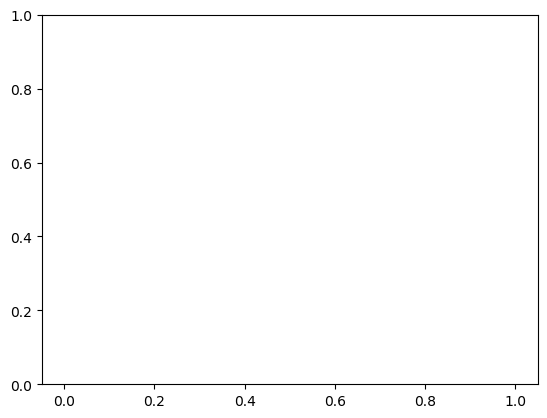

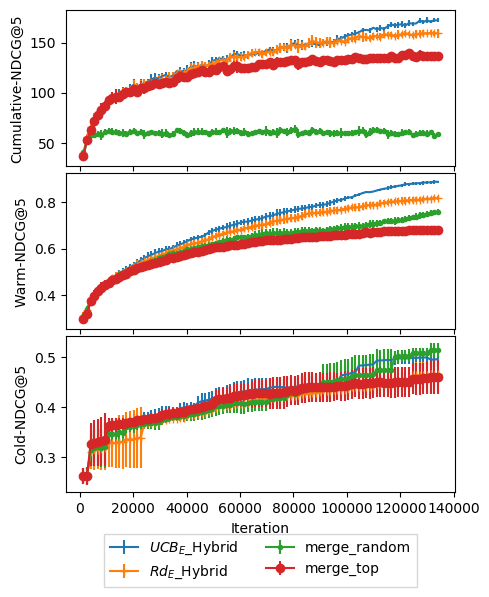

In [106]:
# path="addbehaviour_cold_20k"
# datasets="MSLR-WEB30k_beh_rm"
# datasets="istella-s"
# datasets="Webscope_C14_Set1"
# path="addbehaviour_cold_14oct_linear"
datasets="MSLR-WEB30k_beh_rm"
datasets="MQ2007"
# datasets="MSLR-WEB10k_beh_rm"
# datasets="istella-s"
update="n_updates_20"
# result,result_mean=get_result_df(path,groupby="iterations")
result,result_mean=result_all,result_mean
result_reorg={
            "$UCB_E$_Hybrid":result['no_behav'][datasets]["merge_ucb"][update],
            "$Rd_E$_Hybrid":result['no_behav'][datasets]["merge_random_tradeoff"][update],
#             "ucb_w_corrected":result['add_ips'][datasets]["std_proposional"][update],
#             "ucb_w_clicks":result['add_click'][datasets]["std_proposional"][update],
            
#             "ips_ucb":result['no_behav'][datasets]["ips_ucb"][update],
#             "ucb_w/o_behav":result['no_behav'][datasets]["std_proposional"][update],
}
vali_name="discounted_sum_vali_cdcg"
step=99
result_validated=get_validation(result_reorg,vali_name,step)
# result_validated={}

# result_validated["PDGD_w/o_behav"]=result['no_behav'][datasets]["pdgd"][update]["tradeoff_0.0"]
# result_validated["PDGD_w_clicks"]=result['add_click'][datasets]["pdgd"][update]["tradeoff_0.0"]
# result_validated["PDGD_w_affine"]=result['add_ips'][datasets]["pdgd"][update]["tradeoff_0.0"]
result_validated["merge_random"]=result['no_behav'][datasets]["merge_random_tradeoff"][update]["tradeoff_1000.0"]
result_validated["merge_top"]=result['no_behav'][datasets]["merge_random_tradeoff"][update]["tradeoff_0.0"]
# result_validated["merge_random"]=result['no_behav'][datasets]["random_tradeoff"][update]["tradeoff_1000.0"]
# result_validated["w_click_random"]=result['add_click'][datasets]["random_tradeoff"][update]["tradeoff_100.0"]
# result_validated["w_ips_random"]=result['add_ips'][datasets]["random_tradeoff"][update]["tradeoff_100.0"]
# result_validated["hybrid-ours_topk"]=result['no_behav'][datasets]["merge_ucb"][update]["tradeoff_0.0"]
# result_validated["hybrid-ours-100"]=result['no_behav'][datasets]["merge_ucb"][update]["tradeoff_100.0"]
param_plot={"xscale":"linear"}
plot_compare_pdgd(datasets,result_validated,param_plot)
plt.xscale("linear")

$UCB_E$_Hybrid key validation
['tradeoff_0.5', 'tradeoff_0.05', 'tradeoff_0.01', 'tradeoff_0.02', 'tradeoff_0.0', 'tradeoff_0.8', 'tradeoff_1000.0', 'tradeoff_0.001', 'tradeoff_0.08', 'tradeoff_0.1', 'tradeoff_10.0', 'tradeoff_0.2', 'tradeoff_0.005', 'tradeoff_100.0', 'tradeoff_1.0'] 99 dict_keys(['tradeoff_0.5', 'tradeoff_0.05', 'tradeoff_0.01', 'tradeoff_0.02', 'tradeoff_0.0', 'tradeoff_0.8', 'tradeoff_1000.0', 'tradeoff_0.001', 'tradeoff_0.08', 'tradeoff_0.1', 'tradeoff_10.0', 'tradeoff_0.2', 'tradeoff_0.005', 'tradeoff_100.0', 'tradeoff_1.0']) tradeoff_params,cur_res_split.keys().index,step
tradeoff_0.5 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.05 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.01 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.02 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.0 discounted_sum_vali_cdcg 99 tradeoff_param,vali_name,steps
tradeoff_0.8 discounted_sum_vali_cd

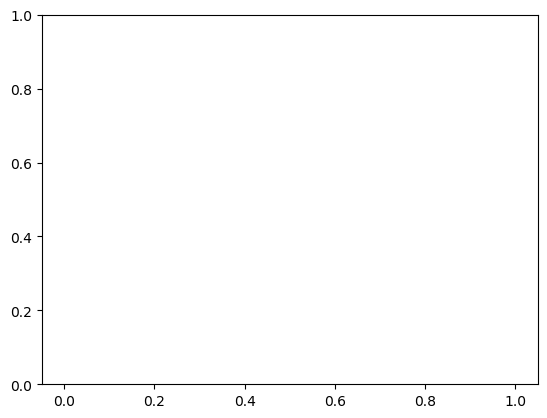

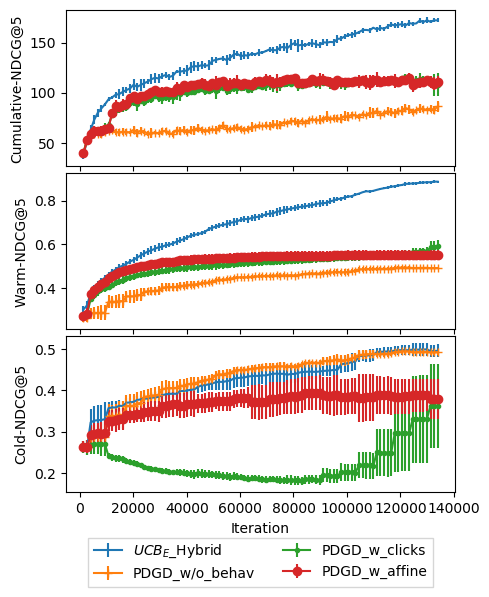

In [110]:
# path="addbehaviour_cold_20k"
# datasets="MSLR-WEB30k_beh_rm"
# datasets="istella-s"
# datasets="Webscope_C14_Set1"
# path="addbehaviour_cold_14oct"
datasets="MSLR-WEB30k_beh_rm"
datasets="MQ2007"
# datasets="MSLR-WEB30k_beh_rm1%"
update="n_updates_20"
# result,result_mean=get_result_df(path,groupby="iterations")
result_reorg={
            "$UCB_E$_Hybrid":result['no_behav'][datasets]["merge_ucb"][update],
#             "ucb_w_corrected":result['add_ips'][datasets]["std_proposional"][update],
#             "ucb_w_clicks":result['add_click'][datasets]["std_proposional"][update],
            
#             "ips_ucb":result['no_behav'][datasets]["ips_ucb"][update],
#             "ucb_w/o_behav":result['no_behav'][datasets]["std_proposional"][update],
}
vali_name="discounted_sum_vali_cdcg"
step=99
result_validated=get_validation(result_reorg,vali_name,step)
# result_validated={}

result_validated["PDGD_w/o_behav"]=result['no_behav'][datasets]["PDGD"][update]["tradeoff_1.0"]
result_validated["PDGD_w_clicks"]=result['add_click'][datasets]["PDGD"][update]["tradeoff_1.0"]
result_validated["PDGD_w_affine"]=result['add_ips'][datasets]["PDGD"][update]["tradeoff_1.0"]
# result_validated["merge_random"]=result['no_behav'][datasets]["merge_ucb"][update]["tradeoff_1000.0"]
# result_validated["w_click_random"]=result['add_click'][datasets]["random_tradeoff"][update]["tradeoff_100.0"]
# result_validated["w_ips_random"]=result['add_ips'][datasets]["random_tradeoff"][update]["tradeoff_100.0"]
# result_validated["hybrid-ours_topk"]=result['no_behav'][datasets]["merge_ucb"][update]["tradeoff_0.0"]
# result_validated["hybrid-ours-100"]=result['no_behav'][datasets]["merge_ucb"][update]["tradeoff_100.0"]
param_plot={"xscale":"linear"}
plot_compare_pdgd(datasets,result_validated,param_plot)
plt.xscale("linear")

['tradeoff_0.02', 'tradeoff_0.001', 'tradeoff_0.05', 'tradeoff_10.0', 'tradeoff_0.01', 'tradeoff_0.0', 'tradeoff_1.0', 'tradeoff_0.8', 'tradeoff_0.1', 'tradeoff_0.08', 'tradeoff_0.005', 'tradeoff_0.5', 'tradeoff_0.2', 'tradeoff_100.0', 'tradeoff_1000.0'] 21 dict_keys(['tradeoff_0.02', 'tradeoff_0.001', 'tradeoff_0.05', 'tradeoff_10.0', 'tradeoff_0.01', 'tradeoff_0.0', 'tradeoff_1.0', 'tradeoff_0.8', 'tradeoff_0.1', 'tradeoff_0.08', 'tradeoff_0.005', 'tradeoff_0.5', 'tradeoff_0.2', 'tradeoff_100.0', 'tradeoff_1000.0']) tradeoff_params,cur_res_split.keys().index,step
1.0 from [2.e-02 1.e-03 5.e-02 1.e+01 1.e-02 0.e+00 1.e+00 8.e-01 1.e-01 8.e-02
 5.e-03 5.e-01 2.e-01 1.e+02 1.e+03]
['tradeoff_10.0', 'tradeoff_0.1', 'tradeoff_1.0', 'tradeoff_10000.0', 'tradeoff_1000.0', 'tradeoff_0.0', 'tradeoff_100.0'] 21 dict_keys(['tradeoff_10.0', 'tradeoff_0.1', 'tradeoff_1.0', 'tradeoff_10000.0', 'tradeoff_1000.0', 'tradeoff_0.0', 'tradeoff_100.0']) tradeoff_params,cur_res_split.keys().index,step
10.

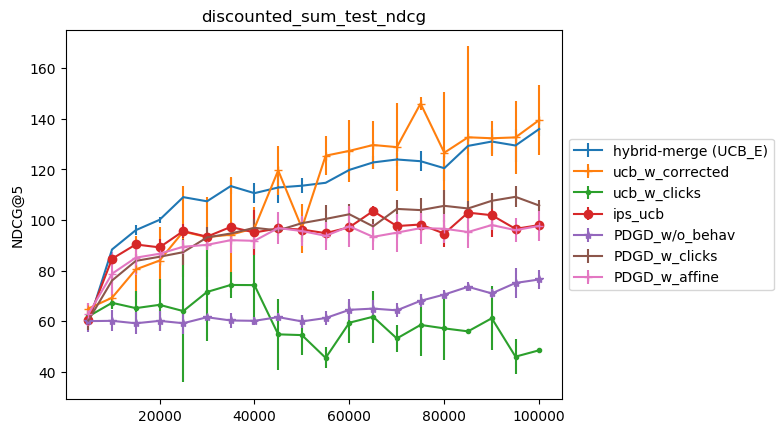

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


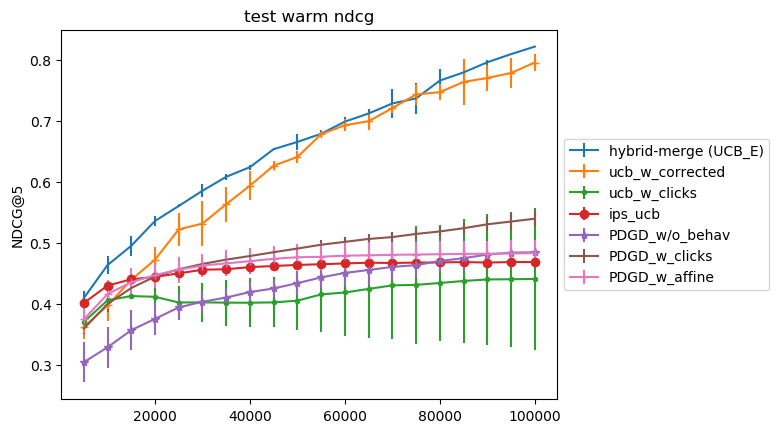

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


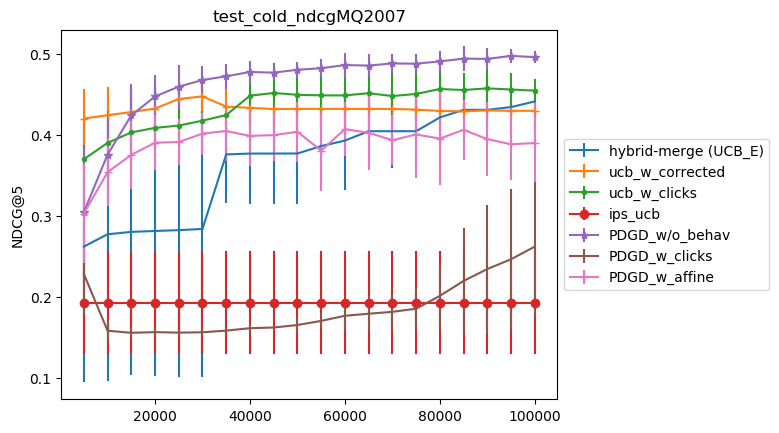

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


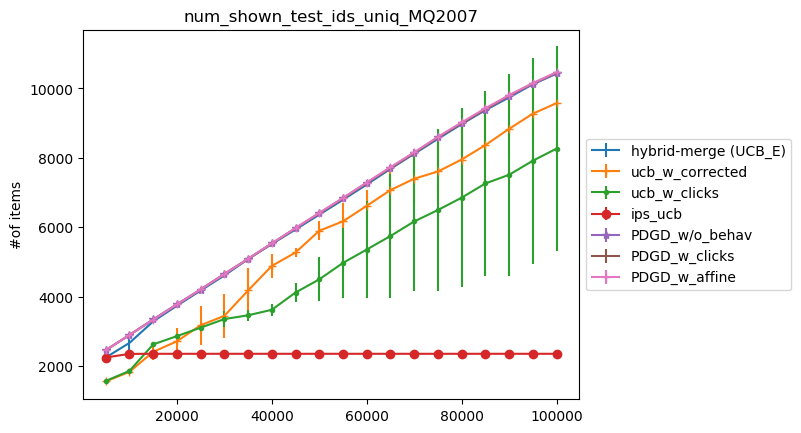

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


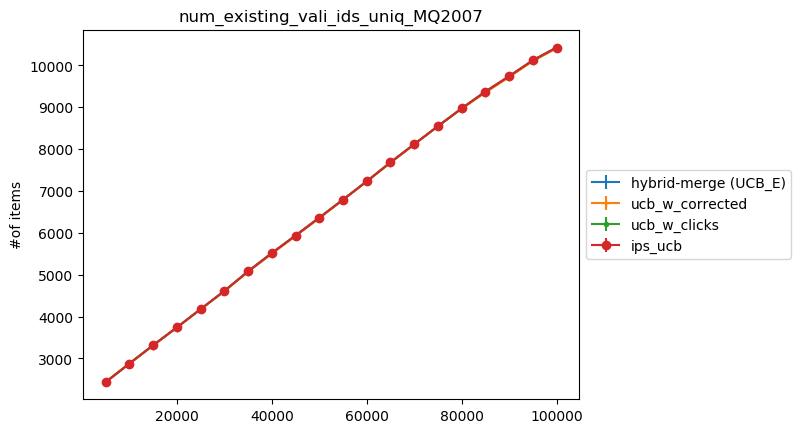

No handles with labels found to put in legend.
No handles with labels found to put in legend.


<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


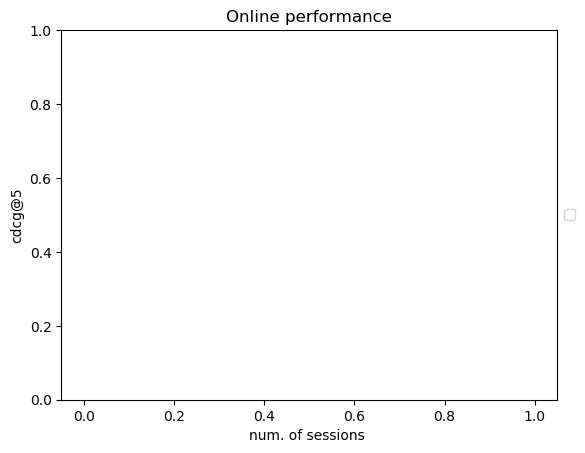

No handles with labels found to put in legend.
No handles with labels found to put in legend.


<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


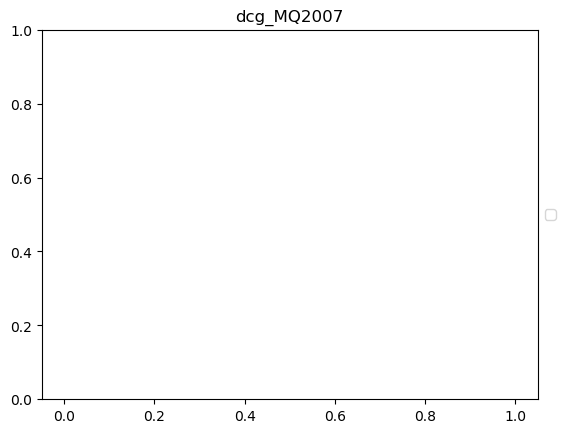

No handles with labels found to put in legend.
No handles with labels found to put in legend.


<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


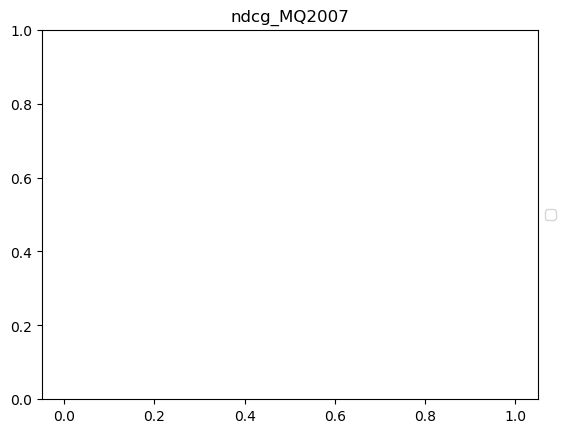

No handles with labels found to put in legend.
No handles with labels found to put in legend.


<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


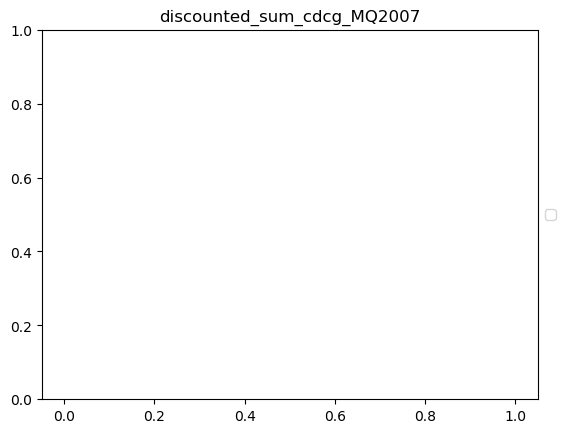

No handles with labels found to put in legend.
No handles with labels found to put in legend.


<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


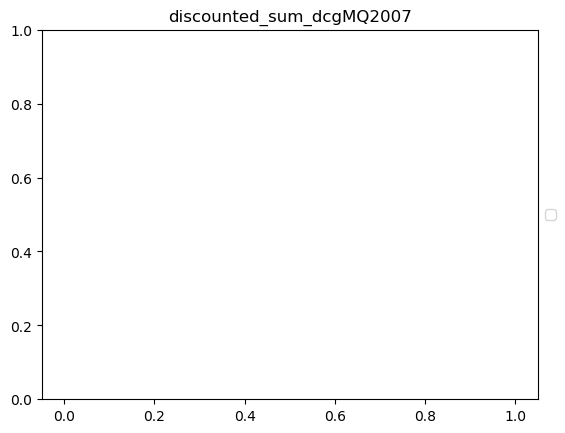

No handles with labels found to put in legend.
No handles with labels found to put in legend.


<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


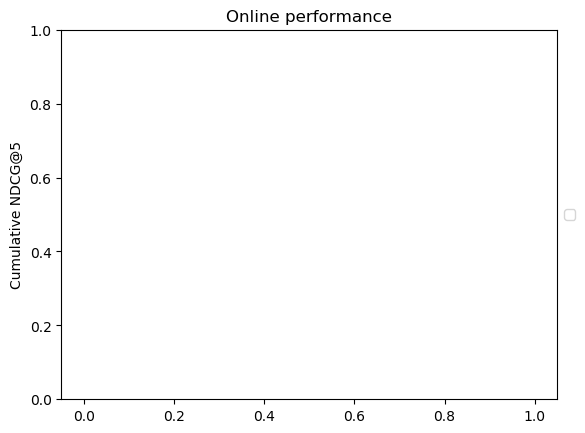

No handles with labels found to put in legend.
No handles with labels found to put in legend.


<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


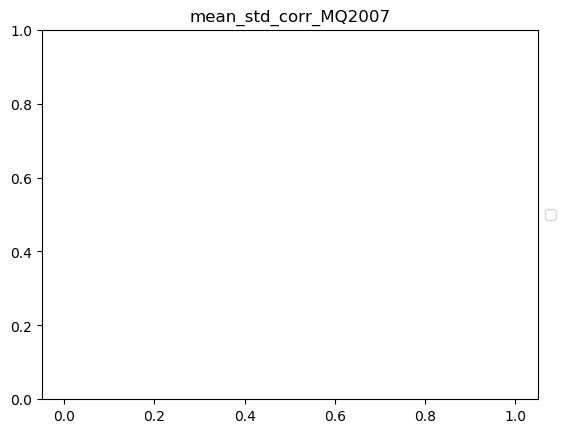

No handles with labels found to put in legend.
No handles with labels found to put in legend.


<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


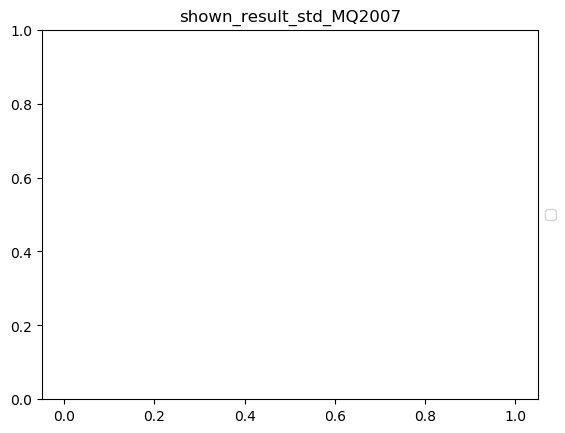

No handles with labels found to put in legend.


<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


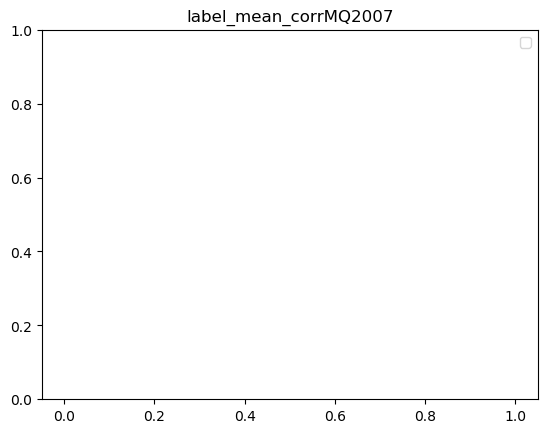

No handles with labels found to put in legend.


<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


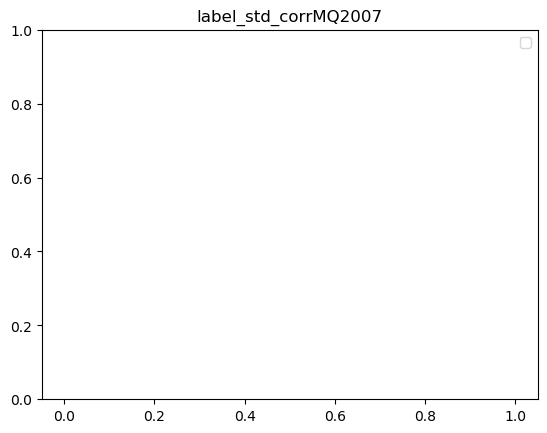

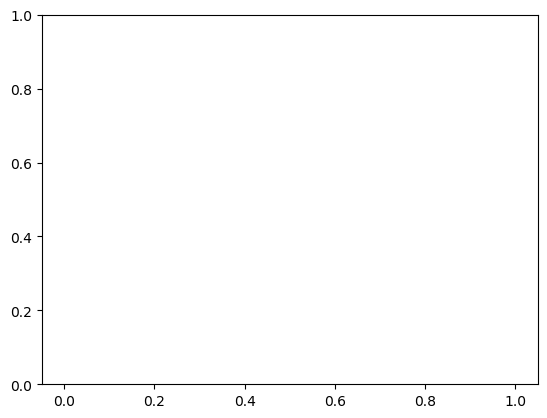

In [888]:
# path="addbehaviour_cold_20k"
# datasets="MSLR-WEB30k_beh_rm"
# datasets="istella-s"
# datasets="Webscope_C14_Set1"
path="addbehaviour_cold_14oct_linear"
datasets="MSLR-WEB10k_beh_rm"
datasets="MQ2007"
# datasets="MSLR-WEB30k_beh_rm1%"
update="n_updates_20"
# result,result_mean=get_result_df(path,groupby="iterations")
result_reorg={
            "hybrid-merge (UCB_E)":result['no_behav'][datasets]["merge_ucb"][update],
            "ucb_w_corrected":result['add_ips'][datasets]["std_proposional"][update],
            "ucb_w_clicks":result['add_click'][datasets]["std_proposional"][update],
            
            "ips_ucb":result['no_behav'][datasets]["ips_ucb"][update],
#             "ucb_w/o_behav":result['no_behav'][datasets]["std_proposional"][update],
}
vali_name="discounted_sum_vali_ndcg"
step=21
result_validated=get_validation(result_reorg,vali_name,step)
# result_validated={}

result_validated["PDGD_w/o_behav"]=result['no_behav'][datasets]["pdgd"][update]["tradeoff_0.0"]
result_validated["PDGD_w_clicks"]=result['add_click'][datasets]["pdgd"][update]["tradeoff_0.0"]
result_validated["PDGD_w_affine"]=result['add_ips'][datasets]["pdgd"][update]["tradeoff_0.0"]
# result_validated["merge_random"]=result['no_behav'][datasets]["merge_ucb"][update]["tradeoff_1000.0"]
# result_validated["w_click_random"]=result['add_click'][datasets]["random_tradeoff"][update]["tradeoff_100.0"]
# result_validated["w_ips_random"]=result['add_ips'][datasets]["random_tradeoff"][update]["tradeoff_100.0"]
# result_validated["hybrid-ours_topk"]=result['no_behav'][datasets]["merge_ucb"][update]["tradeoff_0.0"]
# result_validated["hybrid-ours-100"]=result['no_behav'][datasets]["merge_ucb"][update]["tradeoff_100.0"]
param_plot={"xscale":"linear"}
plot_initial(datasets,result_validated,param_plot)
plt.xscale("linear")

In [306]:
path="addbehaviour_cold_14oct_linear"
datasets="MQ2007"
datasets="MSLR-WEB10k_beh_rm"
update="n_updates_20"
# _,result=get_result_df(path,groupby="iterations")
result_validated={}
# result_validated["ips_random"]=result['no_behav'][datasets]["ips_random_tradeoff"][update]
# result_validated["ips_ucbrandom"]=result['no_behav'][datasets]["ips_ucb"][update]
result_validated["merge_random"]=result['no_behav'][datasets]["merge_random_tradeoff"][update]
result_validated["merge_ucb"]=result['no_behav'][datasets]["merge_ucb"][update]
result_validated["w_click_random"]=result['add_click'][datasets]["random_tradeoff"][update]
result_validated["w_ips_random"]=result['add_ips'][datasets]["random_tradeoff"][update]
result_validated["w_click_random"]=result['add_click'][datasets]["std_proposional"][update]
result_validated["w_ips_random"]=result['add_ips'][datasets]["std_proposional"][update]
# result_validated["w_o_random"]=result['no_behav'][datasets]["random_tradeoff"][update]
#
tradeoff_plot(result_validated,["vali_ndcg"],step=19,xlim=100)

merge_random


KeyError: 19

found saved results
Hybrid-merge(Epsilon—Rank)
[0.e+00 1.e-03 5.e-03 1.e-02 2.e-02 5.e-02 8.e-02 1.e-01 2.e-01 5.e-01
 8.e-01 1.e+00 1.e+01 1.e+02 1.e+03] [[0.48969842 0.47474289 0.4440127  0.4857235  0.40863372]
 [0.50429627 0.50489268 0.46067129 0.46926098 0.45340141]
 [0.49938977 0.49947737 0.42043648 0.45812031 0.41581576]
 [0.48637623 0.51047566 0.43725148 0.43826599 0.40403292]
 [0.48071151 0.51371537 0.42572974 0.49252799 0.4258343 ]
 [0.42550355 0.50617876 0.45283552 0.43529089 0.43760938]
 [0.46490983 0.48529578 0.46297183 0.4649028  0.47527468]
 [0.42255281 0.5081358  0.44577812 0.43708795 0.4388546 ]
 [0.51120214 0.49132254 0.4488226  0.46850985 0.44621764]
 [0.47603129 0.50733282 0.44669473 0.43118223 0.46981927]
 [0.50671825 0.51448787 0.45067072 0.43495142 0.47048398]
 [0.43891671 0.50831775 0.47110189 0.43203346 0.43943446]
 [0.52244009 0.52418782 0.49259671 0.510895   0.47794656]
 [0.47613805 0.51214425 0.51890846 0.50931548 0.51953928]
 [0.51509838 0.51890397 0.4916607

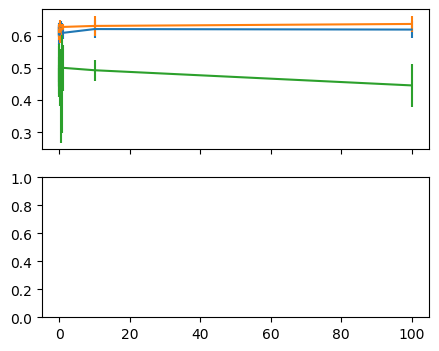

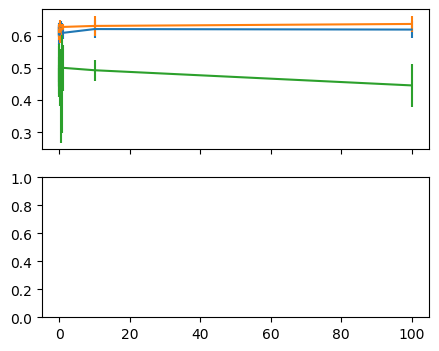

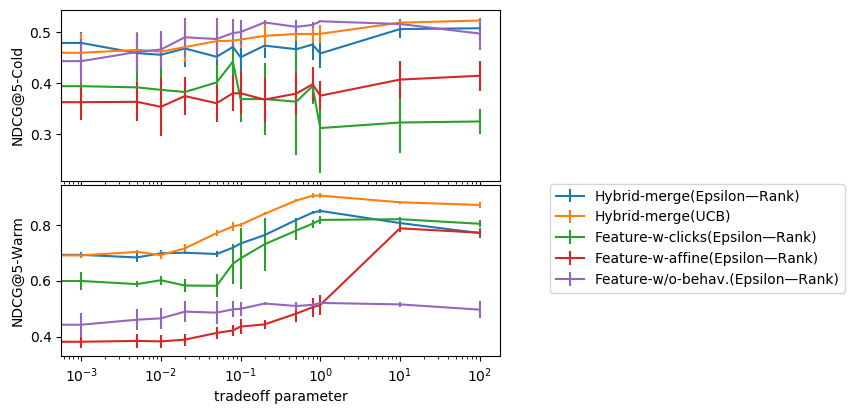

In [307]:
path="addbehaviour_cold_29oct_fair/show_prob5/"
datasets="MQ2007"
# datasets="MSLR-WEB10k_beh_rm"
# datasets="MSLR-WEB30k_beh_rm"
# datasets="istella-s"
update="n_updates_20"
result,result_mean=get_result_df(path,groupby="iterations")
result_validated={}
# result_validated["ips_random"]=result['no_behav'][datasets]["ips_random_tradeoff"][update]
# result_validated["ips_ucbrandom"]=result['no_behav'][datasets]["ips_ucb"][update]
# result_validated["merge_random"]=result['no_behav'][datasets]["merge_random_tradeoff"][update]
# result_validated["merge_ucb"]=result['no_behav'][datasets]["merge_ucb"][update]
# result_validated["w_click_random"]=result['add_click'][datasets]["random_tradeoff"][update]
result_validated["Hybrid-merge(Epsilon—Rank)"]=result['no_behav'][datasets]["merge_random_tradeoff"][update]
result_validated["Hybrid-merge(UCB)"]=result['no_behav'][datasets]["merge_ucb"][update]

result_validated["Feature-w-clicks(Epsilon—Rank)"]=result['add_ctr'][datasets]["random_tradeoff"][update]
# result_validated["w_click_std"]=result['add_click'][datasets]["std_proposional"][update]

# result_validated["w_ips_std"]=result['add_ips'][datasets]["std_proposional"][update]
result_validated["Feature-w-affine(Epsilon—Rank)"]=result['add_ips'][datasets]["random_tradeoff"][update]

result_validated["Feature-w/o-behav.(Epsilon—Rank)"]=result['no_behav'][datasets]["random_tradeoff"][update]
# result_validated["Feature-w/o-behav._std"]=result['no_behav'][datasets]["std_proposional"][update]
#

# tradeoff_plot(result_validated,["vali_ndcg"],xlim=100,step=21,savepath="local_output/")
fig, axs = plt.subplots(2,figsize=(5,4), sharex=True)
tradeoff_plot(result_validated,"test_cold_ndcg_masked",ax=axs[0],xlim=100,step=99)

# ax=axs[0]
# axins = ax.inset_axes([0.5, 0.5, 0.18, 0.18])
# tradeoff_plot(result_validated,["test_cold_ndcg_masked"],ax=axins,xlim=100,step=19)
# # sub region of the original image
# x1, x2, y1, y2 = 8, 50, 0.475, 0.485
# axins.set_xlim(x1, x2)
# axins.set_ylim(y1, y2)
# axins.set_xticklabels('')
# axins.set_yticklabels('')

# ax.indicate_inset_zoom(axins, edgecolor="black")


tradeoff_plot(result_validated,"test_warm_ndcg_masked",ax=axs[1],xlim=100,step=99)

fig.tight_layout(h_pad=0)
axs[0].set_xscale("log")

axs[0].set_ylabel("NDCG@5-Cold")

axs[1].set_xlabel("tradeoff parameter")
axs[1].legend(bbox_to_anchor=(1.1, 1.05))
axs[1].set_xscale("log")
axs[1].set_ylabel("NDCG@5-Warm")
plt.show()
# plt.savefig("local_output/"+"feature_capacity.pdf", dpi=600, bbox_inches = 'tight',
#     pad_inches = 0.05)

In [237]:
def tradeoff_plot(result:dict,metrics_name,step,ax=None,xlim=None,savepath=None):
    if ax:
        plot=ax
    else:
        plot=plt

    for key, value in result.items():
#         print(key)
        result_list=evl.extract_tradeoff_res(value,[metrics_name],step)
        param,result_metric=result_list[0],result_list[1]
        print(param,result_metric)
        if len(result_metric)>1:
#                 print(result_metric[i])
            mean=np.mean(result_metric,axis=1)
            std=np.std(result_metric,axis=1)
            ind=np.arange(mean.shape[0])
            if xlim:
                ind=param<=xlim
#                     print(ind)
            plot.errorbar(param[ind],mean[ind],yerr=std[ind],label=key)
        else:
            plot.plot(param,result_metric,label=key)
            
#             plt.err(param,np.mean(result_metric[i],axis=0),label=key)

            
#             plt.xlabel("tradeoff paramter")
#             plt.ylabel("Warm-NDCG@5")
        
#             axs[i].title.set_text(metrics_list_name[i])
#         fig.tight_layout(h_pad=5, w_pad=5)
#         if savepath is not None:
#             plt.savefig(savepath+"/"+metrics_list_name[i]+".pdf", dpi=300, bbox_inches = 'tight',
#     pad_inches = 0.05)
#             plt.close()
#         else:
#             plt.show()

Text(0.5, 14.722222222222216, 'tradeoff parameter')

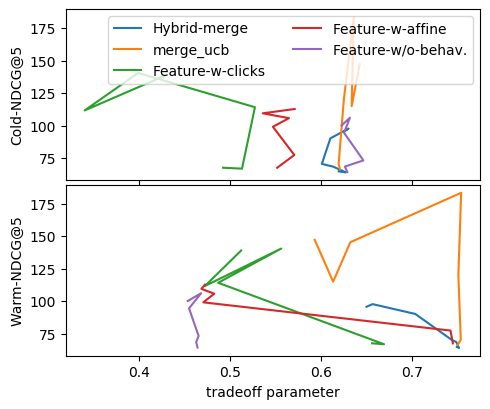

In [794]:
path="addbehaviour_cold_rerun"
datasets="MQ2008"
# datasets="MSLR-WEB30k_beh_rm"
# datasets="istella-s"
update="n_updates_20"
# _,result=get_result_df(path,groupby="iterations")
result_validated={}
# result_validated["ips_random"]=result['no_behav'][datasets]["ips_random_tradeoff"][update]
# result_validated["ips_ucbrandom"]=result['no_behav'][datasets]["ips_ucb"][update]
# result_validated["merge_random"]=result['no_behav'][datasets]["merge_random_tradeoff"][update]
# result_validated["merge_ucb"]=result['no_behav'][datasets]["merge_ucb"][update]
# result_validated["w_click_random"]=result['add_click'][datasets]["random_tradeoff"][update]
result_validated["Hybrid-merge"]=result['no_behav'][datasets]["merge_random_tradeoff"][update]
result_validated["merge_ucb"]=result['no_behav'][datasets]["merge_ucb"][update]

result_validated["Feature-w-clicks"]=result['add_click'][datasets]["random_tradeoff"][update]
# result_validated["w_click_std"]=result['add_click'][datasets]["std_proposional"][update]

# result_validated["w_ips_std"]=result['add_ips'][datasets]["std_proposional"][update]
result_validated["Feature-w-affine"]=result['add_ips'][datasets]["random_tradeoff"][update]

result_validated["Feature-w/o-behav."]=result['no_behav'][datasets]["random_tradeoff"][update]
# result_validated["w_o_std"]=result['no_behav'][datasets]["std_proposional"][update]
#

# tradeoff_plot(result_validated,["vali_ndcg"],xlim=100,step=21,savepath="local_output/")
fig, axs = plt.subplots(2,figsize=(5,4), sharex=True)
tradeoff_plot_xy(result_validated,["test_ndcg","discounted_sum_ndcg"],ax=axs[0],xlim=100,step=21)
axs[0].set_ylabel("Cold-NDCG@5")
axs[0].legend(ncol=2)
axs[1].set_ylabel("Warm-NDCG@5")
tradeoff_plot_xy(result_validated,["vali_ndcg","discounted_sum_ndcg"],ax=axs[1],xlim=100,step=21)
fig.tight_layout(h_pad=0)
axs[1].set_xlabel("tradeoff parameter")
# plt.savefig("local_output/"+"feature_capacity.pdf", dpi=600, bbox_inches = 'tight',
#     pad_inches = 0.05)

In [112]:
import utils.evaluation as evl
def tradeoff_plot_xy(result:dict,metrics_list_name,step,ax=None,xlim=None,savepath=None):
    if ax:
        plot=ax
    else:
        plot=plt
    n_metrics=1
    for i in range(n_metrics):
        for key, value in result.items():
            result_list=evl.extract_tradeoff_res(value,metrics_list_name,step)
            param,result_metric=result_list[0],result_list[1:]
            x,y=result_metric[0],result_metric[1]
            if len(x.shape)>1:
                x=np.mean(x,axis=1)
                y=np.mean(y,axis=1)
            plot.plot(x,y,label=key)
            
#             plt.err(param,np.mean(result_metric[i],axis=0),label=key)
#             plt.xscale('symlog')
            
#             plt.xlabel("tradeoff paramter")
#             plt.ylabel("Warm-NDCG@5")
        
#             axs[i].title.set_text(metrics_list_name[i])
#         fig.tight_layout(h_pad=5, w_pad=5)
#         if savepath is not None:
#             plt.savefig(savepath+"/"+metrics_list_name[i]+".pdf", dpi=300, bbox_inches = 'tight',
#     pad_inches = 0.05)
#             plt.close()
#         else:
#             plt.show()

In [966]:
def tradeoff_plot(result:dict,metrics_list_name,step,xlim=None,savepath=None):
    n_metrics=len(metrics_list_name)
    fig, axs = plt.subplots(n_metrics,figsize=(5,3))
    for i in range(n_metrics):
        for key, value in result.items():
            result_list=evl.extract_tradeoff_res(value,metrics_list_name,step)
            param,result_metric=result_list[0],result_list[1:]
            if len(result_metric[i])>1:
                mean=np.mean(result_metric[i],axis=1)
                std=np.std(result_metric[i],axis=1)
                ind=np.arange(mean.shape[0])
                if xlim:
                    ind=param<=xlim
                    print(ind)
                plt.errorbar(param[ind],mean[ind],yerr=std[ind],label=key)
            else:
                plt.plot(param,result_metric[i],label=key)
            
#             plt.err(param,np.mean(result_metric[i],axis=0),label=key)
            plt.xscale('symlog')
            plt.legend(ncol=2,loc=4)
            plt.xlabel("tradeoff paramter")
            plt.ylabel("Warm-DCG@5")
#             axs[i].title.set_text(metrics_list_name[i])
        fig.tight_layout()
        
        if savepath is not None:
            plt.savefig(savepath+"/"+metrics_list_name[i]+".pdf", dpi=300)
            plt.close()
        else:
            plt.show()

In [672]:
import utils.evaluation as evl
from results_org import *
path="addbehaviour_cold_20k"
path="addbehaviour_full"
datasets="MSLR-WEB30k_beh_rm"
# datasets="istella-s"
# datasets="MQ2007"
step=21
update="n_updates_20"
result,result_mean=get_result_df(path,groupby="iterations")
result_reorg={
#             "decay_w_click":result_mean['add_click'][datasets]["random_tradeoff"]['n_updates_20'],
#             "ucb_w_behav":result_mean['add_ips'][datasets]["std_proposional"][update],
            "random_tradeoff_w_ips_30k":result_mean['add_ips']["MSLR-WEB30k_beh_rm"]["random_tradeoff"][update],
            "random_tradeoff_w_ips_10k":result_mean['add_ips']["MSLR-WEB10k_beh_rm"]["random_tradeoff"][update],
#             "random_tradeoff_w_clicks":result_mean['add_click'][datasets]["random_tradeoff"][update],
#             "hybrid-ours":result_mean['no_behav'][datasets]["merge_ucb"][update],
#             "ips-ucb":result_mean['no_behav'][datasets]["ips_ucb"][update],
#             "decay_w/o_behav":result_mean['no_behav'][datasets]["ucb"][update],
#             "random_tradeoff_w/o_behav":result_mean['no_behav'][datasets]["random_tradeoff"][update],
#             "ucb_w/o_behav":result_mean['no_behav'][datasets]["std_proposional"][update],
}
metrics_list=["discounted_sum_dcg","vali_dcg"]
step=21
tradeoff_plot(result_reorg,metrics_list,step,savepath="output/")

KeyboardInterrupt: 

[0.25467606 0.29506641 0.26155235 0.2140101  0.24680614 0.24617105] [12.79697989 11.03621737  3.97075404  1.12588871  0.82470893  0.30345412] ucb
[] [] ucb
[0.66539035 0.71896178 0.02253321 0.32673973 0.05173068 0.01538131] [ 45.6138247  115.21593487   5.61874341  32.43960288   2.63842841
   0.71017596] ucb
[] [] ucb
[0.         0.         0.01538131 0.09396178 0.         0.        ] [8.96845974e-108 0.00000000e+000 1.55710049e-001 3.87979651e+000
 7.94769760e-001 8.11740129e-001] ucb
[] [] ucb


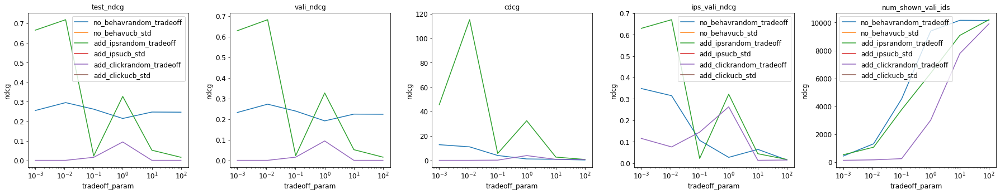

In [1514]:
import utils.evaluation as evl
from results_org import *

# path="addbehaviour_cold_40k_log"
# datasets="MSLR-WEB30k_beh_rm1%"

path="addbehaviour_NP"
datasets="NP2004"

result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=21
steps=[21]
update="n_updates_20"
feature_stra=['no_behav','add_ips',"add_click"]
# feature_stra=['no_behav','add_ips']
for step in steps:
    fig, axs = plt.subplots(1,5,figsize=(25,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["random_tradeoff"][update]
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["vali_dcg","discounted_sum_dcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"random_tradeoff")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"random_tradeoff")
        axs[2].plot(param+0.001,cdcg,label=method+"random_tradeoff")
#         if method=="no_behav":
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"random_tradeoff")
        axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"random_tradeoff")
        random_tradeoff=result_mean[method][datasets]["ucb_std"][update]
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"ucb_std")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"ucb_std")
        axs[2].plot(param+0.001,cdcg,label=method+"ucb_std")
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"ucb_std")
        axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"ucb_std")
        axs[3].title.set_text('ips_vali_ndcg')
        axs[3].legend()
        axs[4].title.set_text('num_shown_vali_ids')
        axs[4].legend()
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
        axs[4].set_xscale('log')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

0.1 from [1.e+02 1.e+00 1.e+01 1.e-02 0.e+00 1.e-01]
0.0 from [1.e+02 1.e-01 1.e+03 1.e+00 1.e+04 1.e+01 0.e+00]
1.0 from [1.e+01 1.e+02 1.e-01 1.e+04 0.e+00 1.e+03 1.e+00]
0.1 from [1.e+01 1.e-02 1.e-01 0.e+00 1.e+02 1.e+00]
0.01 from [0.e+00 1.e+00 1.e+02 1.e-01 1.e-02 1.e+01 1.e+03]
0.1 from [1.e+01 1.e+03 1.e+02 0.e+00 1.e-01 1.e-02 1.e+00]
1.0 from [1.e+03 0.e+00 1.e+00 1.e+01 1.e+02 1.e-01 1.e+04]


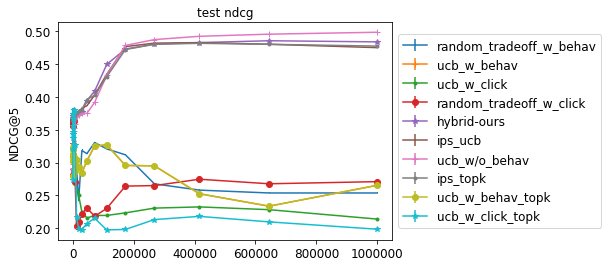

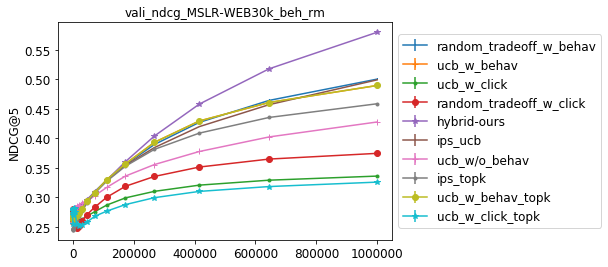

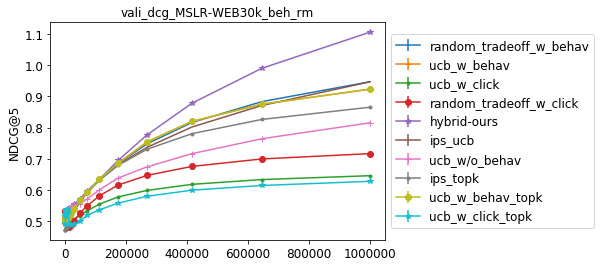

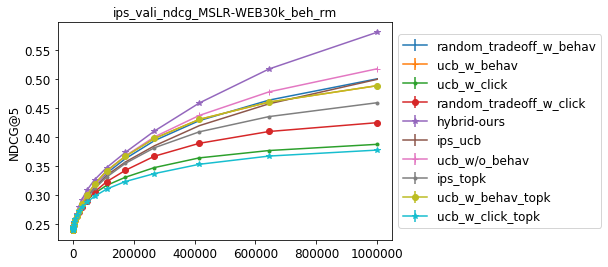

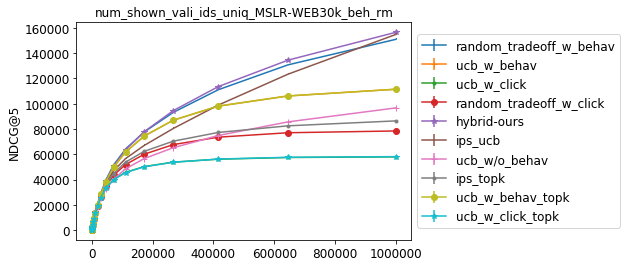

...

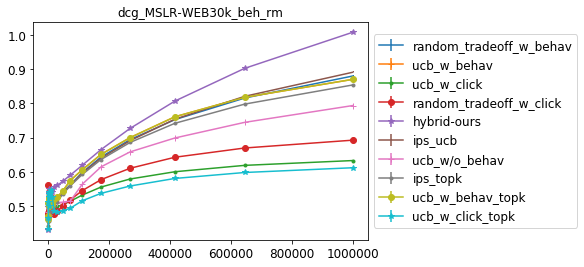

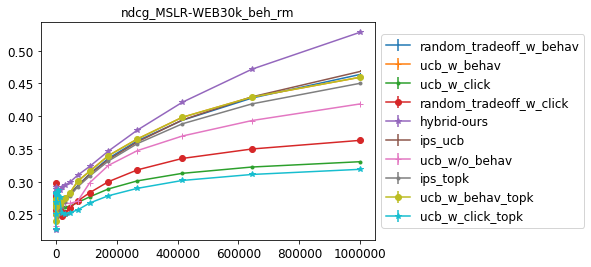

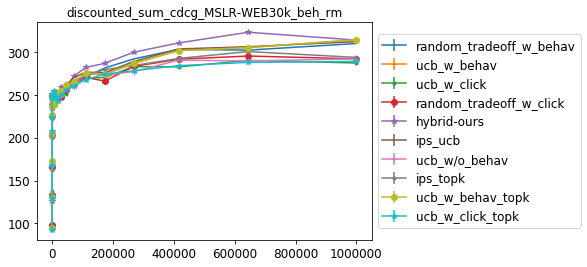

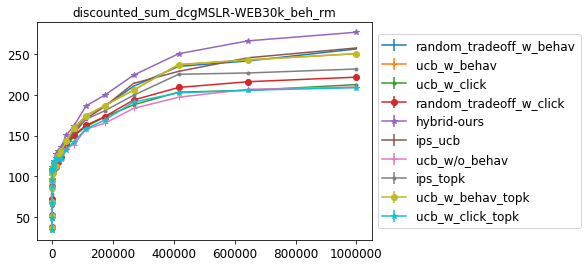

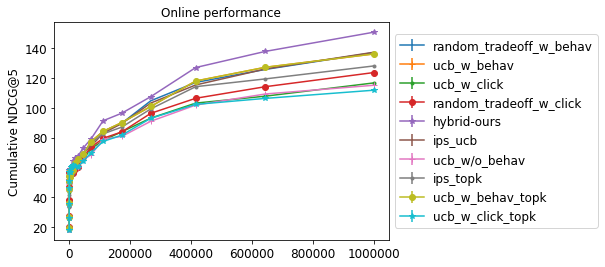

AssertionError: random_tradeoff_w_behav doesn't contain the partition mean_std_corr

In [1738]:
# path="addbehaviour_cold_20k"
# datasets="MSLR-WEB30k_beh_rm"
# datasets="istella-s"
# datasets="Webscope_C14_Set1"
path="addbehaviour_full"
datasets="MSLR-WEB30k_beh_rm"
# datasets="MSLR-WEB30k_beh_rm1%"
update="n_updates_20"
_,result=get_result_df(path,groupby="iterations")
result_reorg={
#             "decay_w_behav":result['add_ips'][datasets]["ucb"]['n_updates_10'],
            "random_tradeoff_w_behav":result['add_ips'][datasets]["random_tradeoff"][update],
            "ucb_w_behav":result['add_ips'][datasets]["std_proposional"][update],
            "ucb_w_click":result['add_click'][datasets]["std_proposional"][update],
            "random_tradeoff_w_click":result['add_click'][datasets]["random_tradeoff"][update],
            "hybrid-ours":result['no_behav'][datasets]["merge_ucb"][update],
            "ips_ucb":result['no_behav'][datasets]["ips_ucb"][update],
            "ucb_w/o_behav":result['no_behav'][datasets]["std_proposional"][update],
}
vali_name="discounted_sum_dcg"
step=21
result_validated=get_validation(result_reorg,vali_name,step)
result_validated["ips_topk"]=result['no_behav'][datasets]["ips_ucb"][update]["tradeoff_0.0"]
result_validated["ucb_w_behav_topk"]=result['add_ips'][datasets]["std_proposional"][update]["tradeoff_0.0"]
result_validated["ucb_w_click_topk"]=result['add_click'][datasets]["std_proposional"][update]["tradeoff_0.0"]
# result_validated["hybrid-ours_topk"]=result['no_behav'][datasets]["merge_ucb"][update]["tradeoff_0.0"]
# result_validated["hybrid-ours-100"]=result['no_behav'][datasets]["merge_ucb"][update]["tradeoff_100.0"]
param_plot={"xscale":"linear"}
plot_initial(datasets,result_validated,param_plot)
plt.xscale("linear")

In [1164]:
import matplotlib.pyplot as plt

SMALL_SIZE = 12
MEDIUM_SIZE = 12
BIGGER_SIZE = 12

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title


[1.51725932 1.51691949 1.51281999 1.44846519 1.41859998 1.41657637] [0.74065998 0.74091619 0.73863624 0.74309038 0.74164013 0.74073528] random_tradeoff
[1.51675997 1.5171972  1.51410707 1.46624658 1.42147784 1.41695109] [0.73970901 0.73855849 0.74100824 0.73844476 0.73956906 0.73889463] ucb
[1.51771647 1.51601657 1.51689607 1.49193702 1.45581208 1.44921573
 1.44599267] [0.74101772 0.73956069 0.73921776 0.73796589 0.73867608 0.7389465
 0.73927833] ucb_std
[1.51716546 1.51714214 1.51679917 1.47569034 1.45281112 1.45098676
 1.45237946] [0.73911709 0.74224737 0.73951306 0.73691067 0.74007893 0.73793173
 0.7379275 ] std_proposional
[] [] portfolio_proposional
1.5169682942144742 0.7390198653551147
1.3239786169306225 0.7264818710589774
1.4156335853243487 0.7408517512528103


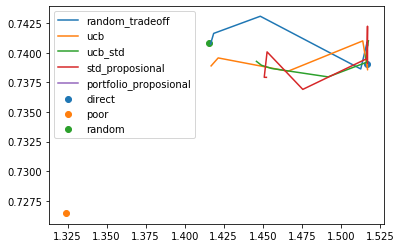

In [118]:
import utils.evaluation as evl
from results_org import *
datasets="Webscope_C14_Set1"
path="local_output_point_wise_good_initial_model_shownlist_coldstart_sessionaware/"+datasets
result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
for method in tradeoff_methods:
    random_tradeoff=result_mean[method]['n_updates_10']
    param,offline,online=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
    print(online,offline,method)
    plt.plot(online,offline,label=method)
methods=["direct","poor","random"]
for method in methods:
    random_tradeoff=result_mean[method]['n_updates_10']
    offline,online=random_tradeoff["test_ndcg"][step],random_tradeoff["cdcg"][step]
    print(online,offline)
    plt.scatter(online,offline,label=method)
plt.legend()

In [642]:
path="addbehaviour/add_ips/"+datasets
result,result_mean=get_result_df(path,groupby="iterations")

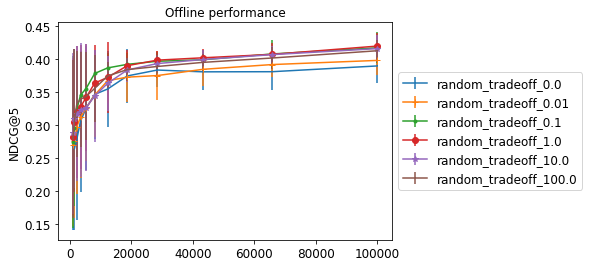

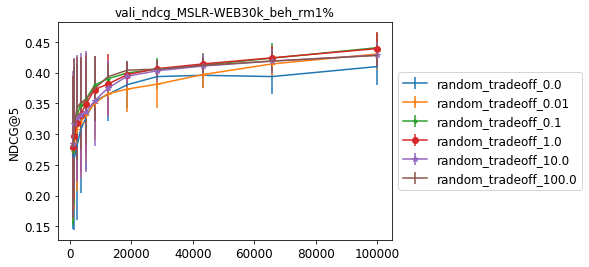

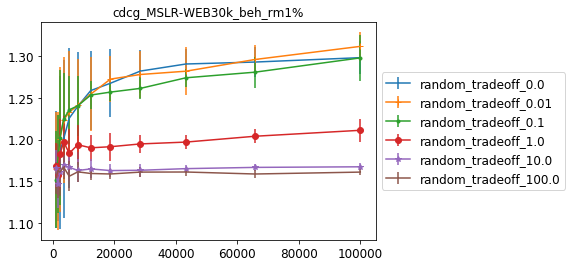

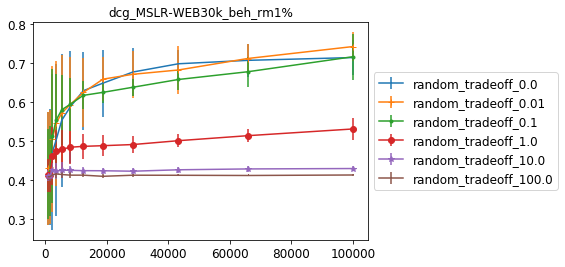

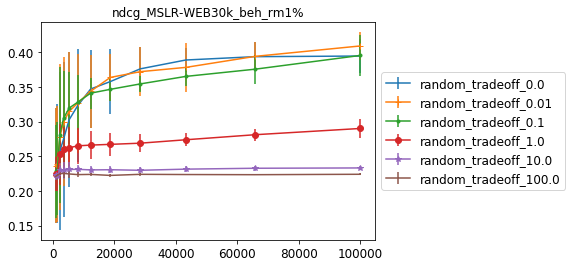

AssertionError: random_tradeoff_0.0 doesn't contain the partition discounted_sum_cdcg

In [707]:
from results_org import *
# datasets="Webscope_C14_Set1"
# datasets="istella-s"
# datasets="MSLR-WEB30k"
datasets="MSLR-WEB30k_beh_rm1%"

path="addbehaviour/no_behav/"+datasets
result,result_mean=get_result_df(path,groupby="iterations")
result_reorg={
#             "direct":result["direct"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],

             "random_tradeoff_0.0":result["random_tradeoff"]['n_updates_10']['tradeoff_0.0'],
            "random_tradeoff_0.01":result["random_tradeoff"]['n_updates_10']['tradeoff_0.01'],
             "random_tradeoff_0.1":result["random_tradeoff"]['n_updates_10']['tradeoff_0.1'],
              "random_tradeoff_1.0":result["random_tradeoff"]['n_updates_10']['tradeoff_1.0'],
             "random_tradeoff_10.0":result["random_tradeoff"]['n_updates_10']['tradeoff_10.0'],
            "random_tradeoff_100.0":result["random_tradeoff"]['n_updates_10']['tradeoff_100.0'],
             }
param_plot={"xscale":"linear"}
plot_initial(datasets,result_reorg,param_plot)
plt.xscale("linear")

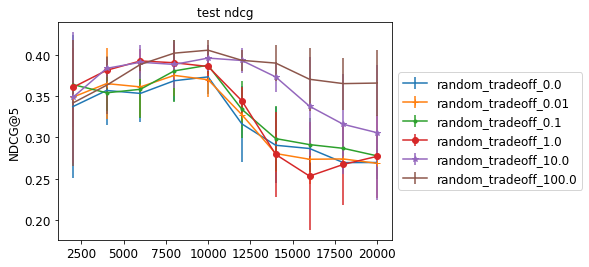

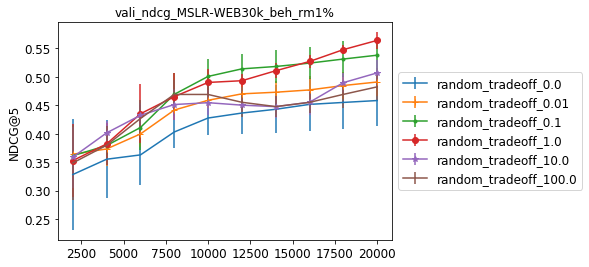

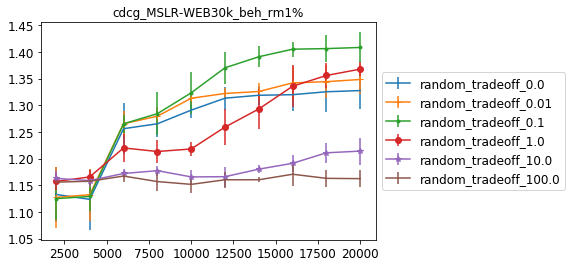

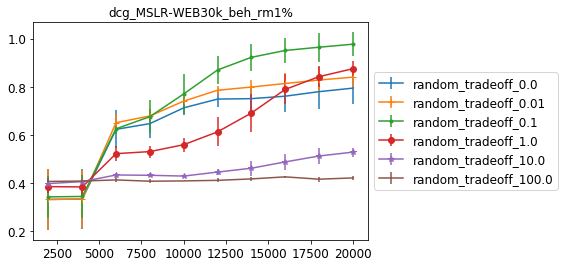

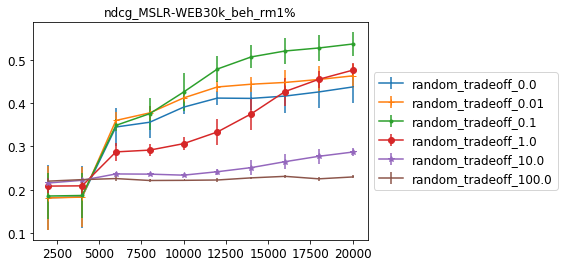

AssertionError: random_tradeoff_0.0 doesn't contain the partition discounted_sum_cdcg

In [813]:
from results_org import *
datasets="Webscope_C14_Set1"
# datasets="istella-s"
datasets="MSLR-WEB30k"
datasets="MSLR-WEB30k_beh_rm1%"
path="addbehaviour_coldstart/add_click/"+datasets
path="addbehaviour_cold_20k/add_click/"+datasets
# path="addbehaviour/no_behav/"+datasets
result,result_mean=get_result_df(path,groupby="iterations")
result_reorg={
#             "direct":result["direct"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],

             "random_tradeoff_0.0":result["random_tradeoff"]['n_updates_10']['tradeoff_0.0'],
            "random_tradeoff_0.01":result["random_tradeoff"]['n_updates_10']['tradeoff_0.01'],
             "random_tradeoff_0.1":result["random_tradeoff"]['n_updates_10']['tradeoff_0.1'],
              "random_tradeoff_1.0":result["random_tradeoff"]['n_updates_10']['tradeoff_1.0'],
             "random_tradeoff_10.0":result["random_tradeoff"]['n_updates_10']['tradeoff_10.0'],
            "random_tradeoff_100.0":result["random_tradeoff"]['n_updates_10']['tradeoff_100.0'],
             }
param_plot={"xscale":"linear"}
plot_initial(datasets,result_reorg,param_plot)                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  
plt.xscale("linear")



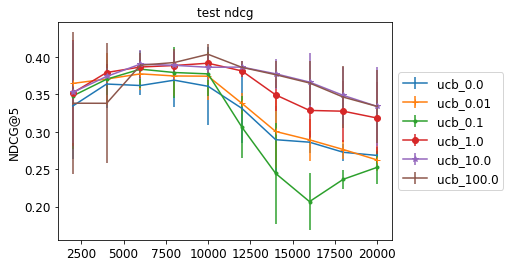

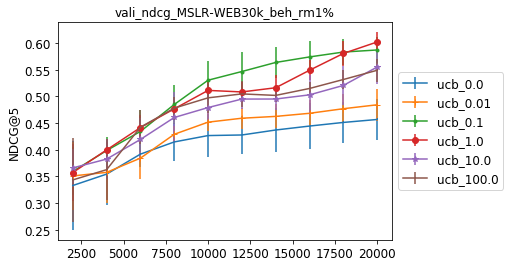

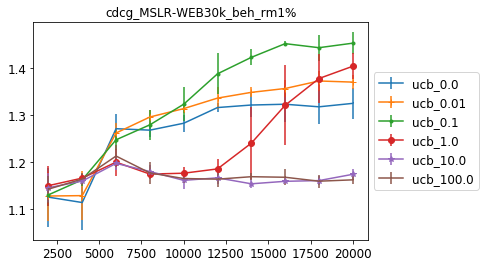

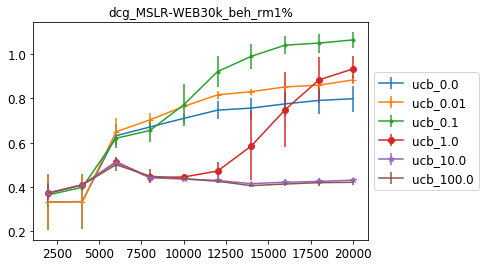

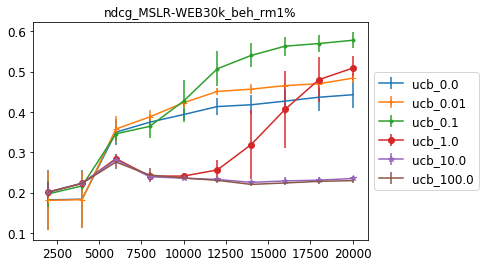

AssertionError: ucb_0.0 doesn't contain the partition discounted_sum_cdcg

In [814]:
from results_org import *
datasets="Webscope_C14_Set1"
# datasets="istella-s"
datasets="MSLR-WEB30k"
datasets="MSLR-WEB30k_beh_rm1%"
path="addbehaviour_coldstart/add_click/"+datasets
path="addbehaviour_cold_20k///add_click/"+datasets
# path="addbehaviour/no_behav/"+datasets
result,result_mean=get_result_df(path,groupby="iterations")
result_reorg={
#             "direct":result["direct"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],

             "ucb_0.0":result["ucb"]['n_updates_10']['tradeoff_0.0'],
            "ucb_0.01":result["ucb"]['n_updates_10']['tradeoff_0.01'],
             "ucb_0.1":result["ucb"]['n_updates_10']['tradeoff_0.1'],
              "ucb_1.0":result["ucb"]['n_updates_10']['tradeoff_1.0'],
             "ucb_10.0":result["ucb"]['n_updates_10']['tradeoff_10.0'],
            "ucb_100.0":result["ucb"]['n_updates_10']['tradeoff_100.0'],

             }
param_plot={"xscale":"linear"}
plot_initial(datasets,result_reorg,param_plot)                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  
plt.xscale("linear")



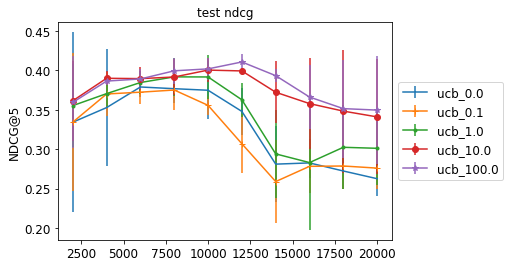

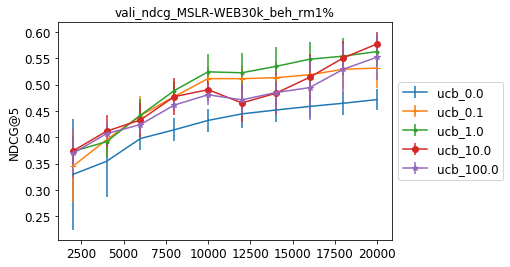

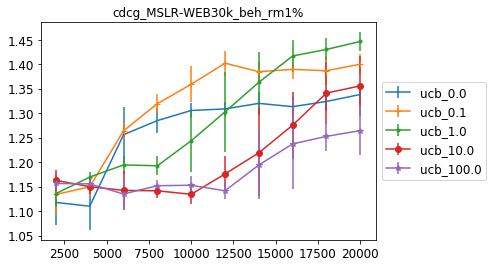

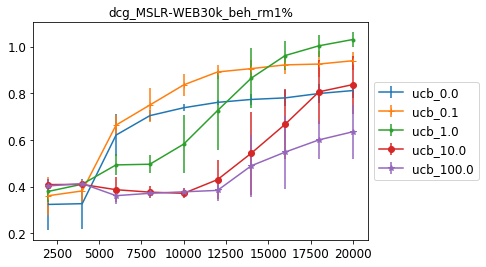

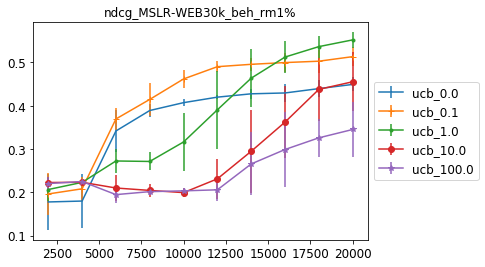

AssertionError: ucb_0.0 doesn't contain the partition discounted_sum_cdcg

In [816]:
from results_org import *
datasets="Webscope_C14_Set1"
# datasets="istella-s"
datasets="MSLR-WEB30k"
datasets="MSLR-WEB30k_beh_rm1%"
path="addbehaviour_coldstart/add_click/"+datasets
path="addbehaviour_cold_20k//add_click/"+datasets
# path="addbehaviour/no_behav/"+datasets
result,result_mean=get_result_df(path,groupby="iterations")
result_reorg={
#             "direct":result["direct"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],

             "ucb_0.0":result["ucb_std"]['n_updates_10']['tradeoff_0.0'],
#             "ucb_0.01":result["ucb_std"]['n_updates_10']['tradeoff_0.01'],
             "ucb_0.1":result["ucb_std"]['n_updates_10']['tradeoff_0.1'],
              "ucb_1.0":result["ucb_std"]['n_updates_10']['tradeoff_1.0'],
             "ucb_10.0":result["ucb_std"]['n_updates_10']['tradeoff_10.0'],
            "ucb_100.0":result["ucb_std"]['n_updates_10']['tradeoff_100.0'],

             }
param_plot={"xscale":"linear"}
plot_initial(datasets,result_reorg,param_plot)                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  
plt.xscale("linear")



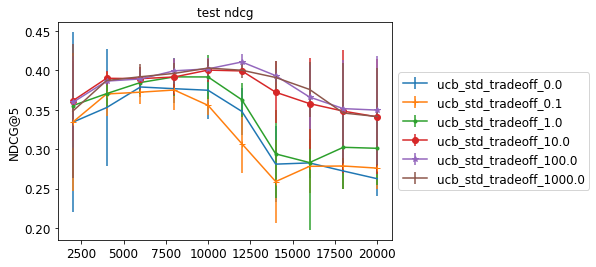

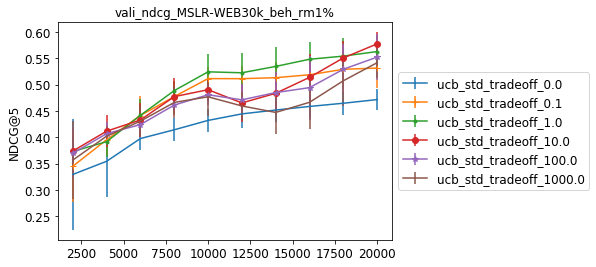

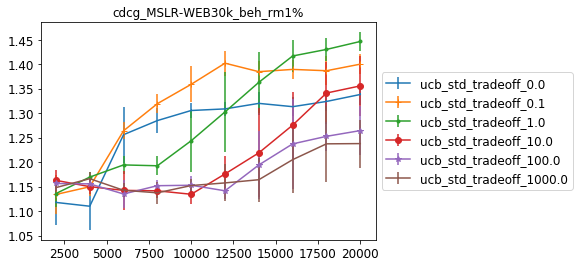

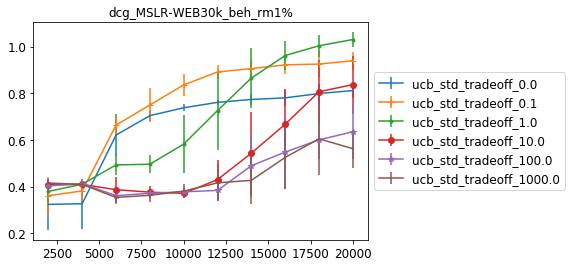

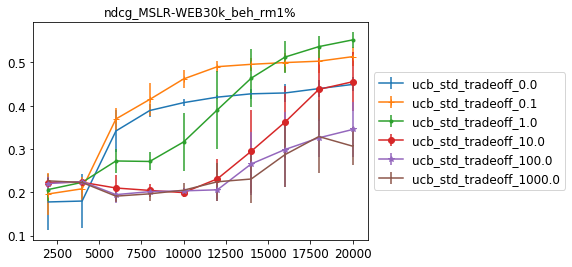

AssertionError: ucb_std_tradeoff_0.0 doesn't contain the partition discounted_sum_cdcg

In [817]:
from results_org import *
datasets="Webscope_C14_Set1"
# datasets="istella-s"
datasets="MSLR-WEB30k"
datasets="MSLR-WEB30k_beh_rm1%"
# path="addbehaviour_coldstart/add_ips/"+datasets
path="addbehaviour/add_ips/"+datasets
path="addbehaviour_cold_20k//add_click/"+datasets
# path="addbehaviour_cold/no_behav/"+datasets
result,result_mean=get_result_df(path,groupby="iterations")
result_reorg={
#             "direct":result["direct"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],

#              "random_tradeoff_0.0":result["random_tradeoff"]['n_updates_10']['tradeoff_0.0'],
#             "random_tradeoff_0.01":result["random_tradeoff"]['n_updates_10']['tradeoff_0.01'],
#              "random_tradeoff_0.1":result["random_tradeoff"]['n_updates_10']['tradeoff_0.1'],
#               "random_tradeoff_1.0":result["random_tradeoff"]['n_updates_10']['tradeoff_1.0'],
#              "random_tradeoff_10.0":result["random_tradeoff"]['n_updates_10']['tradeoff_10.0'],
#             "random_tradeoff_100.0":result["random_tradeoff"]['n_updates_10']['tradeoff_100.0'],
             "ucb_std_tradeoff_0.0":result["ucb_std"]['n_updates_10']['tradeoff_0.0'],
#             "std_pro_tradeoff_0.01":result["std_proposional"]['n_updates_10']['tradeoff_0.01'],
             "ucb_std_tradeoff_0.1":result["ucb_std"]['n_updates_10']['tradeoff_0.1'],
              "ucb_std_tradeoff_1.0":result["ucb_std"]['n_updates_10']['tradeoff_1.0'],
              "ucb_std_tradeoff_10.0":result["ucb_std"]['n_updates_10']['tradeoff_10.0'],
              "ucb_std_tradeoff_100.0":result["ucb_std"]['n_updates_10']['tradeoff_100.0'],
              "ucb_std_tradeoff_1000.0":result["ucb_std"]['n_updates_10']['tradeoff_1000.0'],
             }
param_plot={"xscale":"linear"}
plot_initial(datasets,result_reorg,param_plot)


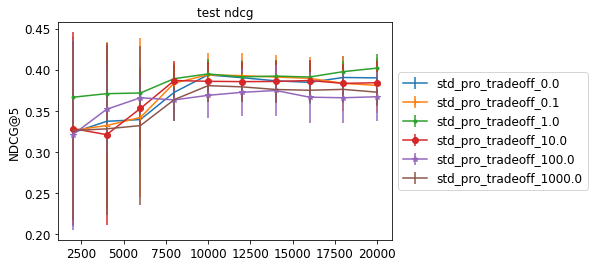

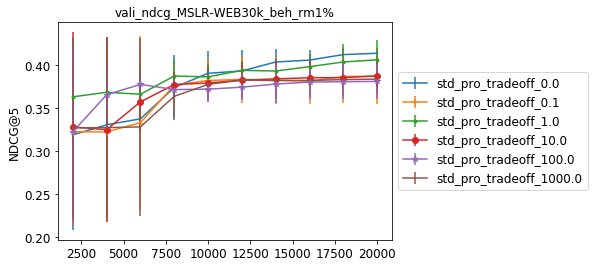

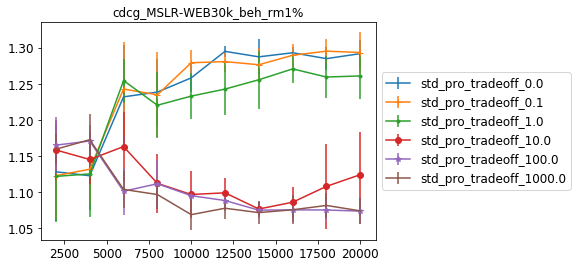

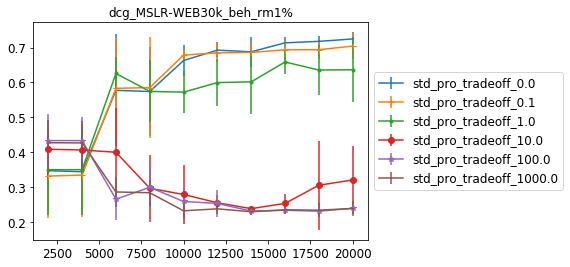

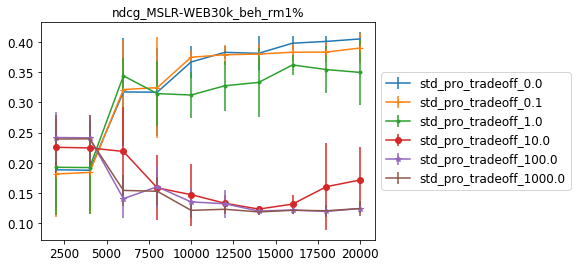

AssertionError: std_pro_tradeoff_0.0 doesn't contain the partition discounted_sum_cdcg

In [818]:
from results_org import *
datasets="Webscope_C14_Set1"
# datasets="istella-s"
datasets="MSLR-WEB30k"
datasets="MSLR-WEB30k_beh_rm1%"
# path="addbehaviour_coldstart/add_ips/"+datasets
path="addbehaviour/add_ips/"+datasets
path="addbehaviour/add_click/"+datasets
path="addbehaviour_cold_20k//no_behav/"+datasets
result,result_mean=get_result_df(path,groupby="iterations")
result_reorg={
#             "direct":result["direct"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],

#              "random_tradeoff_0.0":result["random_tradeoff"]['n_updates_10']['tradeoff_0.0'],
#             "random_tradeoff_0.01":result["random_tradeoff"]['n_updates_10']['tradeoff_0.01'],
#              "random_tradeoff_0.1":result["random_tradeoff"]['n_updates_10']['tradeoff_0.1'],
#               "random_tradeoff_1.0":result["random_tradeoff"]['n_updates_10']['tradeoff_1.0'],
#              "random_tradeoff_10.0":result["random_tradeoff"]['n_updates_10']['tradeoff_10.0'],
#             "random_tradeoff_100.0":result["random_tradeoff"]['n_updates_10']['tradeoff_100.0'],
             "std_pro_tradeoff_0.0":result["std_proposional"]['n_updates_10']['tradeoff_0.0'],
#             "std_pro_tradeoff_0.01":result["std_proposional"]['n_updates_10']['tradeoff_0.01'],
             "std_pro_tradeoff_0.1":result["std_proposional"]['n_updates_10']['tradeoff_0.1'],
              "std_pro_tradeoff_1.0":result["std_proposional"]['n_updates_10']['tradeoff_1.0'],
              "std_pro_tradeoff_10.0":result["std_proposional"]['n_updates_10']['tradeoff_10.0'],
              "std_pro_tradeoff_100.0":result["std_proposional"]['n_updates_10']['tradeoff_100.0'],
              "std_pro_tradeoff_1000.0":result["std_proposional"]['n_updates_10']['tradeoff_1000.0'],
             }
param_plot={"xscale":"linear"}
plot_initial(datasets,result_reorg,param_plot)


In [966]:
path="addbehaviour_cold_20k"
datasets="MSLR-WEB30k_beh_rm1%"
result,result_mean=get_result_df(path,groupby="iterations")

/home/taoyang/miniconda3/envs/ultra_p36/lib/python3.6/site-packages/pandas/core/frame.py:7123: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


ValueError: Expected object or value

In [237]:
vali_name="cdcg"
step=9
no_behav_param=get_best_tradeoff_param(result_mean['no_behav'][datasets]["random_tradeoff"]['n_updates_10'],vali_name=vali_name,step=step)
add_ips_param=get_best_tradeoff_param(result_mean['add_ips'][datasets]["random_tradeoff"]['n_updates_10'],vali_name=vali_name,step=step)
add_click_param=get_best_tradeoff_param(result_mean['add_click'][datasets]["random_tradeoff"]['n_updates_10'],vali_name=vali_name,step=step)
print(no_behav_param,add_ips_param,add_click_param,"no_behav_param,add_ips_param,add_click_param")
result_reorg={

              "no_behav_tradeoff":result_mean['no_behav'][datasets]["random_tradeoff"]['n_updates_10'][no_behav_param],
              "add_ips_param":result["add_ips"][datasets]["random_tradeoff"]['n_updates_10'][add_ips_param],
              "add_click_param":result["add_click"][datasets]["random_tradeoff"]['n_updates_10'][add_click_param],
#                 "pdgd":result["gumbel"]['n_updates_40']['tradeoff_1.0']
#
             }
param_plot={"xscale":"linear"}
plot_initial(datasets,result_reorg,param_plot)
plt.xscale("linear")

IndexError: list index out of range

{}

In [741]:
result_mean['add_click'][datasets]["ucb"]['n_updates_10']

{'tradeoff_0.1':     iterations  initial_test_ndcg      ndcg       dcg      cdcg  test_ndcg  \
 0         1000           0.226872  0.228984  0.417640  1.159839   0.279022   
 1         1519           0.226872  0.224171  0.410580  1.168296   0.302982   
 2         2310           0.226872  0.291751  0.531981  1.211997   0.327057   
 3         3511           0.226872  0.318364  0.579550  1.235000   0.344112   
 4         5336           0.226872  0.352565  0.640793  1.268353   0.360533   
 5         8111           0.226872  0.406974  0.739200  1.310992   0.361574   
 6        12328           0.226872  0.474332  0.864866  1.367305   0.328358   
 7        18738           0.226872  0.525652  0.962508  1.413273   0.285402   
 8        28480           0.226872  0.550753  1.012082  1.434579   0.261952   
 9        43287           0.226872  0.564813  1.041412  1.446361   0.260733   
 10       65793           0.226872  0.577722  1.065154  1.454601   0.244754   
 11      100000           0.226872  

In [1083]:
path="addbehaviour_cold_20k"
datasets="MSLR-WEB30k_beh_rm1%"
result,result_mean=get_result_df(path,groupby="iterations")

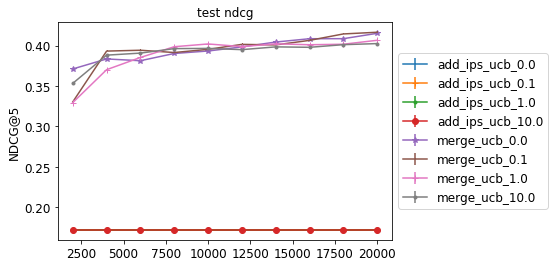

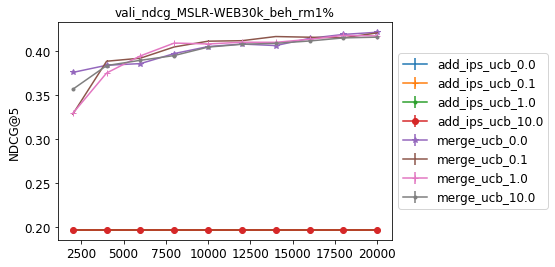

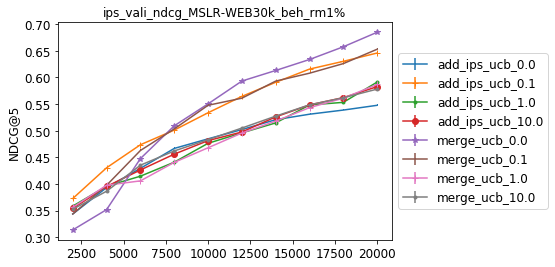

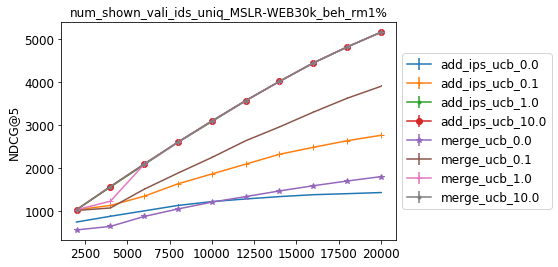

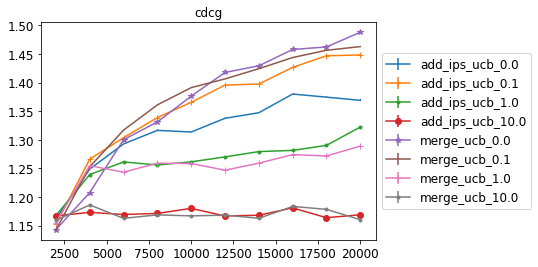

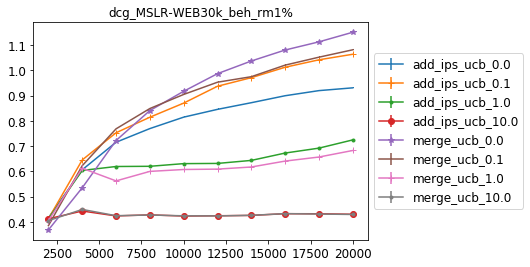

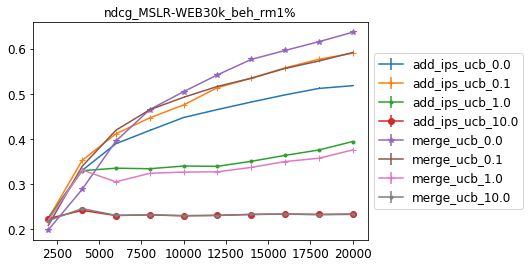

AssertionError: add_ips_ucb_0.0 doesn't contain the partition discounted_sum_cdcg

In [1162]:
# vali_name="cdcg"
# no_behav_param_std=get_best_tradeoff_param(result_mean['no_behav'][datasets]["std_proposional"]['n_updates_10'],vali_name=vali_name,step=11)
# no_behav_param_rd=get_best_tradeoff_param(result_mean['no_behav'][datasets]["random_tradeoff"]['n_updates_10'],vali_name=vali_name,step=11)

# print(no_behav_param,add_ips_param,add_click_param,"no_behav_param,add_ips_param,add_click_param")
result_reorg={

              "add_ips_ucb_0.0":result['no_behav'][datasets]["ips_ucb"]['n_updates_10']["tradeoff_0.0"],
            "add_ips_ucb_0.1":result['no_behav'][datasets]["ips_ucb"]['n_updates_10']["tradeoff_0.1"],
            "add_ips_ucb_1.0":result['no_behav'][datasets]["ips_ucb"]['n_updates_10']["tradeoff_1.0"],
            "add_ips_ucb_10.0":result['no_behav'][datasets]["ips_ucb"]['n_updates_10']["tradeoff_10.0"],
            "merge_ucb_0.0":result['no_behav'][datasets]["merge_ucb"]['n_updates_10']["tradeoff_0.0"],
            "merge_ucb_0.1":result['no_behav'][datasets]["merge_ucb"]['n_updates_10']["tradeoff_0.1"],
            "merge_ucb_1.0":result['no_behav'][datasets]["merge_ucb"]['n_updates_10']["tradeoff_1.0"],
            "merge_ucb_10.0":result['no_behav'][datasets]["merge_ucb"]['n_updates_10']["tradeoff_10.0"],

}
param_plot={"xscale":"linear"}
plot_initial(datasets,result_reorg,param_plot)
plt.xscale("linear")

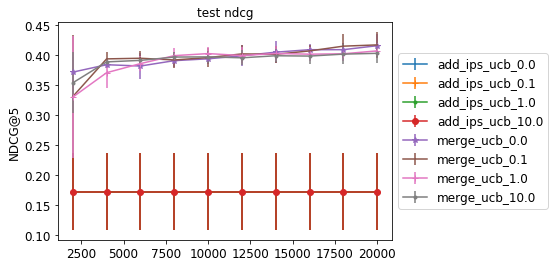

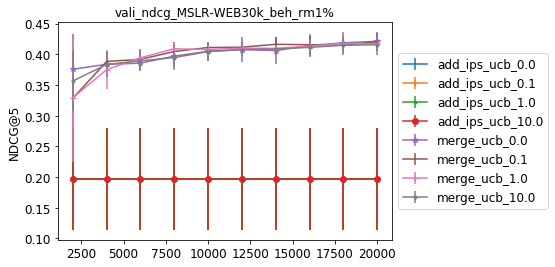

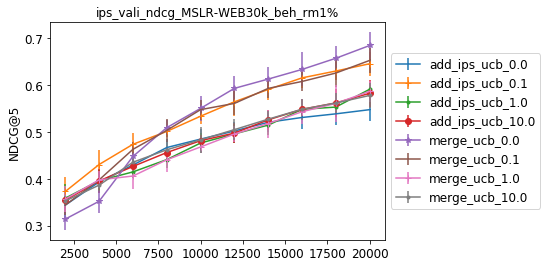

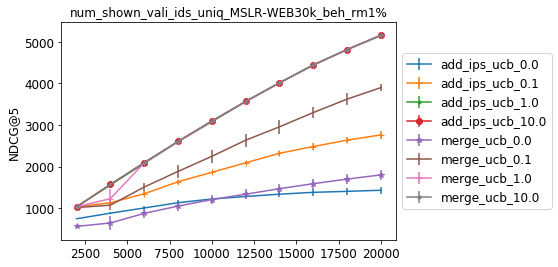

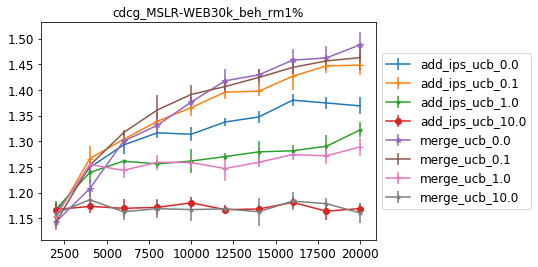

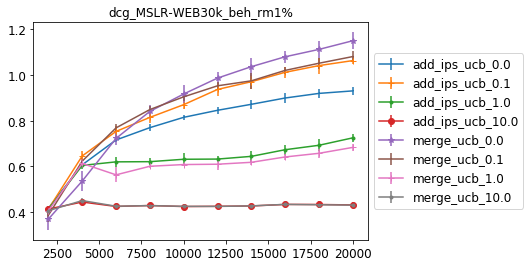

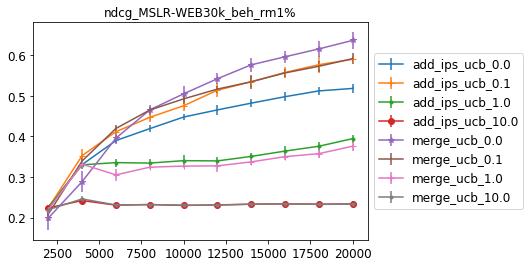

AssertionError: add_ips_ucb_0.0 doesn't contain the partition discounted_sum_cdcg

In [1093]:
path="addbehaviour_cold_20k"
datasets="MSLR-WEB30k_beh_rm1%"
result,result_mean=get_result_df(path,groupby="iterations")
# vali_name="cdcg"
# no_behav_param_std=get_best_tradeoff_param(result_mean['no_behav'][datasets]["std_proposional"]['n_updates_10'],vali_name=vali_name,step=11)
# no_behav_param_rd=get_best_tradeoff_param(result_mean['no_behav'][datasets]["random_tradeoff"]['n_updates_10'],vali_name=vali_name,step=11)

# print(no_behav_param,add_ips_param,add_click_param,"no_behav_param,add_ips_param,add_click_param")
result_reorg={

              "add_ips_ucb_0.0":result['no_behav'][datasets]["ips_ucb"]['n_updates_10']["tradeoff_0.0"],
            "add_ips_ucb_0.1":result['no_behav'][datasets]["ips_ucb"]['n_updates_10']["tradeoff_0.1"],
            "add_ips_ucb_1.0":result['no_behav'][datasets]["ips_ucb"]['n_updates_10']["tradeoff_1.0"],
            "add_ips_ucb_10.0":result['no_behav'][datasets]["ips_ucb"]['n_updates_10']["tradeoff_10.0"],
            "merge_ucb_0.0":result['no_behav'][datasets]["merge_ucb"]['n_updates_10']["tradeoff_0.0"],
            "merge_ucb_0.1":result['no_behav'][datasets]["merge_ucb"]['n_updates_10']["tradeoff_0.1"],
            "merge_ucb_1.0":result['no_behav'][datasets]["merge_ucb"]['n_updates_10']["tradeoff_1.0"],
            "merge_ucb_10.0":result['no_behav'][datasets]["merge_ucb"]['n_updates_10']["tradeoff_10.0"],

}
param_plot={"xscale":"linear"}
plot_initial(datasets,result_reorg,param_plot)
plt.xscale("linear")

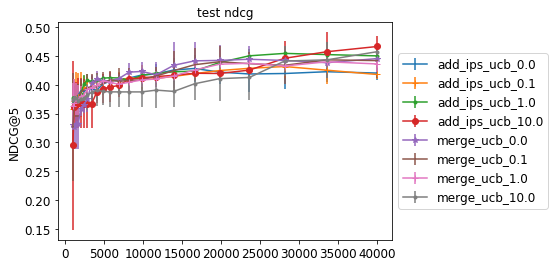

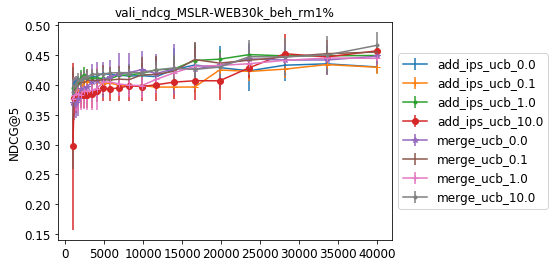

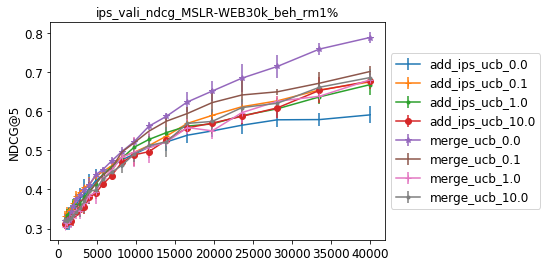

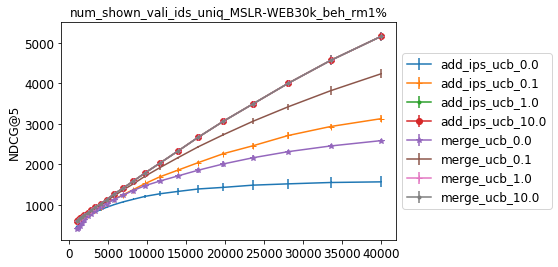

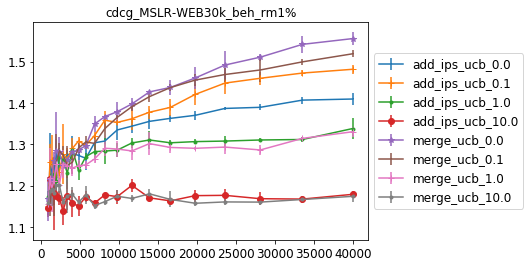

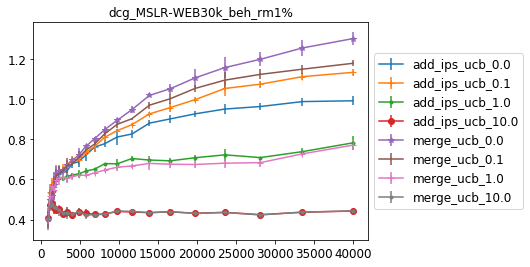

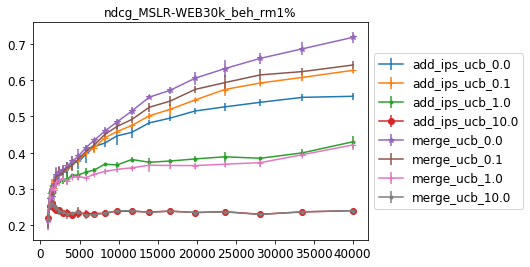

AssertionError: add_ips_ucb_0.0 doesn't contain the partition discounted_sum_cdcg

In [1117]:
path="addbehaviour_cold_40k_log"
datasets="MSLR-WEB30k_beh_rm1%"
result,result_mean=get_result_df(path,groupby="iterations")
# vali_name="cdcg"
# no_behav_param_std=get_best_tradeoff_param(result_mean['no_behav'][datasets]["std_proposional"]['n_updates_10'],vali_name=vali_name,step=11)
# no_behav_param_rd=get_best_tradeoff_param(result_mean['no_behav'][datasets]["random_tradeoff"]['n_updates_10'],vali_name=vali_name,step=11)

# print(no_behav_param,add_ips_param,add_click_param,"no_behav_param,add_ips_param,add_click_param")
result_reorg={

              "add_ips_ucb_0.0":result['no_behav'][datasets]["ips_ucb"]['n_updates_10']["tradeoff_0.0"],
            "add_ips_ucb_0.1":result['no_behav'][datasets]["ips_ucb"]['n_updates_10']["tradeoff_0.1"],
            "add_ips_ucb_1.0":result['no_behav'][datasets]["ips_ucb"]['n_updates_10']["tradeoff_1.0"],
            "add_ips_ucb_10.0":result['no_behav'][datasets]["ips_ucb"]['n_updates_10']["tradeoff_10.0"],
            "merge_ucb_0.0":result['no_behav'][datasets]["merge_ucb"]['n_updates_10']["tradeoff_0.0"],
            "merge_ucb_0.1":result['no_behav'][datasets]["merge_ucb"]['n_updates_10']["tradeoff_0.1"],
            "merge_ucb_1.0":result['no_behav'][datasets]["merge_ucb"]['n_updates_10']["tradeoff_1.0"],
            "merge_ucb_10.0":result['no_behav'][datasets]["merge_ucb"]['n_updates_10']["tradeoff_10.0"],

}
param_plot={"xscale":"linear"}
plot_initial(datasets,result_reorg,param_plot)
plt.xscale("linear")

/home/taoyang/miniconda3/envs/ultra_p36/lib/python3.6/site-packages/pandas/core/frame.py:7123: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


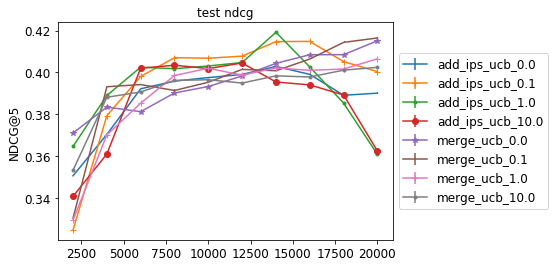

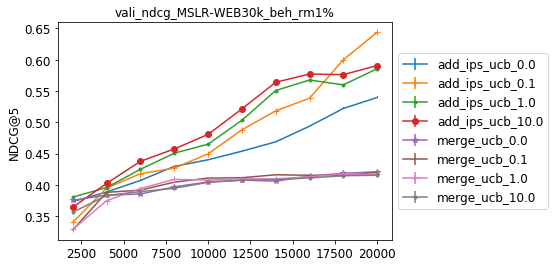

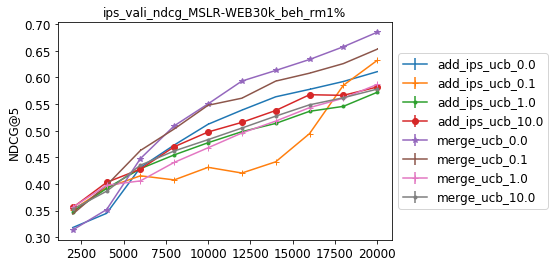

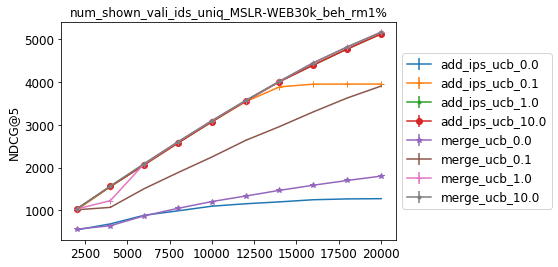

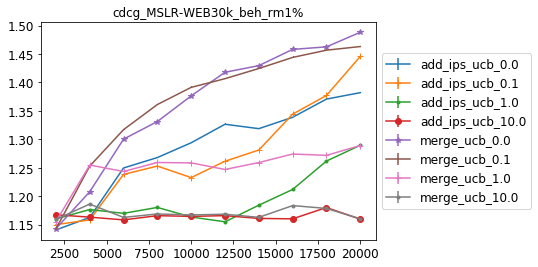

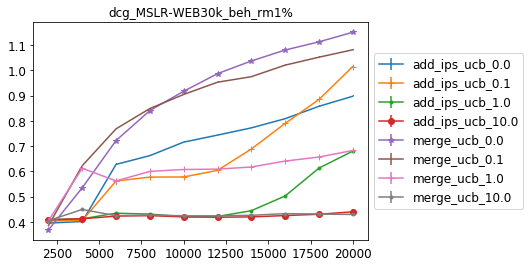

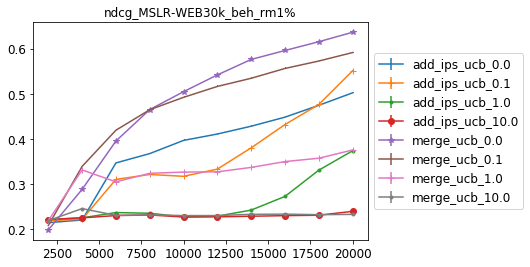

AssertionError: add_ips_ucb_0.0 doesn't contain the partition discounted_sum_cdcg

In [1146]:
path="addbehaviour_cold_20k"
datasets="MSLR-WEB30k_beh_rm1%"
result,result=get_result_df(path,groupby="iterations")
# vali_name="cdcg"
# no_behav_param_std=get_best_tradeoff_param(result_mean['no_behav'][datasets]["std_proposional"]['n_updates_10'],vali_name=vali_name,step=11)
# no_behav_param_rd=get_best_tradeoff_param(result_mean['no_behav'][datasets]["random_tradeoff"]['n_updates_10'],vali_name=vali_name,step=11)

# print(no_behav_param,add_ips_param,add_click_param,"no_behav_param,add_ips_param,add_click_param")
result_reorg={

              "add_ips_ucb_0.0":result['add_ips'][datasets]["ucb"]['n_updates_10']["tradeoff_0.0"],
            "add_ips_ucb_0.1":result['add_ips'][datasets]["ucb"]['n_updates_10']["tradeoff_0.1"],
            "add_ips_ucb_1.0":result['add_ips'][datasets]["ucb"]['n_updates_10']["tradeoff_1.0"],
            "add_ips_ucb_10.0":result['add_ips'][datasets]["ucb"]['n_updates_10']["tradeoff_10.0"],
            "merge_ucb_0.0":result['no_behav'][datasets]["merge_ucb"]['n_updates_10']["tradeoff_0.0"],
            "merge_ucb_0.1":result['no_behav'][datasets]["merge_ucb"]['n_updates_10']["tradeoff_0.1"],
            "merge_ucb_1.0":result['no_behav'][datasets]["merge_ucb"]['n_updates_10']["tradeoff_1.0"],
            "merge_ucb_10.0":result['no_behav'][datasets]["merge_ucb"]['n_updates_10']["tradeoff_10.0"],

}
param_plot={"xscale":"linear"}
plot_initial(datasets,result_reorg,param_plot)
plt.xscale("linear")

In [538]:
result_mean['no_behav'][datasets]["ucb_std"]['n_updates_10']["tradeoff_0.0"].head()

,iterations,initial_test_ndcg,ndcg,dcg,cdcg,test_ndcg,vali_ndcg
0,1000,0.205364,0.216292,0.394309,1.137948,0.292020,0.297258
1,1519,0.205364,0.215754,0.392330,1.136534,0.308343,0.309827
2,2310,0.205364,0.287328,0.519758,1.200030,0.378385,0.384709
3,3511,0.205364,0.354778,0.645682,1.293863,0.386862,0.383499
4,5336,0.205364,0.361511,0.658936,1.285351,0.397142,0.391476


In [697]:
result['no_behav'][datasets]["std_proposional"]['n_updates_10']["tradeoff_0.0"]["initial_test_ndcg"].unique()

array([0.17959656, 0.3120296 , 0.31791737, 0.26950443, 0.16340299,
       0.27309331, 0.18386512, 0.12231178, 0.20977122, 0.14484901,
       0.28671551, 0.10917417, 0.09995873, 0.25999778, 0.36509359,
       0.18418673, 0.15240904, 0.34150048, 0.23633469, 0.32550481])

In [699]:
result['no_behav'][datasets]["ucb_std"]['n_updates_10']["tradeoff_0.0"]["initial_test_ndcg"].unique()

array([0.17959656, 0.3120296 , 0.31791737, 0.26950443, 0.16340299,
       0.27309331, 0.18386512, 0.12231178, 0.20977122, 0.14484901,
       0.28671551, 0.10917417, 0.09995873, 0.25999778, 0.36509359,
       0.18418673, 0.15240904, 0.34150048, 0.23633469, 0.32550481])

1.0 from [1.e+00 1.e+03 1.e+04 1.e-01 1.e+01 1.e+02 0.e+00]
1.0 from [1.e-01 1.e+01 1.e+02 1.e-02 0.e+00 1.e+00]
0.1 from [1.e+00 1.e-01 1.e+04 1.e+02 1.e+03 0.e+00 1.e+01]
tradeoff_0.01 tradeoff_0.1 tradeoff_0.1 no_behav_param,add_ips_param,add_click_param


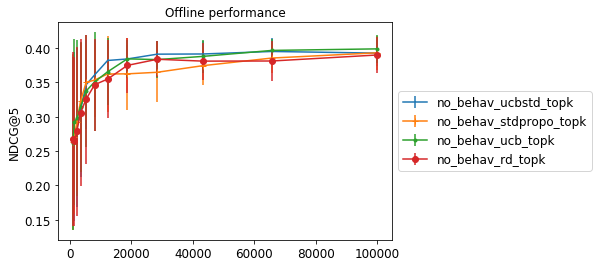

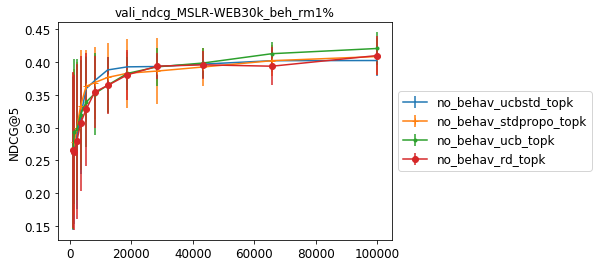

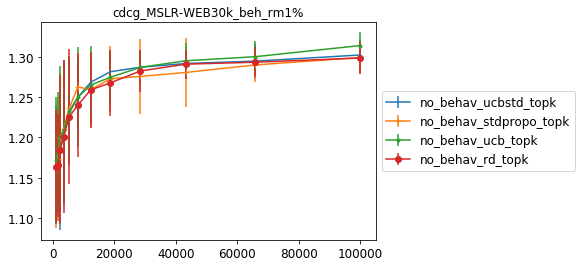

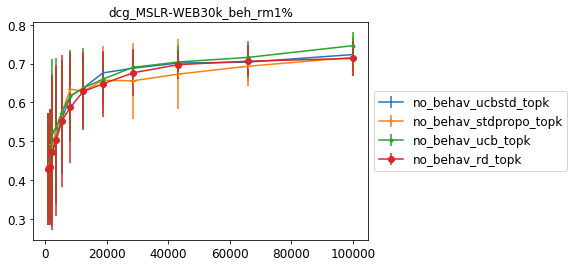

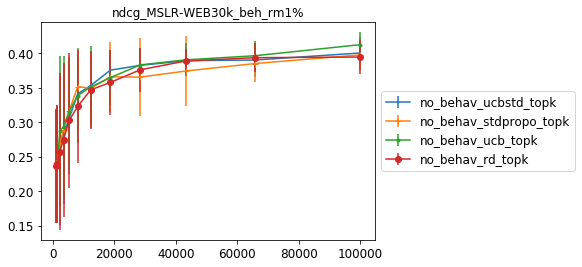

AssertionError: no_behav_ucbstd_topk doesn't contain the partition discounted_sum_cdcg

In [695]:
# path="addbehaviour"
# result,result_mean=get_result_df(path,groupby="iterations")
vali_name="test_ndcg"
no_behav_param_std=get_best_tradeoff_param(result_mean['no_behav'][datasets]["ucb_std"]['n_updates_10'],vali_name=vali_name,step=11)
no_behav_param_rd=get_best_tradeoff_param(result_mean['no_behav'][datasets]["random_tradeoff"]['n_updates_10'],vali_name=vali_name,step=11)
no_behav_param_pr=get_best_tradeoff_param(result_mean['no_behav'][datasets]["std_proposional"]['n_updates_10'],vali_name=vali_name,step=11)

print(no_behav_param,add_ips_param,add_click_param,"no_behav_param,add_ips_param,add_click_param")
result_reorg={

#               "no_behav_tuned_ucbstd":result['no_behav'][datasets]["ucb_std"]['n_updates_10'][no_behav_param_std],
#               "no_behav_tuned_rd":result['no_behav'][datasets]["random_tradeoff"]['n_updates_10'][no_behav_param_rd],
#             "no_behav_tuned_stdpropo":result['no_behav'][datasets]["std_proposional"]['n_updates_10'][no_behav_param_pr],
              "no_behav_ucbstd_topk":result['no_behav'][datasets]["ucb_std"]['n_updates_10']["tradeoff_0.0"],
                "no_behav_stdpropo_topk":result['no_behav'][datasets]["std_proposional"]['n_updates_10']["tradeoff_0.0"],
             "no_behav_ucb_topk":result['no_behav'][datasets]["ucb"]['n_updates_10']["tradeoff_0.0"],
              "no_behav_rd_topk":result['no_behav'][datasets]["random_tradeoff"]['n_updates_10']["tradeoff_0.0"],
#                 "pdgd":result["gumbel"]['n_updates_40']['tradeoff_1.0']
#
             }
param_plot={"xscale":"linear"}
plot_initial(datasets,result_reorg,param_plot)
plt.xscale("linear")

10000.0 from [1.e+02 1.e+00 1.e-01 1.e+03 0.e+00 1.e+01 1.e+04]
0.1 from [1.e-01 1.e-02 0.e+00 1.e+00 1.e+01 1.e+02]
-0.01 from [-1.e+01  1.e+02 -1.e-01  1.e+03  1.e+00 -1.e+02  1.e+04  0.e+00 -1.e+00
  1.e+01 -1.e-02  1.e-01]
tradeoff_0.01 tradeoff_0.1 tradeoff_0.1 no_behav_param,add_ips_param,add_click_param


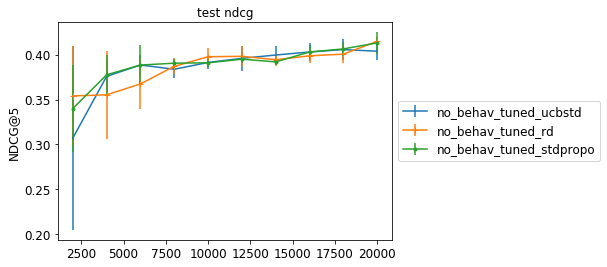

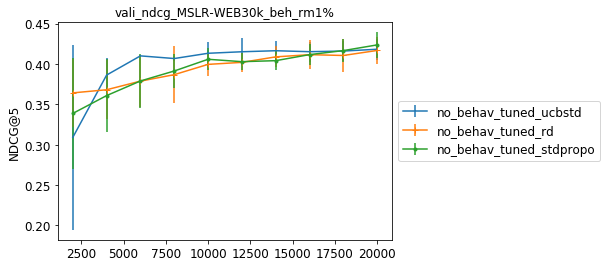

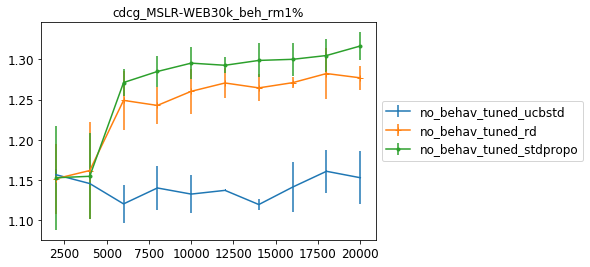

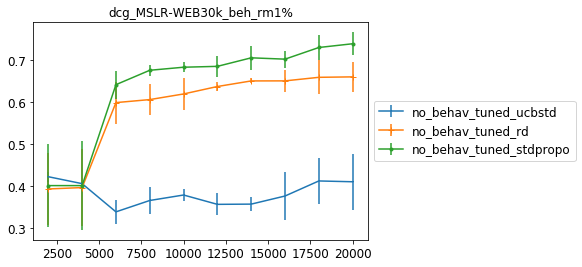

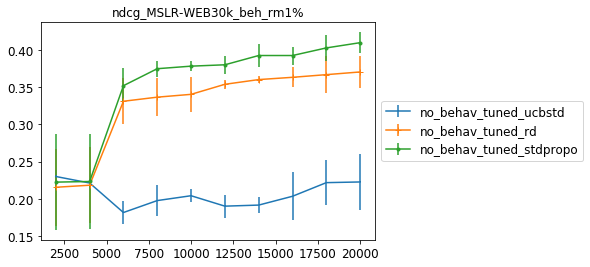

AssertionError: no_behav_tuned_ucbstd doesn't contain the partition discounted_sum_cdcg

In [960]:
path="addbehaviour"
result,result_mean=get_result_df(path,groupby="iterations")
vali_name="vali_ndcg"
step=9
no_behav_param_ucbstd=get_best_tradeoff_param(result_mean['no_behav'][datasets]["ucb_std"]['n_updates_10'],vali_name=vali_name,step=step)
no_behav_param_rd=get_best_tradeoff_param(result_mean['no_behav'][datasets]["random_tradeoff"]['n_updates_10'],vali_name=vali_name,step=step)
no_behav_param_pr=get_best_tradeoff_param(result_mean['no_behav'][datasets]["std_proposional"]['n_updates_10'],vali_name=vali_name,step=step)

print(no_behav_param,add_ips_param,add_click_param,"no_behav_param,add_ips_param,add_click_param")
result_reorg={

              "no_behav_tuned_ucbstd":result['no_behav'][datasets]["ucb_std"]['n_updates_10'][no_behav_param_ucbstd],
              "no_behav_tuned_rd":result['no_behav'][datasets]["random_tradeoff"]['n_updates_10'][no_behav_param_rd],
            "no_behav_tuned_stdpropo":result['no_behav'][datasets]["std_proposional"]['n_updates_10'][no_behav_param_pr],
#               "no_behav_ucbstd_topk":result['no_behav'][datasets]["ucb_std"]['n_updates_10']["tradeoff_0.0"],
#                 "no_behav_stdpropo_topk":result['no_behav'][datasets]["std_proposional"]['n_updates_10']["tradeoff_0.0"],
#              "no_behav_ucb_topk":result['no_behav'][datasets]["ucb"]['n_updates_10']["tradeoff_0.0"],
#               "no_behav_rd_topk":result['no_behav'][datasets]["random_tradeoff"]['n_updates_10']["tradeoff_0.0"],
#                 "pdgd":result["gumbel"]['n_updates_40']['tradeoff_1.0']
#
             }
param_plot={"xscale":"linear"}
plot_initial(datasets,result_reorg,param_plot)
plt.xscale("linear")

[0.3753679  0.39851135 0.37491035 0.39953921 0.40625856 0.39132174] [1.22279216 1.22799977 1.17730289 1.16833861 1.15990733 1.14511204]
[0.34237188 0.35218004 0.34541959 0.36903104 0.33676738 0.36183021] [1.27362035 1.27330199 1.31720304 1.26472146 1.16192559 1.14035172]


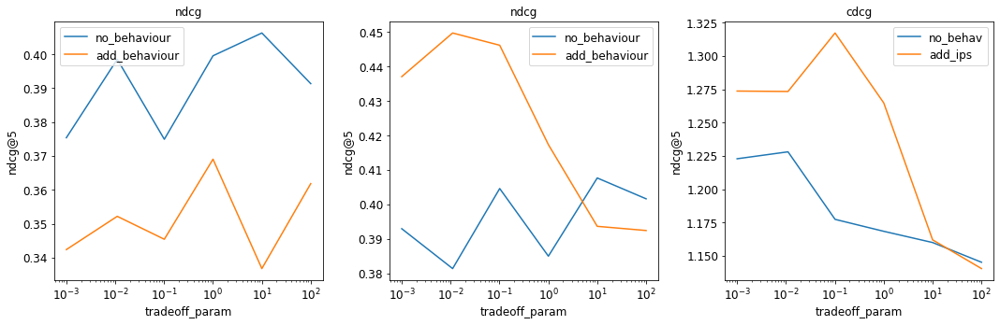

In [1142]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour_cold_40k_log"
datasets="MSLR-WEB30k_beh_rm1%"



result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[9]
feature_stra=['no_behav','add_ips',"add_click"]
feature_stra=['no_behav','add_ips']
feature_stra_name={"no_behav":"no_behaviour","add_ips":"add_behaviour"}
for step in steps:
    fig, axs = plt.subplots(1,3,figsize=(15,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["ucb"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        print(test_ndcg,cdcg)
        axs[0].plot(param+0.001,test_ndcg,label=feature_stra_name[method])
        axs[1].plot(param+0.001,vali_ndcg,label=feature_stra_name[method])
        axs[2].plot(param+0.001,cdcg,label=method)
        axs[0].title.set_text('ndcg')
        axs[1].title.set_text('ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('log')
#         axs[0].set_ylim([0,1.0])
#         axs[1].set_ylim([0,1.0])
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg@5")
        ax.legend()
    fig.tight_layout()
    plt.legend()
    plt.show()

[0.38983977 0.39824776 0.41738126 0.42001365 0.41613835 0.412927  ] [1.29859004 1.31215885 1.29831134 1.21118176 1.16727112 1.16088615]
[0.3148984  0.28619535 0.28931416 0.28366431 0.32058757 0.3313196 ] [1.36275972 1.38833537 1.45692203 1.45054272 1.25193086 1.17095665]
[0.24863555 0.25397356 0.25157631 0.23577686 0.23256739 0.27245922] [1.33989149 1.35700009 1.41746316 1.41526791 1.23152895 1.16861501]


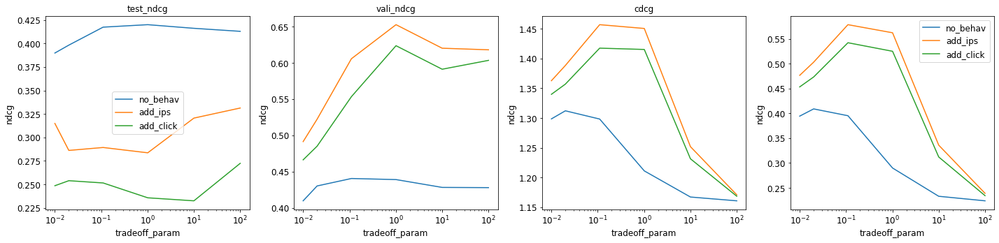

In [843]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour"
datasets="MSLR-WEB30k_beh_rm1%"



result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[11]
feature_stra=['no_behav','add_ips',"add_click"]

for step in steps:
    fig, axs = plt.subplots(1,4,figsize=(20,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["random_tradeoff"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,ndcg=evl.extract_tradeoff_res(random_tradeoff,["ndcg"],step=step)
        print(test_ndcg,cdcg)
        axs[0].plot(param+0.01,test_ndcg,label=method)
        axs[1].plot(param+0.01,vali_ndcg,label=method)
        axs[2].plot(param+0.01,cdcg,label=method)
        axs[3].plot(param+0.01,ndcg,label=method)
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

In [844]:
result_mean[method][datasets]["random_tradeoff"]['n_updates_10']

{'tradeoff_100.0':     iterations  initial_test_ndcg      ndcg       dcg      cdcg  test_ndcg  \
 0         1000           0.226872  0.222335  0.408575  1.161063   0.297364   
 1         1519           0.226872  0.222779  0.410116  1.149939   0.314315   
 2         2310           0.226872  0.223361  0.410931  1.165968   0.333304   
 3         3511           0.226872  0.223223  0.411010  1.162295   0.350914   
 4         5336           0.226872  0.224966  0.414219  1.163467   0.366456   
 5         8111           0.226872  0.223954  0.412004  1.160126   0.388932   
 6        12328           0.226872  0.223802  0.411296  1.161820   0.396706   
 7        18738           0.226872  0.225237  0.414681  1.162147   0.393084   
 8        28480           0.226872  0.228119  0.419857  1.161226   0.366769   
 9        43287           0.226872  0.231589  0.426982  1.167610   0.335836   
 10       65793           0.226872  0.233184  0.429689  1.166518   0.295963   
 11      100000           0.226872

[0.39664302 0.40234519 0.3897182  0.39971443 0.37814574 0.38988193
 0.38079338 0.40181558 0.38404526 0.36695658 0.37248147 0.36065849] [1.23700872 1.27121396 1.29802498 1.30645334 1.29391846 1.29162613
 1.29320479 1.26081048 1.12435918 1.07395135 1.07433563 1.07451867]
[0.26562972 0.30036146 0.35440608 0.34783407 0.33028327 0.36684776
 0.35745178 0.34716453 0.31104721 0.30813768 0.31037139 0.29257365] [1.20596004 1.24894292 1.35620933 1.34714175 1.3590081  1.33835988
 1.35727242 1.34616813 1.25654057 1.24323956 1.23316238 1.24358596]
[0.27034723 0.26732045 0.26069021 0.26062003 0.27232234 0.24511435
 0.2718385  0.26112134 0.3364882  0.32063873 0.32594953 0.31450773] [1.2237153  1.27660652 1.33105998 1.33949036 1.32493492 1.34246061
 1.33445022 1.31892704 1.22834502 1.16408643 1.1553697  1.15428355]


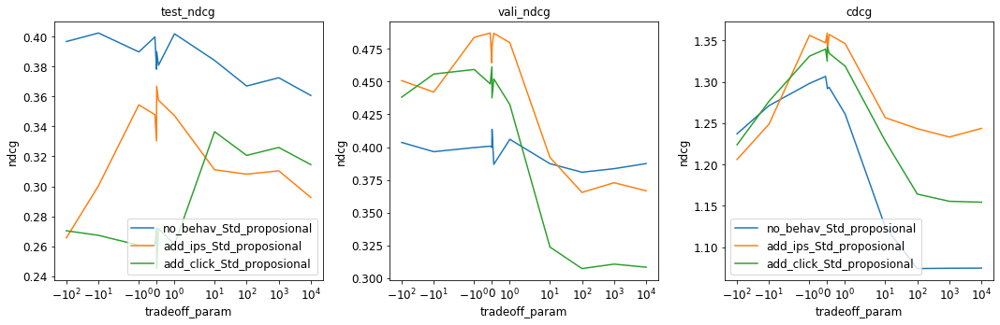

In [840]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour_cold_20k"
datasets="MSLR-WEB30k_beh_rm1%"



result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[9]
feature_stra=['no_behav','add_ips',"add_click"]

for step in steps:
    fig, axs = plt.subplots(1,3,figsize=(15,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["std_proposional"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        print(test_ndcg,cdcg)
        axs[0].plot(param+0.01,test_ndcg,label=method+"_Std_proposional")
        axs[1].plot(param+0.01,vali_ndcg,label=method+"_Std_proposional")
        axs[2].plot(param+0.01,cdcg,label=method+"_Std_proposional")
        
        
#         random_tradeoff=result_mean[method][datasets]["random_tradeoff"]['n_updates_10']
#         param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
#         param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
#         print(test_ndcg,cdcg)
#         axs[0].plot(param+0.001,test_ndcg,label=method+"rd")
#         axs[1].plot(param+0.001+0.001,vali_ndcg,label=method+"rd")
#         axs[2].plot(param+0.001,cdcg,label=method+"rd")
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('symlog')
        axs[1].set_xscale('symlog')
        axs[2].set_xscale('symlog')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    
    plt.show()

[0.39664302 0.40234519 0.3897182  0.39971443 0.37814574 0.38988193
 0.38079338 0.40181558 0.38404526 0.36695658 0.37248147 0.36065849] [1.23700872 1.27121396 1.29802498 1.30645334 1.29391846 1.29162613
 1.29320479 1.26081048 1.12435918 1.07395135 1.07433563 1.07451867]
[0.26562972 0.30036146 0.35440608 0.34783407 0.33028327 0.36684776
 0.35745178 0.34716453 0.31104721 0.30813768 0.31037139 0.29257365] [1.20596004 1.24894292 1.35620933 1.34714175 1.3590081  1.33835988
 1.35727242 1.34616813 1.25654057 1.24323956 1.23316238 1.24358596]
[0.27034723 0.26732045 0.26069021 0.26062003 0.27232234 0.24511435
 0.2718385  0.26112134 0.3364882  0.32063873 0.32594953 0.31450773] [1.2237153  1.27660652 1.33105998 1.33949036 1.32493492 1.34246061
 1.33445022 1.31892704 1.22834502 1.16408643 1.1553697  1.15428355]


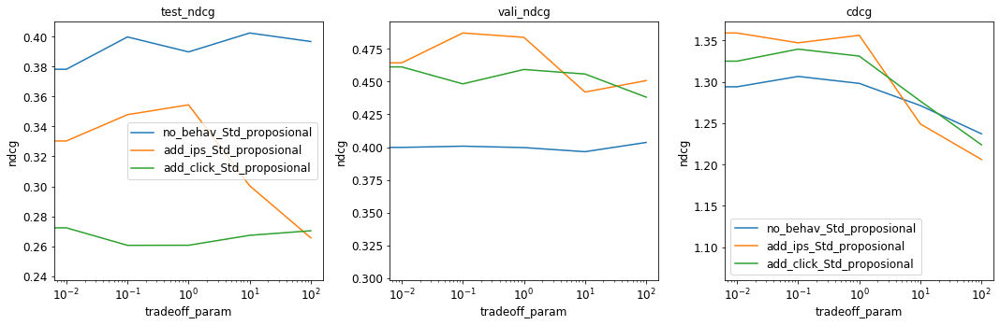

In [856]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour_cold_20k"
datasets="MSLR-WEB30k_beh_rm1%"



# result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[9]
feature_stra=['no_behav','add_ips',"add_click"]

for step in steps:
    fig, axs = plt.subplots(1,3,figsize=(15,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["std_proposional"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        print(test_ndcg,cdcg)
        axs[0].plot(-param,test_ndcg,label=method+"_Std_proposional")
        axs[1].plot(-param,vali_ndcg,label=method+"_Std_proposional")
        axs[2].plot(-param,cdcg,label=method+"_Std_proposional")
        
        
#         random_tradeoff=result_mean[method][datasets]["random_tradeoff"]['n_updates_10']
#         param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
#         param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
#         print(test_ndcg,cdcg)
#         axs[0].plot(param+0.001,test_ndcg,label=method+"rd")
#         axs[1].plot(param+0.001+0.001,vali_ndcg,label=method+"rd")
#         axs[2].plot(param+0.001,cdcg,label=method+"rd")
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    
    plt.show()

[0.38440714 0.38682955 0.40786527 0.40725198 0.3991016  0.39712298] [1.29277308 1.3142468  1.27013043 1.1985024  1.16009007 1.15417735]
[0.38514439 0.37842072 0.39526267 0.39989063 0.39209006 0.40277107] [1.31593792 1.28629702 1.24606698 1.15803807 1.15314531 1.16186148]
[0.35465409 0.34082405 0.33397003 0.35022598 0.32045368 0.34761136] [1.33317373 1.3736164  1.41662004 1.38956889 1.22478593 1.16973735]
[0.35471697 0.3166598  0.35476681 0.35301614 0.33576012 0.33669601] [1.36331163 1.38444226 1.42998226 1.40689445 1.16094937 1.15921189]
[0.26976909 0.26874513 0.27778686 0.27722441 0.30579706 0.36581802] [1.32744985 1.3482768  1.40826332 1.36769032 1.2139902  1.16239643]
[0.26842928 0.26241835 0.25253012 0.31844083 0.33393446 0.3339425 ] [1.32494976 1.37020424 1.45307232 1.40397201 1.17396664 1.16218787]


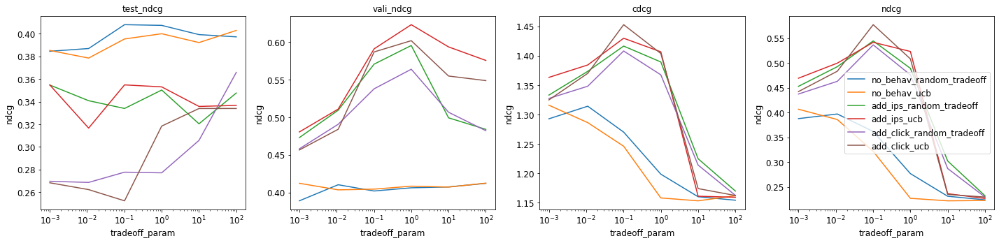

In [858]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour"
datasets="MSLR-WEB30k_beh_rm1%"



# result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[9]
feature_stra=['no_behav','add_ips',"add_click"]

for step in steps:
    fig, axs = plt.subplots(1,4,figsize=(20,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["random_tradeoff"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,ndcg=evl.extract_tradeoff_res(random_tradeoff,["ndcg"],step=step)
        print(test_ndcg,cdcg)
        axs[0].plot(param+0.001,test_ndcg,label=method+"_random_tradeoff")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"_random_tradeoff")
        axs[2].plot(param+0.001,cdcg,label=method+"_random_tradeoff")
        axs[3].plot(param+0.001,ndcg,label=method+"_random_tradeoff")
        
        random_tradeoff=result_mean[method][datasets]["ucb"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,ndcg=evl.extract_tradeoff_res(random_tradeoff,["ndcg"],step=step)
        print(test_ndcg,cdcg)
        axs[0].plot(param+0.001,test_ndcg,label=method+"_ucb")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"_ucb")
        axs[2].plot(param+0.001,cdcg,label=method+"_ucb")
        axs[3].plot(param+0.001,ndcg,label=method+"_ucb")
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[3].title.set_text('ndcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
#         axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

[0.38440714 0.38682955 0.40786527 0.40725198 0.3991016  0.39712298] [1.29277308 1.3142468  1.27013043 1.1985024  1.16009007 1.15417735]
[0.38514439 0.37842072 0.39526267 0.39989063 0.39209006 0.40277107] [1.31593792 1.28629702 1.24606698 1.15803807 1.15314531 1.16186148]
[0.35465409 0.34082405 0.33397003 0.35022598 0.32045368 0.34761136] [1.33317373 1.3736164  1.41662004 1.38956889 1.22478593 1.16973735]
[0.35471697 0.3166598  0.35476681 0.35301614 0.33576012 0.33669601] [1.36331163 1.38444226 1.42998226 1.40689445 1.16094937 1.15921189]
[0.26976909 0.26874513 0.27778686 0.27722441 0.30579706 0.36581802] [1.32744985 1.3482768  1.40826332 1.36769032 1.2139902  1.16239643]
[0.26842928 0.26241835 0.25253012 0.31844083 0.33393446 0.3339425 ] [1.32494976 1.37020424 1.45307232 1.40397201 1.17396664 1.16218787]


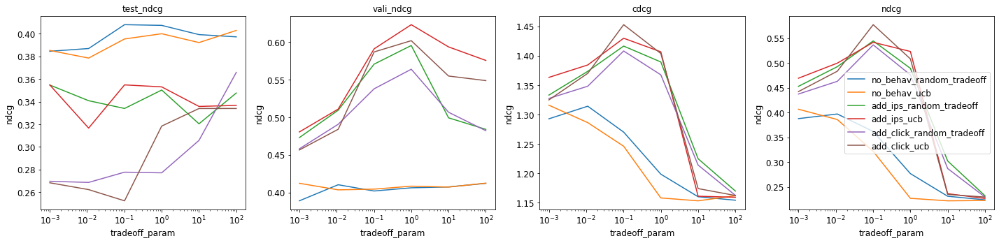

In [857]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour_cold_20k"
datasets="MSLR-WEB30k_beh_rm1%"



# result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[9]
feature_stra=['no_behav','add_ips',"add_click"]

for step in steps:
    fig, axs = plt.subplots(1,4,figsize=(20,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["random_tradeoff"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,ndcg=evl.extract_tradeoff_res(random_tradeoff,["ndcg"],step=step)
        print(test_ndcg,cdcg)
        axs[0].plot(param+0.001,test_ndcg,label=method+"_random_tradeoff")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"_random_tradeoff")
        axs[2].plot(param+0.001,cdcg,label=method+"_random_tradeoff")
        axs[3].plot(param+0.001,ndcg,label=method+"_random_tradeoff")
        
        random_tradeoff=result_mean[method][datasets]["ucb"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,ndcg=evl.extract_tradeoff_res(random_tradeoff,["ndcg"],step=step)
        print(test_ndcg,cdcg)
        axs[0].plot(param+0.001,test_ndcg,label=method+"_ucb")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"_ucb")
        axs[2].plot(param+0.001,cdcg,label=method+"_ucb")
        axs[3].plot(param+0.001,ndcg,label=method+"_ucb")
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[3].title.set_text('ndcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
#         axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

[0.40204187 0.39623557 0.4147011  0.40702088 0.39702253 0.40813917] [1.31911355 1.30802307 1.27706914 1.19599259 1.15069989 1.15064556]
[0.38487843 0.40878409 0.39723919 0.39540667 0.40056786 0.39838081] [1.3050277  1.29032749 1.26010482 1.1532937  1.15311123 1.16474869]
[0.41160287 0.40608966 0.41403963 0.36140675 0.34883292 0.34096615] [1.40847958 1.41240807 1.41675085 1.40559252 1.23251944 1.16447426]
[0.403345   0.38225162 0.40151173 0.38573862 0.30601259 0.34366696] [1.37702456 1.42392032 1.51093965 1.39362226 1.16375387 1.17437879]


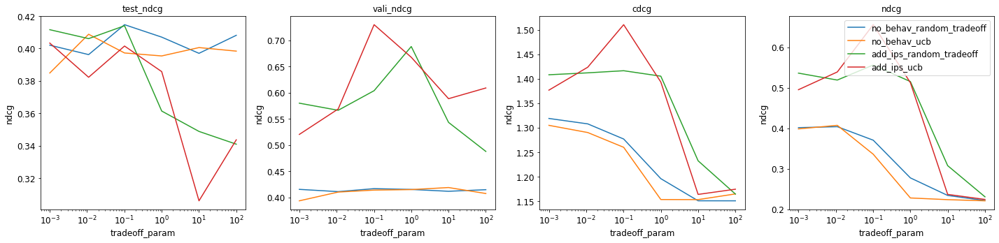

In [938]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour"
datasets="MSLR-WEB30k_beh_rm1%"



result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[9]
feature_stra=['no_behav','add_ips']

for step in steps:
    fig, axs = plt.subplots(1,4,figsize=(20,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["random_tradeoff"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,ndcg=evl.extract_tradeoff_res(random_tradeoff,["ndcg"],step=step)
        print(test_ndcg,cdcg)
        axs[0].plot(param+0.001,test_ndcg,label=method+"_random_tradeoff")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"_random_tradeoff")
        axs[2].plot(param+0.001,cdcg,label=method+"_random_tradeoff")
        axs[3].plot(param+0.001,ndcg,label=method+"_random_tradeoff")
        
        random_tradeoff=result_mean[method][datasets]["ucb"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,ndcg=evl.extract_tradeoff_res(random_tradeoff,["ndcg"],step=step)
        print(test_ndcg,cdcg)
        axs[0].plot(param+0.001,test_ndcg,label=method+"_ucb")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"_ucb")
        axs[2].plot(param+0.001,cdcg,label=method+"_ucb")
        axs[3].plot(param+0.001,ndcg,label=method+"_ucb")
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[3].title.set_text('ndcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
#         axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

[0.40773595 0.40735336 0.40560224 0.4039814  0.38381728 0.39632525] [1.30227114 1.29066856 1.26974407 1.19785734 1.16651679 1.16019337]
[0.40629317 0.3978559  0.40437524 0.40020003 0.39922023 0.40230235] [1.28961514 1.29808539 1.23373585 1.16639988 1.15700711 1.15902854]
[0.41605105 0.40874118 0.40520432 0.39283764 0.37615718 0.39063769] [1.3673856  1.34521231 1.40991628 1.31598854 1.19835528 1.17133282]
[0.38266841 0.40299826 0.39650956 0.36840847 0.36230267 0.35054519] [1.37722904 1.39832541 1.44179991 1.28839071 1.15963704 1.15791371]


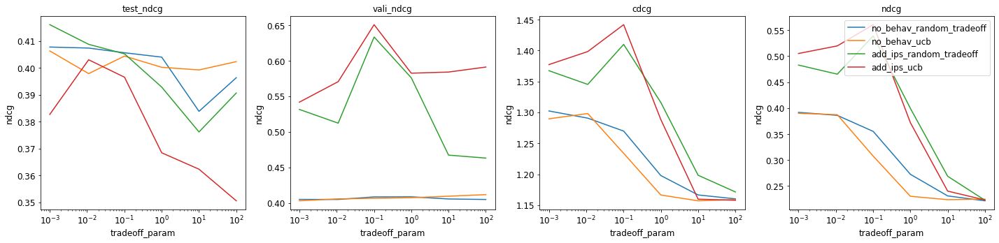

In [945]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour_cold_20k"
datasets="MSLR-WEB30k_beh_rm1%"



result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[9]
feature_stra=['no_behav','add_ips']

for step in steps:
    fig, axs = plt.subplots(1,4,figsize=(20,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["random_tradeoff"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,ndcg=evl.extract_tradeoff_res(random_tradeoff,["ndcg"],step=step)
        print(test_ndcg,cdcg)
        axs[0].plot(param+0.001,test_ndcg,label=method+"_random_tradeoff")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"_random_tradeoff")
        axs[2].plot(param+0.001,cdcg,label=method+"_random_tradeoff")
        axs[3].plot(param+0.001,ndcg,label=method+"_random_tradeoff")
        
        random_tradeoff=result_mean[method][datasets]["ucb"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,ndcg=evl.extract_tradeoff_res(random_tradeoff,["ndcg"],step=step)
        print(test_ndcg,cdcg)
        axs[0].plot(param+0.001,test_ndcg,label=method+"_ucb")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"_ucb")
        axs[2].plot(param+0.001,cdcg,label=method+"_ucb")
        axs[3].plot(param+0.001,ndcg,label=method+"_ucb")
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[3].title.set_text('ndcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
#         axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

[0.44026388 0.43059965 0.44041227 0.45028388 0.44528134 0.47250179] [1.36775071 1.36738532 1.39243068 1.24158785 1.16951682 1.15890495] ucb
[0.17218012 0.17218012 0.17218012 0.17218012 0.17218012 0.17218012
 0.17218012] [1.5548414  1.6771318  1.6778804  1.64364895 1.19599255 1.16436626
 1.1617515 ] ucb_std
[0.33867862 0.33454819 0.23084416 0.33695747 0.35976656 0.32155901] [1.54071131 1.61413907 1.70740557 1.64283086 1.19597299 1.15950901] ucb
[] [] ucb_std


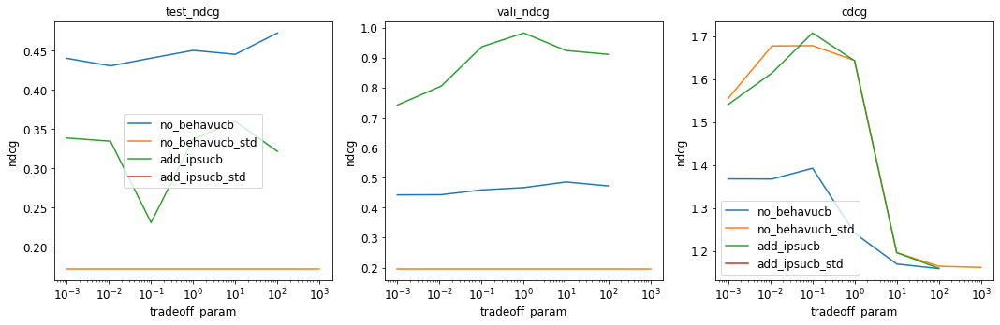

In [1109]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour_cold_200k"
datasets="MSLR-WEB30k_beh_rm1%"



result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[9]
feature_stra=['no_behav','add_ips']
# feature_stra=['no_behav']
for step in steps:
    fig, axs = plt.subplots(1,3,figsize=(15,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["ucb"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"ucb")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"ucb")
        axs[2].plot(param+0.001,cdcg,label=method+"ucb")
        
        
        random_tradeoff=result_mean[method][datasets]["ips_ucb"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        print(test_ndcg,cdcg,"ucb_std")
        axs[0].plot(param+0.001,test_ndcg,label=method+"ucb_std")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"ucb_std")
        axs[2].plot(param+0.001,cdcg,label=method+"ucb_std")
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

[0.38487843 0.40878409 0.39723919 0.39540667 0.40056786 0.39838081] [1.3050277  1.29032749 1.26010482 1.1532937  1.15311123 1.16474869] ucb
[0.3923594  0.40616425 0.39255231 0.40108222 0.3940452  0.40415152
 0.40368362] [1.30472346 1.31276966 1.2299216  1.11863471 1.1527181  1.15503196
 1.1530856 ] ucb_std
[0.403345   0.38225162 0.40151173 0.38573862 0.30601259 0.34366696] [1.37702456 1.42392032 1.51093965 1.39362226 1.16375387 1.17437879] ucb
[0.40101522 0.40479496 0.4008884  0.37165007 0.33108405 0.37554369
 0.38571774] [1.36800805 1.42228938 1.50400032 1.35973696 1.23488012 1.27505346
 1.26317894] ucb_std


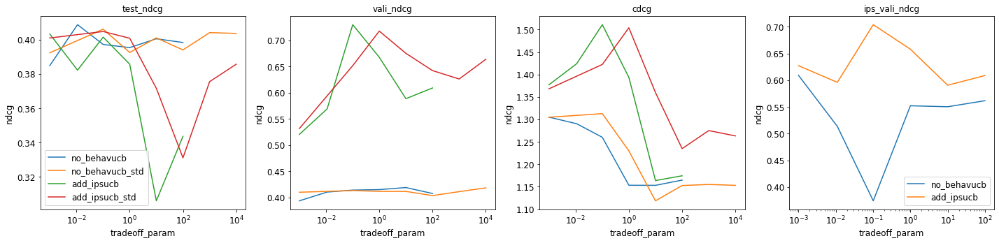

In [937]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour"
datasets="MSLR-WEB30k_beh_rm1%"



result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[9]
# feature_stra=['no_behav','add_ips',"add_click"]
feature_stra=['no_behav','add_ips']
for step in steps:
    fig, axs = plt.subplots(1,4,figsize=(20,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["ucb"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"ucb")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"ucb")
        axs[2].plot(param+0.001,cdcg,label=method+"ucb")
#         if method=="no_behav":
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"ucb")
        axs[3].title.set_text('ips_vali_ndcg')
        axs[3].legend()
        random_tradeoff=result_mean[method][datasets]["ucb_std"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        print(test_ndcg,cdcg,"ucb_std")
        axs[0].plot(param+0.001,test_ndcg,label=method+"ucb_std")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"ucb_std")
        axs[2].plot(param+0.001,cdcg,label=method+"ucb_std")
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

[0.40204187 0.39623557 0.4147011  0.40702088 0.39702253 0.40813917] [1.31911355 1.30802307 1.27706914 1.19599259 1.15069989 1.15064556] ucb
[0.38487843 0.40878409 0.39723919 0.39540667 0.40056786 0.39838081] [1.3050277  1.29032749 1.26010482 1.1532937  1.15311123 1.16474869] ucb
[0.41160287 0.40608966 0.41403963 0.36140675 0.34883292 0.34096615] [1.40847958 1.41240807 1.41675085 1.40559252 1.23251944 1.16447426] ucb
[0.403345   0.38225162 0.40151173 0.38573862 0.30601259 0.34366696] [1.37702456 1.42392032 1.51093965 1.39362226 1.16375387 1.17437879] ucb


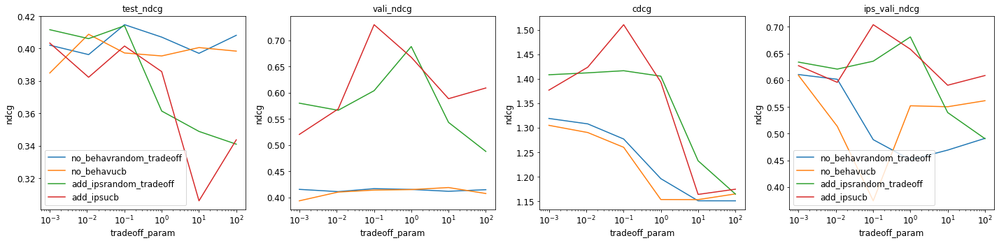

In [976]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour"
datasets="MSLR-WEB30k_beh_rm1%"



result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[9]
# feature_stra=['no_behav','add_ips',"add_click"]
feature_stra=['no_behav','add_ips']
for step in steps:
    fig, axs = plt.subplots(1,4,figsize=(20,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["random_tradeoff"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"random_tradeoff")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"random_tradeoff")
        axs[2].plot(param+0.001,cdcg,label=method+"random_tradeoff")
#         if method=="no_behav":
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"random_tradeoff")
        axs[3].title.set_text('ips_vali_ndcg')
        axs[3].legend()
        random_tradeoff=result_mean[method][datasets]["ucb"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"ucb")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"ucb")
        axs[2].plot(param+0.001,cdcg,label=method+"ucb")
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"ucb")
        axs[3].title.set_text('ips_vali_ndcg')
        axs[3].legend()
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

[0.4544303  0.45910077 0.46244183 0.44497641 0.44432416 0.45114154] [1.34797363 1.34290342 1.32158271 1.22747612 1.16852235 1.1606492 ] ucb
[0.47190719 0.45576896 0.46335028 0.44510083 0.46095117] [1.34722217 1.37036678 1.34028026 1.26312738 1.21284797] ucb
[0.2974322  0.35299924 0.37309661 0.38464186 0.30686672 0.27341346] [1.40215508 1.40639472 1.43414696 1.38596808 1.22309893 1.16786707] ucb
[0.33851893 0.33382566 0.36527309 0.32513203 0.34409798 0.34003373
 0.30854955] [1.40988529 1.42671661 1.47348158 1.37010064 1.22913538 1.23756917
 1.21144605] ucb


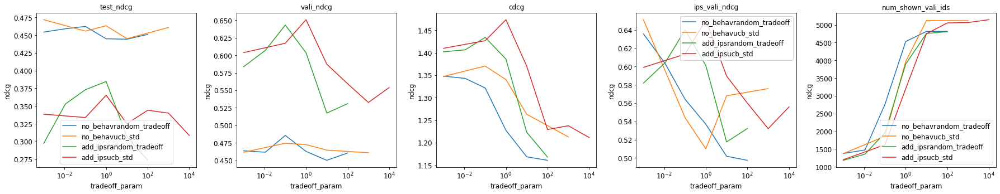

In [1115]:
import utils.evaluation as evl
from results_org import *

# path="addbehaviour_cold_40k_log"
# datasets="MSLR-WEB30k_beh_rm1%"



# result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[21]
# feature_stra=['no_behav','add_ips',"add_click"]
feature_stra=['no_behav','add_ips']
for step in steps:
    fig, axs = plt.subplots(1,5,figsize=(25,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["random_tradeoff"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"random_tradeoff")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"random_tradeoff")
        axs[2].plot(param+0.001,cdcg,label=method+"random_tradeoff")
#         if method=="no_behav":
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"random_tradeoff")
        axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"random_tradeoff")
        random_tradeoff=result_mean[method][datasets]["ucb_std"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"ucb_std")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"ucb_std")
        axs[2].plot(param+0.001,cdcg,label=method+"ucb_std")
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"ucb_std")
        axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"ucb_std")
        axs[3].title.set_text('ips_vali_ndcg')
        axs[3].legend()
        axs[4].title.set_text('num_shown_vali_ids')
        axs[4].legend()
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
        axs[4].set_xscale('log')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

[0.44026388 0.43059965 0.44041227 0.45028388 0.44528134 0.47250179] [1.36775071 1.36738532 1.39243068 1.24158785 1.16951682 1.15890495] ucb
[0.17218012 0.17218012 0.17218012 0.17218012 0.17218012 0.17218012
 0.17218012] [1.5548414  1.6771318  1.6778804  1.64364895 1.19599255 1.16436626
 1.1617515 ] ucb
[0.33867862 0.33454819 0.23084416 0.33695747 0.35976656 0.32155901] [1.54071131 1.61413907 1.70740557 1.64283086 1.19597299 1.15950901] ucb
[] [] ucb


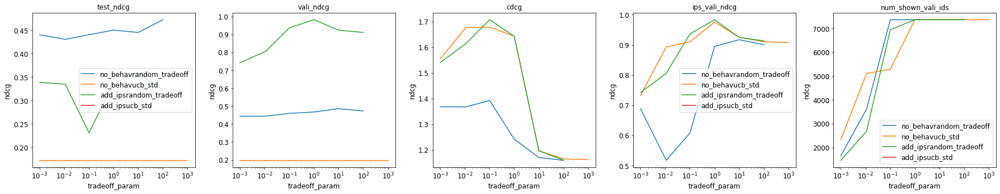

In [1111]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour_cold_200k"
datasets="MSLR-WEB30k_beh_rm1%"



result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[9]
# feature_stra=['no_behav','add_ips',"add_click"]
feature_stra=['no_behav','add_ips']
for step in steps:
    fig, axs = plt.subplots(1,5,figsize=(25,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["ucb"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"random_tradeoff")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"random_tradeoff")
        axs[2].plot(param+0.001,cdcg,label=method+"random_tradeoff")
#         if method=="no_behav":
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"random_tradeoff")
        axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"random_tradeoff")
        
        
        random_tradeoff=result_mean[method][datasets]["ips_ucb"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"ucb_std")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"ucb_std")
        axs[2].plot(param+0.001,cdcg,label=method+"ucb_std")
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"ucb_std")
        axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"ucb_std")
        axs[3].title.set_text('ips_vali_ndcg')
        axs[3].legend()
        axs[4].title.set_text('num_shown_vali_ids')
        axs[4].legend()
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
        axs[4].set_xscale('log')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

/home/taoyang/miniconda3/envs/ultra_p36/lib/python3.6/site-packages/pandas/core/frame.py:7123: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


[0.39956333 0.40188376 0.40398546 0.39803183 0.39772512 0.40619847] [1.28425935 1.29671616 1.23340288 1.15999857 1.15458327 1.16062497] ucb
[0.41511269 0.41227106 0.4164428  0.40649823 0.40242125 0.39799009
 0.40416741] [1.48816439 1.486483   1.46303708 1.2890065  1.16021108 1.16515378
 1.15073265] ucb
[0.39009761 0.39793937 0.40038524 0.36088542 0.36250936 0.34203454] [1.38194612 1.4022066  1.44565092 1.28946923 1.15938508 1.16657901] ucb
[] [] ucb


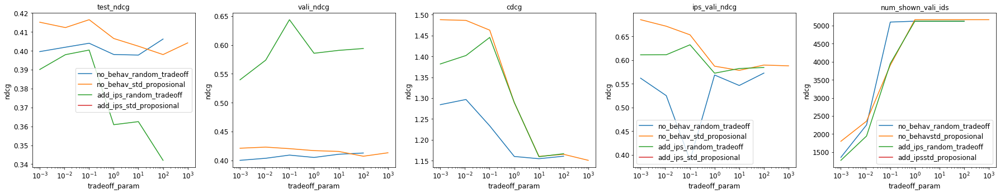

In [1145]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour_cold_20k"
datasets="MSLR-WEB30k_beh_rm1%"



result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[9]
# feature_stra=['no_behav','add_ips',"add_click"]
feature_stra=['no_behav','add_ips']
for step in steps:
    fig, axs = plt.subplots(1,5,figsize=(25,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["ucb"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"_random_tradeoff")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"_random_tradeoff")
        axs[2].plot(param+0.001,cdcg,label=method+"_random_tradeoff")
#         if method=="no_behav":
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"_random_tradeoff")
        axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"_random_tradeoff")
        
        random_tradeoff=result_mean[method][datasets]["merge_ucb"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"_std_proposional")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"_std_proposional")
        axs[2].plot(param+0.001,cdcg,label=method+"_std_proposional")
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"_std_proposional")
        axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"std_proposional")
        axs[3].title.set_text('ips_vali_ndcg')
        axs[3].legend()
        axs[4].title.set_text('num_shown_vali_ids')
        axs[4].legend()
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
        axs[4].set_xscale('log')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

In [1073]:
result_mean["no_behav"][datasets].keys()

dict_keys(['ips_random_tradoeff', 'ucb', 'std_proposional', 'merge_random_tradeoff', 'merge_ucb', 'ips_ucb', 'ucb_std', 'random_tradeoff'])

[0.17218012 0.17218012 0.17218012 0.17218012 0.17218012 0.17218012
 0.17218012] [1.1614297  1.15813062 1.15207931 1.16746982 1.16689264 1.16865706
 1.16161364] ucb
[0.37108628 0.3746254  0.33039872 0.32950483 0.3533006  0.36628114
 0.32949189] [1.14285164 1.15018582 1.14232627 1.15523339 1.15914163 1.1539112
 1.16217261] ucb


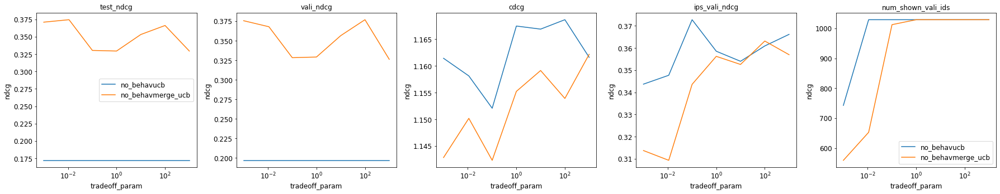

[0.17218012 0.17218012 0.17218012 0.17218012 0.17218012 0.17218012
 0.17218012] [1.29272901 1.28802339 1.30369052 1.26125902 1.16929786 1.16691636
 1.16829535] ucb
[0.38126178 0.38434729 0.39420493 0.38528812 0.3906655  0.3816307
 0.39216921] [1.30015675 1.30218138 1.31689402 1.24332916 1.16257092 1.15369878
 1.16437037] ucb


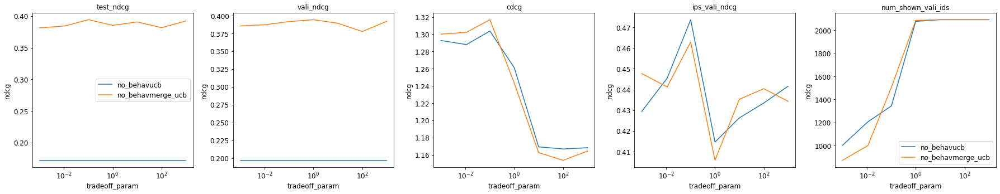

[0.17218012 0.17218012 0.17218012 0.17218012 0.17218012 0.17218012
 0.17218012] [1.31363249 1.35865833 1.36553673 1.26144585 1.18004933 1.16888166
 1.16035082] ucb
[0.39327376 0.39560449 0.39531721 0.40196668 0.39649168 0.39319474
 0.40066494] [1.37633046 1.38474416 1.39124376 1.2584569  1.16690794 1.15739925
 1.16868108] ucb


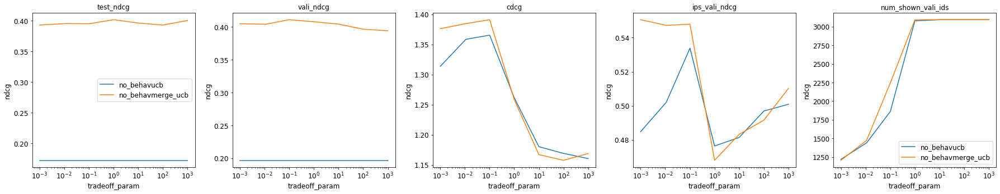

[0.17218012 0.17218012 0.17218012 0.17218012 0.17218012 0.17218012
 0.17218012] [1.36897849 1.4073412  1.44839374 1.32230784 1.16888289 1.15994274
 1.1711978 ] ucb
[0.41511269 0.41227106 0.4164428  0.40649823 0.40242125 0.39799009
 0.40416741] [1.48816439 1.486483   1.46303708 1.2890065  1.16021108 1.16515378
 1.15073265] ucb


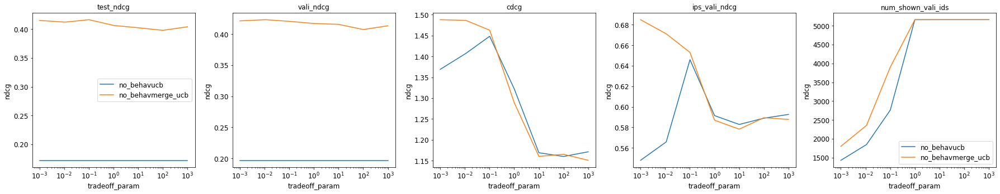

In [1078]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour_cold_20k"
datasets="MSLR-WEB30k_beh_rm1%"



result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[0,2,4,9]
# feature_stra=['no_behav','add_ips',"add_click"]
feature_stra=['no_behav']
for step in steps:
    fig, axs = plt.subplots(1,5,figsize=(25,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]['ips_ucb']['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"ucb")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"ucb")
        axs[2].plot(param+0.001,cdcg,label=method+"ucb")
#         
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"ucb")
        axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"ucb")
        if method=="no_behav":
            random_tradeoff=result_mean[method][datasets]["merge_ucb"]['n_updates_10']
            param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
            param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
            param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
            print(test_ndcg,cdcg,"ucb")
            axs[0].plot(param+0.001,test_ndcg,label=method+"merge_ucb")
            axs[1].plot(param+0.001,vali_ndcg,label=method+"merge_ucb")
            axs[2].plot(param+0.001,cdcg,label=method+"merge_ucb")
            param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
            axs[3].plot(param+0.001,ips,label=method+"merge_ucb")
            axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"merge_ucb")
        axs[3].title.set_text('ips_vali_ndcg')
#         axs[3].legend()
        axs[4].title.set_text('num_shown_vali_ids')
        axs[4].legend()
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
        axs[4].set_xscale('log')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

[0.17218012 0.17218012 0.17218012 0.17218012 0.17218012 0.17218012
 0.17218012] [1.15785545 1.1623274  1.15841783 1.15907321 1.15785817 1.15972516
 1.15964723] ucb
[0.38806452 0.38811174 0.39913156 0.39606662 0.39081254 0.39354599
 0.39913581] [1.12915935 1.13417788 1.15172156 1.15923727 1.16023442 1.1558088
 1.16044981] ucb


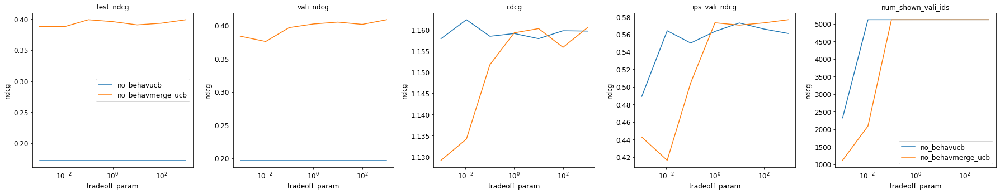

[0.17218012 0.17218012 0.17218012 0.17218012 0.17218012 0.17218012
 0.17218012] [1.45141414 1.43571317 1.45293396 1.37457123 1.1824271  1.1630727
 1.16251913] ucb
[0.38792603 0.39833638 0.41706376 0.42593337 0.40179405 0.4043862
 0.40844085] [1.42673497 1.4267983  1.39968734 1.36735898 1.18674558 1.16496295
 1.16083897] ucb


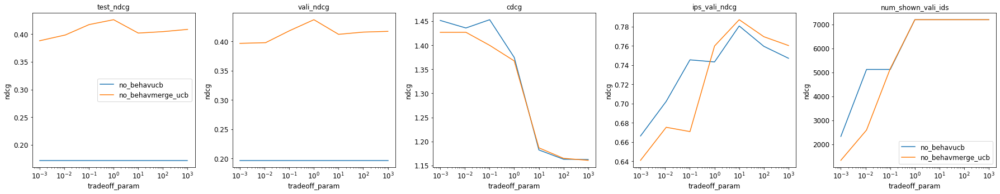

[0.17218012 0.17218012 0.17218012 0.17218012 0.17218012 0.17218012
 0.17218012] [1.52552138 1.60409359 1.61970212 1.50560652 1.18395569 1.16089601
 1.15636978] ucb
[0.41006799 0.40466038 0.41935793 0.42532124 0.44788777 0.43564056
 0.43209717] [1.51341069 1.55189425 1.56245016 1.50902692 1.18593253 1.15848811
 1.16230806] ucb


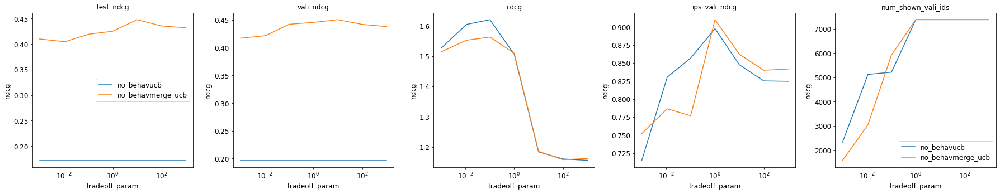

[0.17218012 0.17218012 0.17218012 0.17218012 0.17218012 0.17218012
 0.17218012] [1.5548414  1.6771318  1.6778804  1.64364895 1.19599255 1.16436626
 1.1617515 ] ucb
[0.42455661 0.42692661 0.41488191 0.41064511 0.46630177 0.46982721
 0.4628421 ] [1.61382323 1.64434974 1.671957   1.63680468 1.19773687 1.16187942
 1.16204979] ucb


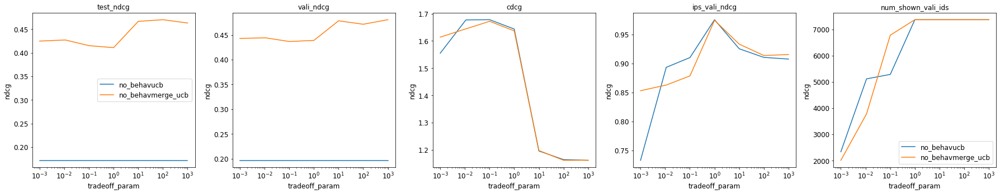

In [1079]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour_cold_200k"
datasets="MSLR-WEB30k_beh_rm1%"



result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[0,2,4,9]
# feature_stra=['no_behav','add_ips',"add_click"]
feature_stra=['no_behav']
for step in steps:
    fig, axs = plt.subplots(1,5,figsize=(25,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]['ips_ucb']['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"ucb")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"ucb")
        axs[2].plot(param+0.001,cdcg,label=method+"ucb")
#         
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"ucb")
        axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"ucb")
        if method=="no_behav":
            random_tradeoff=result_mean[method][datasets]["merge_ucb"]['n_updates_10']
            param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
            param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
            param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
            print(test_ndcg,cdcg,"ucb")
            axs[0].plot(param+0.001,test_ndcg,label=method+"merge_ucb")
            axs[1].plot(param+0.001,vali_ndcg,label=method+"merge_ucb")
            axs[2].plot(param+0.001,cdcg,label=method+"merge_ucb")
            param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
            axs[3].plot(param+0.001,ips,label=method+"merge_ucb")
            axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"merge_ucb")
        axs[3].title.set_text('ips_vali_ndcg')
#         axs[3].legend()
        axs[4].title.set_text('num_shown_vali_ids')
        axs[4].legend()
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
        axs[4].set_xscale('log')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

[0.39956333 0.40188376 0.40398546 0.39803183 0.39772512 0.40619847] [1.28425935 1.29671616 1.23340288 1.15999857 1.15458327 1.16062497] ucb
[0.17218012 0.17218012 0.17218012 0.17218012 0.17218012 0.17218012
 0.17218012] [1.36897849 1.4073412  1.44839374 1.32230784 1.16888289 1.15994274
 1.1711978 ] ucb
[0.39009761 0.39793937 0.40038524 0.36088542 0.36250936 0.34203454] [1.38194612 1.4022066  1.44565092 1.28946923 1.15938508 1.16657901] ucb


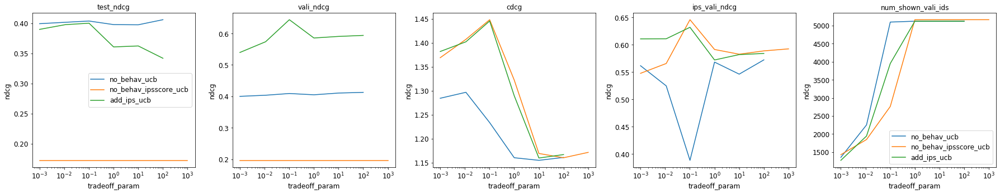

In [1030]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour_cold_20k"
datasets="MSLR-WEB30k_beh_rm1%"



result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[9]
# feature_stra=['no_behav','add_ips',"add_click"]
feature_stra=['no_behav','add_ips']
for step in steps:
    fig, axs = plt.subplots(1,5,figsize=(25,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["ucb"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"_ucb")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"_ucb")
        axs[2].plot(param+0.001,cdcg,label=method+"_ucb")
#         
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"_ucb")
        axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"_ucb")
        if method=="no_behav":
            random_tradeoff=result_mean[method][datasets]["ips_ucb"]['n_updates_10']
            param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
            param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
            param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
            print(test_ndcg,cdcg,"ucb")
            axs[0].plot(param+0.001,test_ndcg,label=method+"_ipsscore_ucb")
            axs[1].plot(param+0.001,vali_ndcg,label=method+"_ipsscore_ucb")
            axs[2].plot(param+0.001,cdcg,label=method+"_ipsscore_ucb")
            param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
            axs[3].plot(param+0.001,ips,label=method+"_ipsscore_ucb")
            axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"_ipsscore_ucb")
        axs[3].title.set_text('ips_vali_ndcg')
#         axs[3].legend()
        axs[4].title.set_text('num_shown_vali_ids')
        axs[4].legend()
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
        axs[4].set_xscale('log')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

In [1021]:
result_mean[method][datasets]["ips_random_tradoeff"]['n_updates_10']

{'tradeoff_10.0':    iterations  initial_test_ndcg  num_existing_item      ndcg       dcg  \
 0        2000            0.17218             3897.6  0.222456  0.408421   
 1        4000            0.17218             5885.6  0.246173  0.450108   
 2        6000            0.17218             7854.0  0.253889  0.466994   
 3        8000            0.17218             9804.2  0.262522  0.483846   
 4       10000            0.17218            11708.0  0.270556  0.498714   
 5       12000            0.17218            13544.6  0.275557  0.509251   
 6       14000            0.17218            15300.0  0.279471  0.513420   
 7       16000            0.17218            16961.6  0.292074  0.536966   
 8       18000            0.17218            18478.8  0.293207  0.541648   
 9       20000            0.17218            19841.0  0.301353  0.554741   
 
        cdcg  num_shown_train_ids_uniq  num_shown_vali_ids_uniq  test_ndcg  \
 0  1.163227                    2521.8                    908.6    

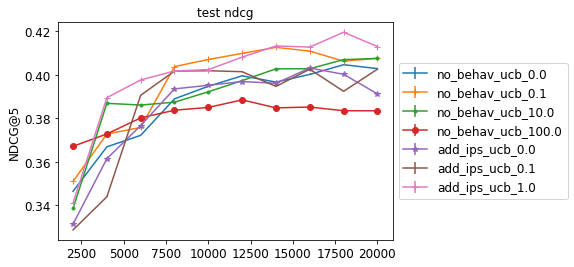

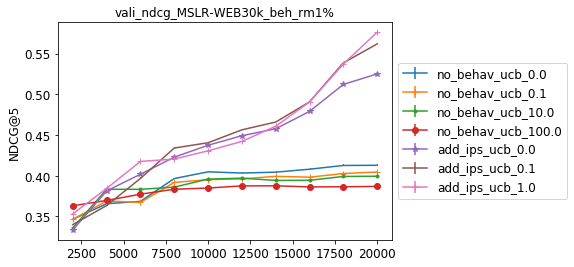

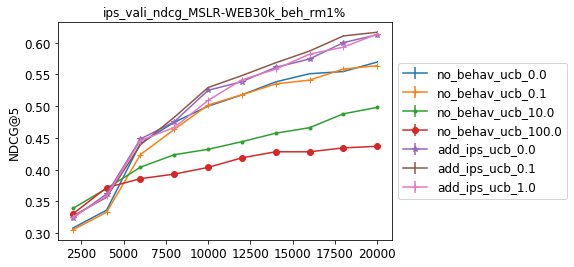

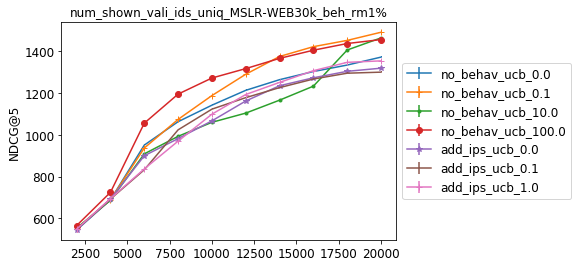

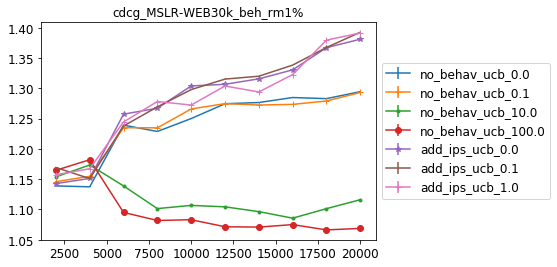

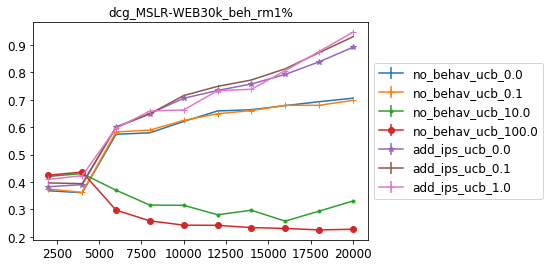

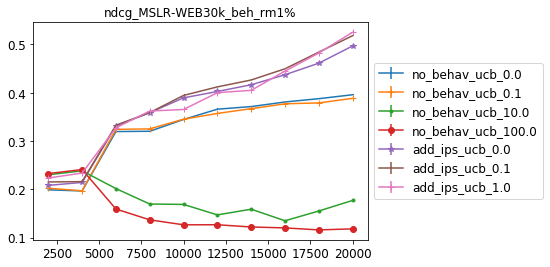

AssertionError: no_behav_ucb_0.0 doesn't contain the partition discounted_sum_cdcg

In [1011]:
from results_org import *
path="addbehaviour_cold_20k"
datasets="MSLR-WEB30k_beh_rm1%"
result,result_mean=get_result_df(path,groupby="iterations")
result_reorg={
#             "direct":result["direct"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],

             "no_behav_ucb_0.0":result_mean["no_behav"][datasets]["std_proposional"]['n_updates_10']['tradeoff_0.0'],
#              "no_behav_ucb_0.01":result_mean["no_behav"][datasets]["ucb_std"]['n_updates_10']['tradeoff_0.01'],
             "no_behav_ucb_0.1":result_mean["no_behav"][datasets]["std_proposional"]['n_updates_10']['tradeoff_0.1'],
             "no_behav_ucb_10.0":result_mean["no_behav"][datasets]["std_proposional"]['n_updates_10']['tradeoff_10.0'],
             "no_behav_ucb_100.0":result_mean["no_behav"][datasets]["std_proposional"]['n_updates_10']['tradeoff_100.0'],

                "add_ips_ucb_0.0":result_mean["add_ips"][datasets]["std_proposional"]['n_updates_10']['tradeoff_0.0'],
#              "add_ips_ucb_0.01":result_mean["add_ips"][datasets]["ucb_std"]['n_updates_10']['tradeoff_0.01'],
             "add_ips_ucb_0.1":result_mean["add_ips"][datasets]["std_proposional"]['n_updates_10']['tradeoff_0.1'],
             "add_ips_ucb_1.0":result_mean["add_ips"][datasets]["std_proposional"]['n_updates_10']['tradeoff_1.0'],

             }
param_plot={"xscale":"linear"}
plot_initial(datasets,result_reorg,param_plot)                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  
plt.xscale("linear")



In [991]:
result_mean["add_ips"][datasets]["ucb_std"]

{'n_updates_10': {'tradeoff_0.0':    iterations  initial_test_ndcg  num_existing_item      ndcg       dcg  \
  0       20000           0.163403              19853  0.204480  0.371058   
  1       40000           0.163403              27205  0.191486  0.343018   
  2       60000           0.163403              29010  0.444627  0.797777   
  3       80000           0.163403              29696  0.635584  1.141991   
  4      100000           0.163403              29974  0.692877  1.236612   
  5      120000           0.163403              29974  0.701486  1.248289   
  6      140000           0.163403              29974  0.713971  1.269936   
  7      160000           0.163403              29974  0.717768  1.272927   
  8      180000           0.163403              29974  0.720931  1.276588   
  9      200000           0.163403              29974  0.720925  1.280479   
  
         cdcg  num_shown_train_ids_uniq  num_shown_vali_ids_uniq  test_ndcg  \
  0  1.135647                      3103

[0.42231134 0.42422062 0.43534204 0.45217132 0.4795886  0.4515747 ] [1.3725307  1.36542698 1.36373666 1.26278522 1.17725464 1.16037109] ucb
[0.43384767 0.42534467 0.44187817 0.45099772 0.44671102 0.45147338
 0.46252645] [1.36922598 1.36203215 1.38542927 1.35317348 1.2883271  1.30999243
 1.28159194] ucb
[0.27593906 0.33827291 0.2187963  0.37393453 0.33695918 0.27611026] [1.54191674 1.57328057 1.68048701 1.58829431 1.2733423  1.16776995] ucb
[0.30833315 0.34945116 0.32926846 0.38477994 0.36116647 0.24200083
 0.24457899] [1.54721859 1.68510949 1.70643173 1.51986242 1.467297   1.23645151
 1.44296846] ucb


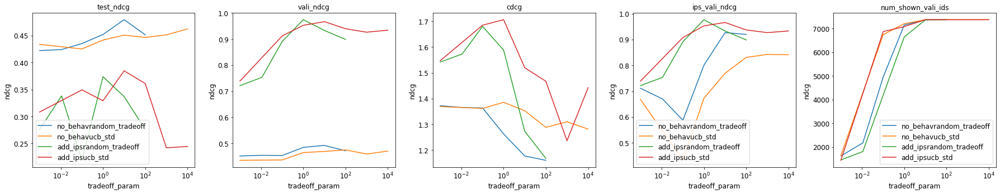

In [982]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour_cold_200k"
datasets="MSLR-WEB30k_beh_rm1%"



result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[9]
# feature_stra=['no_behav','add_ips',"add_click"]
feature_stra=['no_behav','add_ips']
for step in steps:
    fig, axs = plt.subplots(1,5,figsize=(25,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["random_tradeoff"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"random_tradeoff")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"random_tradeoff")
        axs[2].plot(param+0.001,cdcg,label=method+"random_tradeoff")
#         if method=="no_behav":
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"random_tradeoff")
        axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"random_tradeoff")
        random_tradeoff=result_mean[method][datasets]["ucb_std"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"ucb_std")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"ucb_std")
        axs[2].plot(param+0.001,cdcg,label=method+"ucb_std")
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"ucb_std")
        axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"ucb_std")
        axs[3].title.set_text('ips_vali_ndcg')
        axs[3].legend()
        axs[4].title.set_text('num_shown_vali_ids')
        axs[4].legend()
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
        axs[4].set_xscale('log')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

/home/taoyang/miniconda3/envs/ultra_p36/lib/python3.6/site-packages/pandas/core/frame.py:7123: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


[0.41017226 0.40802257 0.4067095  0.40180692 0.38710152 0.40195806] [1.30809761 1.28604245 1.26184393 1.20019863 1.16674148 1.1576367 ] ucb
[0.40166597 0.40915504 0.40503481 0.40288748 0.41365193 0.40281703
 0.40755745 0.41162631 0.40749935 0.38338619 0.38139728 0.37603035] [1.23710341 1.25806075 1.29098856 1.26775423 1.30298379 1.29440099
 1.2930167  1.26919898 1.11600718 1.06866529 1.08047276 1.06111942] ucb
[0.40279625 0.41082424 0.40937389 0.39518031 0.38145307 0.37253195] [1.38506875 1.35391064 1.42100614 1.31723915 1.19395883 1.16461748] ucb
[0.41553676 0.40168805 0.41790427 0.40848739 0.4124301  0.39118625
 0.40253921 0.41298388 0.38729153 0.39690797 0.41560541 0.37519352] [1.22339431 1.2260537  1.38625426 1.4047696  1.41311748 1.3809936
 1.39248508 1.3913088  1.25619444 1.17328572 1.24080073 1.16147549] ucb


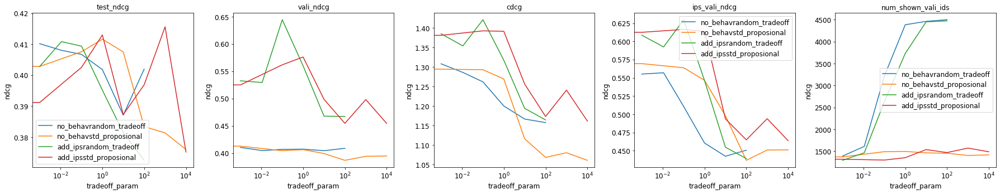

In [975]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour_cold_20k"
datasets="MSLR-WEB30k_beh_rm1%"



result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[9]
# feature_stra=['no_behav','add_ips',"add_click"]
feature_stra=['no_behav','add_ips']
for step in steps:
    fig, axs = plt.subplots(1,5,figsize=(25,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["random_tradeoff"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"random_tradeoff")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"random_tradeoff")
        axs[2].plot(param+0.001,cdcg,label=method+"random_tradeoff")
#         if method=="no_behav":
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"random_tradeoff")
        axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"random_tradeoff")
        
        
        random_tradeoff=result_mean[method][datasets]["std_proposional"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["num_shown_vali_ids_uniq"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"std_proposional")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"std_proposional")
        axs[2].plot(param+0.001,cdcg,label=method+"std_proposional")
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"std_proposional")
        axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"std_proposional")
        axs[3].title.set_text('ips_vali_ndcg')
        axs[3].legend()
        axs[4].title.set_text('num_shown_vali_ids')
        axs[4].legend()
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
        axs[4].set_xscale('log')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

[0.41377591 0.40826475 0.40710481 0.39706115 0.41211923 0.40609493] [1.29538226 1.29542411 1.21314549 1.1615194  1.1552816  1.15465771] ucb
[0.40087002 0.40912899 0.40859014 0.40429115 0.40553785 0.39782656
 0.40018854 0.40812287 0.39775238 0.38621443 0.38203825 0.38873054] [1.23662894 1.24352125 1.28873554 1.29619026 1.29553604 1.29581376
 1.28094326 1.25939148 1.09915055 1.10122616 1.07895108 1.08083543] ucb
[0.40213783 0.41565165 0.40146974 0.37113391 0.37093741 0.37428083] [1.38949154 1.41870984 1.42980442 1.26882029 1.16905211 1.15431642] ucb
[0.41060953 0.41972025 0.4128367  0.40368571 0.39605464 0.40645054
 0.41286501 0.40657747 0.39385345 0.39662255 0.40025511 0.39969738] [1.23046726 1.25106883 1.38120278 1.4026427  1.36587407 1.36935243
 1.38464158 1.38254967 1.19833067 1.18167456 1.2150207  1.20857752] ucb


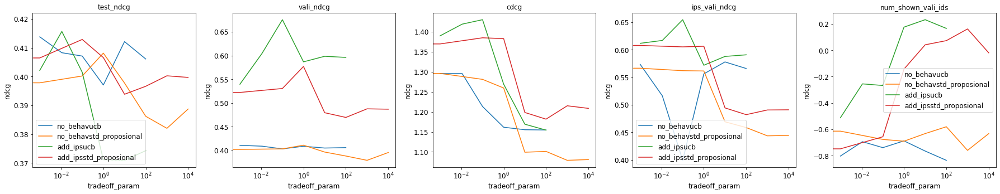

In [1178]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour_cold_20k"
datasets="MSLR-WEB30k_beh_rm1%"



result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[9]
# feature_stra=['no_behav','add_ips',"add_click"]
feature_stra=['no_behav','add_ips']
for step in steps:
    fig, axs = plt.subplots(1,5,figsize=(25,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["ucb"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["mean_std_corr"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"ucb")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"ucb")
        axs[2].plot(param+0.001,cdcg,label=method+"ucb")
#         if method=="no_behav":
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"ucb")
        axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"ucb")
        
        
        random_tradeoff=result_mean[method][datasets]["std_proposional"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        param,num_shown_vali_ids=evl.extract_tradeoff_res(random_tradeoff,["mean_std_corr"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"std_proposional")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"std_proposional")
        axs[2].plot(param+0.001,cdcg,label=method+"std_proposional")
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"std_proposional")
        axs[4].plot(param+0.001,num_shown_vali_ids,label=method+"std_proposional")
        axs[3].title.set_text('ips_vali_ndcg')
        axs[3].legend()
        axs[4].title.set_text('num_shown_vali_ids')
        axs[4].legend()
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
        axs[4].set_xscale('log')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

In [957]:
result_mean["no_behav"][datasets]["random_tradeoff"]['n_updates_10']

{'tradeoff_100.0':    iterations  initial_test_ndcg  num_existing_item      ndcg       dcg  \
 0        2000            0.17218             3897.6  0.220658  0.407321   
 1        4000            0.17218             5885.6  0.224543  0.411475   
 2        6000            0.17218             7854.0  0.226119  0.413693   
 3        8000            0.17218             9804.2  0.223786  0.410657   
 4       10000            0.17218            11708.0  0.225789  0.415002   
 5       12000            0.17218            13544.6  0.221412  0.408049   
 6       14000            0.17218            15300.0  0.221764  0.406032   
 7       16000            0.17218            16961.6  0.222082  0.407583   
 8       18000            0.17218            18478.8  0.226687  0.415938   
 9       20000            0.17218            19841.0  0.221659  0.407704   
 
        cdcg  test_ndcg  ips_train_ndcg  ips_vali_ndcg  vali_ndcg  
 0  1.167977   0.350346        0.331837       0.337948   0.347681  
 1  1.16

KeyError: 'sho'

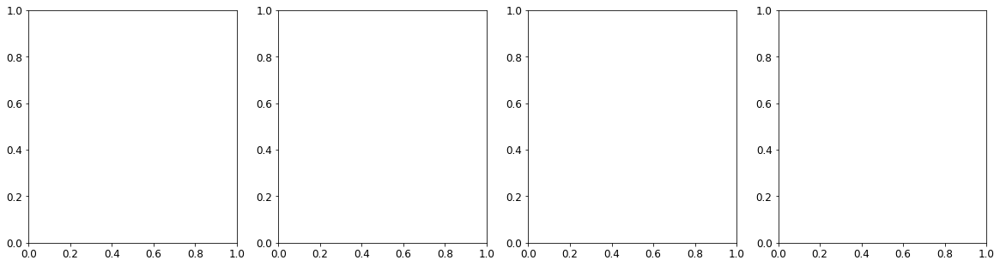

In [953]:
import utils.evaluation as evl
from results_org import *

path="addbehaviour_cold_20k"
datasets="MSLR-WEB30k_beh_rm1%"



result,result_mean=get_result_df(path,groupby="iterations")
# result_reorg={"direct":result["random_tradeoff"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],}
tradeoff_methods=["random_tradeoff","ucb","ucb_std","std_proposional","portfolio_proposional"]
step=11
steps=[9]
# feature_stra=['no_behav','add_ips',"add_click"]
feature_stra=['no_behav','add_ips']
for step in steps:
    fig, axs = plt.subplots(1,4,figsize=(20,5))
#     axs=axs[0]
    for ind,method in enumerate(feature_stra):
        random_tradeoff=result_mean[method][datasets]["random_tradeoff"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["sho","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"random_tradeoff")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"random_tradeoff")
        axs[2].plot(param+0.001,cdcg,label=method+"random_tradeoff")
#         if method=="no_behav":
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"random_tradeoff")
        axs[3].title.set_text('ips_vali_ndcg')
        axs[3].legend()
        random_tradeoff=result_mean[method][datasets]["ucb"]['n_updates_10']
        param,test_ndcg,cdcg=evl.extract_tradeoff_res(random_tradeoff,["test_ndcg","cdcg"],step=step)
        param,vali_ndcg=evl.extract_tradeoff_res(random_tradeoff,["vali_ndcg"],step=step)
        print(test_ndcg,cdcg,"ucb")
        axs[0].plot(param+0.001,test_ndcg,label=method+"ucb")
        axs[1].plot(param+0.001,vali_ndcg,label=method+"ucb")
        axs[2].plot(param+0.001,cdcg,label=method+"ucb")
        param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=step)
        axs[3].plot(param+0.001,ips,label=method+"ucb")
        axs[3].title.set_text('ips_vali_ndcg')
        axs[3].legend()
        axs[0].title.set_text('test_ndcg')
        axs[1].title.set_text('vali_ndcg')
        axs[2].title.set_text('cdcg')
        axs[0].set_xscale('log')
        axs[1].set_xscale('log')
        axs[2].set_xscale('log')
        axs[3].set_xscale('log')
        axs[0].legend()
    for ax in axs:
        ax.set_xlabel("tradeoff_param")
        ax.set_ylabel("ndcg")
    fig.tight_layout()
    plt.legend()
    plt.show()

In [952]:
result_mean[method][datasets]["random_tradeoff"]['n_updates_10']

{'tradeoff_0.0':    iterations  initial_test_ndcg      ndcg       dcg      cdcg  test_ndcg  \
 0        2000           0.205364  0.224573  0.404982  1.152756   0.324465   
 1        4000           0.205364  0.224975  0.403589  1.168928   0.353756   
 2        6000           0.205364  0.362653  0.655732  1.274118   0.377916   
 3        8000           0.205364  0.383212  0.692987  1.276312   0.402864   
 4       10000           0.205364  0.414276  0.750082  1.311507   0.400142   
 5       12000           0.205364  0.431118  0.777394  1.330998   0.393326   
 6       14000           0.205364  0.443332  0.798323  1.335518   0.393231   
 7       16000           0.205364  0.466029  0.833706  1.370611   0.402386   
 8       18000           0.205364  0.488384  0.881098  1.375561   0.408199   
 9       20000           0.205364  0.536194  0.959662  1.408480   0.411603   
 
    ips_train_ndcg  ips_vali_ndcg  vali_ndcg  
 0        0.294599       0.324958   0.350613  
 1        0.313667       0.334

[0.41377591 0.40826475 0.40710481 0.39706115 0.41211923 0.40609493] [1.29538226 1.29542411 1.21314549 1.1615194  1.1552816  1.15465771] ucb
[0.40391251 0.40695205 0.4056436  0.40271689 0.40147227 0.40163755
 0.39467899] [1.28716687 1.29257844 1.20327864 1.14280547 1.13961068 1.14991388
 1.14846454] ucb_std
[0.40213783 0.41565165 0.40146974 0.37113391 0.37093741 0.37428083] [1.38949154 1.41870984 1.42980442 1.26882029 1.16905211 1.15431642] ucb
[0.40386228 0.40011078 0.40127458 0.40458011 0.36671833 0.36977759
 0.37705262] [1.38584358 1.45814634 1.42530724 1.28190723 1.22990842 1.23071445
 1.23099883] ucb_std


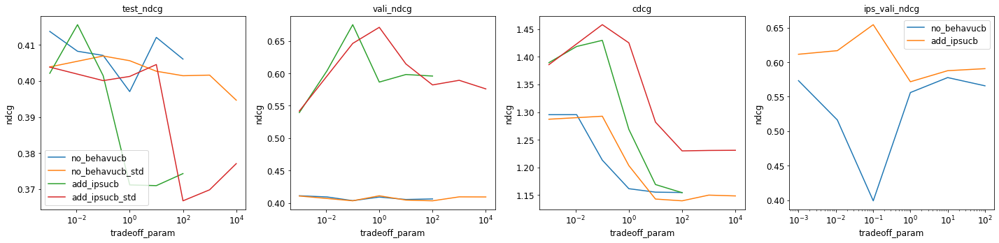

In [936]:
random_tradeoff

{'tradeoff_100.0':    iterations  initial_test_ndcg      ndcg       dcg      cdcg  test_ndcg  \
 0        2000           0.205364  0.223594  0.410374  1.158831   0.298420   
 1        4000           0.205364  0.223189  0.409067  1.151627   0.368012   
 2        6000           0.205364  0.184138  0.342357  1.128636   0.402696   
 3        8000           0.205364  0.198333  0.366917  1.142719   0.400208   
 4       10000           0.205364  0.219725  0.410562  1.165223   0.395510   
 5       12000           0.205364  0.235766  0.434866  1.173775   0.405096   
 6       14000           0.205364  0.293713  0.539975  1.231637   0.400953   
 7       16000           0.205364  0.364165  0.668912  1.282835   0.374158   
 8       18000           0.205364  0.343895  0.637067  1.268399   0.348275   
 9       20000           0.205364  0.321458  0.594314  1.234880   0.331084   
 
    ips_train_ndcg  ips_vali_ndcg  vali_ndcg  
 0        0.357518       0.401294   0.328199  
 1        0.396934       0.4

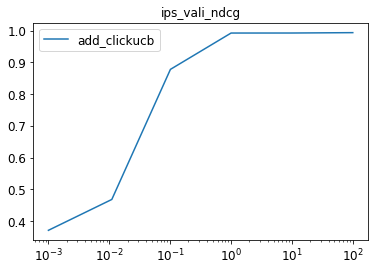

In [933]:
random_tradeoff=result_mean['no_behav'][datasets]["ucb"]['n_updates_10']
param,ips=evl.extract_tradeoff_res(random_tradeoff,["ips_vali_ndcg"],step=9)
plt.plot(param+0.001,ips,label=method+"ucb")
plt.title('ips_vali_ndcg')
plt.xscale("log")
plt.legend()

In [887]:
result_mean['no_behav'][datasets]["ucb"]['n_updates_10']

{'tradeoff_100.0':    iterations  initial_test_ndcg      ndcg       dcg      cdcg  test_ndcg  \
 0      100000           0.205364  0.222650  0.409844  1.158822   0.205364   
 1      200000           0.205364  0.222955  0.410251  1.159383   0.205364   
 2      300000           0.205364  0.222725  0.410186  1.160639   0.205364   
 3      400000           0.205364  0.222706  0.409960  1.159789   0.205364   
 4      500000           0.205364  0.222953  0.410114  1.159327   0.205364   
 5      600000           0.205364  0.222870  0.410379  1.159154   0.205364   
 6      700000           0.205364  0.222928  0.410290  1.158075   0.205364   
 7      800000           0.205364  0.222784  0.410192  1.160643   0.205364   
 8      900000           0.205364  0.223126  0.410078  1.159086   0.205364   
 9     1000000           0.205364  0.222748  0.410123  1.159504   0.205364   
 
    ips_train_ndcg  ips_vali_ndcg  vali_ndcg  
 0        0.381268       0.378564   0.235975  
 1        0.477276       0.4

In [79]:
from results_org import *
# datasets="Webscope_C14_Set1"
# datasets="istella-s"
datasets=""
path="pretrained"
result,result_mean=get_result_df(path,groupby="iterations")

In [80]:
WEB30k_beh_rm=result_mean['MSLR-WEB30k_beh_rm']['supervised']


In [81]:
WEB30k=result_mean['MSLR-WEB30k']['supervised']

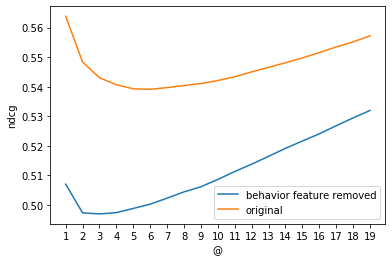

In [82]:
beh_rm=WEB30k_beh_rm.iloc[0,1:].tolist()
beh_cont=WEB30k.iloc[0,1:].tolist()
keys=list(range(1,20))
plt.plot(keys,beh_rm,label="behavior feature removed")
plt.plot(keys,beh_cont,label="original")
plt.xticks(keys)
plt.xlabel("@")
plt.ylabel("ndcg")
plt.legend()

In [16]:
a=np.ones(10)

In [17]:
1 in a

True

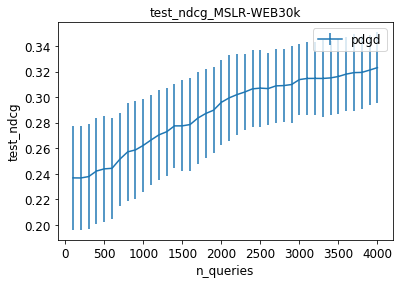

AssertionError: pdgd doesn't contain the partition vali_ndcg

In [338]:
from results_org import *
datasets="Webscope_C14_Set1"
# datasets="istella-s"
datasets="MSLR-WEB30k"
path="local_output_point_wise_good_initial_model_shownlist_toy_sessionaware_pdgd/"+datasets
result,result_mean=get_result_df(path,groupby="iterations")
# random_tradeoff_param=get_best_tradeoff_param(result_mean["random_tradeoff"]['n_updates_40'],vali_name="vali_ndcg",step=39)
# std_proposional_param=get_best_tradeoff_param(result_mean["std_proposional"]['n_updates_40'],vali_name="vali_ndcg",step=39)

result_reorg={
#             "direct":result["direct"]['n_updates_10'],
#              "random":result["random"]['n_updates_10'],
#              "poor":result["poor"]['n_updates_10'],
#              "random_tradeoff":result["random_tradeoff"]['n_updates_40'][random_tradeoff_param],
#               "std_pro_tradeoff":result["std_proposional"]['n_updates_40'][std_proposional_param],
                "pdgd":result["gumbel"]['n_updates_40']['tradeoff_1.0']
#
             }
param_plot={"xscale":"linear"}
plot_initial(datasets,result_reorg,param_plot)
plt.xscale("linear")